In [1]:
import sys
sys.version

'2.7.12 (default, Nov 12 2018, 14:36:49) \n[GCC 5.4.0 20160609]'

# Data Process

In [2]:
#import pyrealsense2 as rs
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import joblib
#import scipy.misc
import tensorflow as tf
#from skimage.restoration import denoise_tv_chambolle
from tensorboardX import SummaryWriter

In [3]:
pp_path = '/home/obin/t2b_dataset/pickandplace'
data_list = np.sort([pp_path+'/data/'+x for x in os.listdir(os.path.join(pp_path,'data'))])
pp_path = '/home/obin/t2b_dataset/pickandplace/0202'
data_list2 = np.sort([pp_path+'/data/'+x for x in os.listdir(os.path.join(pp_path,'data'))])
data_list = np.hstack((data_list,data_list2))
num_data = len(data_list)
print('num of data : ', num_data)

('num of data : ', 222)


In [4]:
def pretty_print_input(arr, ori = False):
    arr = np.squeeze(arr)
    if ori == True : 
        s_x, s_y, s_d, s_ori = arr[0:4]
        g_x, g_y, g_d, g_ori = arr[4:8]
        
        print('start pixel        goal pixek')
        print('x : %04f    x : %04f'%(s_x,g_x))
        print('y : %04f    y : %04f'%(s_y,g_y))
        print('z : %04f    z : %04f'%(s_d,g_d))
        print('o : %04f    o : %04f'%(s_ori,g_ori))
        print('\n')
    else : 
        s_x, s_y, s_d = arr[0:3]
        g_x, g_y, g_d = arr[3:6]
        
        print('start pixel        goal pixek')
        print('x : %04f    x : %04f'%(s_x,g_x))
        print('y : %04f    y : %04f'%(s_y,g_y))
        print('z : %04f    z : %04f'%(s_d,g_d))
        print('\n')
    
    
def pretty_print_out(arr):
    arr = np.squeeze(arr)
    s_px, s_py, s_pz, s_ox, s_oy, s_oz, s_ow = arr[0:7]
    g_px, g_py, g_pz, g_ox, g_oy, g_oz, g_ow = arr[7:14]
    
    print('start pose        goal pose')
    print('x : %04f    x : %04f'%(s_px,g_px))
    print('y : %04f    y : %04f'%(s_py,g_py))
    print('z : %04f    z : %04f'%(s_pz,g_pz))
    print('x : %04f    x : %04f'%(s_ox,g_ox))
    print('y : %04f    y : %04f'%(s_oy,g_oy))
    print('z : %04f    z : %04f'%(s_oz,g_oz))
    print('w : %04f    w : %04f'%(s_ow,g_ow))
    print('\n')
    


## depth image preprocess

In [5]:
np.random.shuffle(data_list)
data_list

array(['/home/obin/t2b_dataset/pickandplace/data/0076.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0113.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0002.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0027.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0045.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0083.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0022.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0131.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0085.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0081.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0132.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0084.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/0202/data/0038.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0136.dat.gz',
       '/home/obin/t2b_dataset/pickandplace/data/0165.dat.gz',
       '/home/obin/t2b_dataset

-----------data 0----------


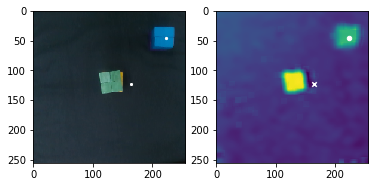

start pix : (223,46,0.790753542709) -> goal pix : (164,123,0.134432854254)
start pixel        goal pixek
x : 223.000000    x : 164.000000
y : 46.000000    y : 123.000000
z : 0.790754    z : 0.134433
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.609000    x : 0.729854
y : 0.159913    y : 0.080530
z : -0.156211    z : -0.183483
x : 0.031282    x : 0.721345
y : 0.996200    y : 0.687770
z : 0.037584    z : 0.005822
w : 0.072070    w : 0.081240


-----------data 1----------


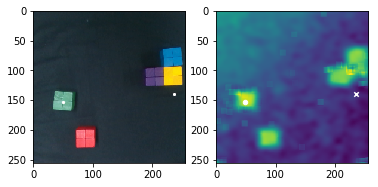

start pix : (49,153,0.520418697678) -> goal pix : (236,140,0.14960491609)
start pixel        goal pixek
x : 49.000000    x : 236.000000
y : 153.000000    y : 140.000000
z : 0.520419    z : 0.149605
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.767249    x : 0.755721
y : -0.117574    y : 0.192348
z : -0.201861    z : -0.191422
x : 0.036263    x : 0.010296
y : 0.994901    y : 0.996463
z : -0.003497    z : 0.032648
w : 0.094042    w : 0.076748


-----------data 2----------


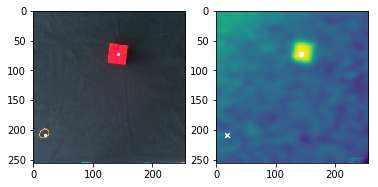

start pix : (142,73,0.49803739935) -> goal pix : (19,208,0.177820023695)
start pixel        goal pixek
x : 142.000000    x : 19.000000
y : 73.000000    y : 208.000000
z : 0.498037    z : 0.177820
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.624417    x : 0.856450
y : 0.037286    y : -0.190068
z : -0.215833    z : -0.223209
x : 0.029338    x : -0.097419
y : 0.999186    y : 0.990576
z : 0.008600    z : -0.033416
w : 0.026320    w : 0.090294


-----------data 3----------


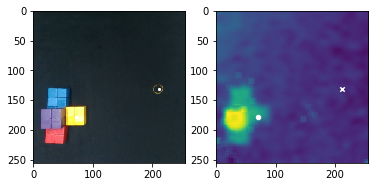

start pix : (71,178,0.479385011258) -> goal pix : (211,131,0.147093543262)
start pixel        goal pixek
x : 71.000000    x : 211.000000
y : 178.000000    y : 131.000000
z : 0.479385    z : 0.147094
o : 2.000000    o : 2.000000


start pose        goal pose
x : 0.796795    x : 0.721449
y : -0.080640    y : 0.154136
z : -0.205382    z : -0.202106
x : -0.706776    x : -0.688356
y : 0.706697    y : 0.722047
z : 0.003716    z : 0.051539
w : 0.032134    w : 0.046457


-----------data 4----------


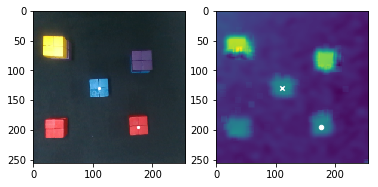

start pix : (176,195,0.477895281473) -> goal pix : (111,130,0.490624500752)
start pixel        goal pixek
x : 176.000000    x : 111.000000
y : 195.000000    y : 130.000000
z : 0.477895    z : 0.490625
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.844483    x : 0.738576
y : 0.087583    y : -0.027614
z : -0.199600    z : -0.135768
x : -0.028298    x : -0.029484
y : 0.983896    y : 0.980959
z : 0.021845    z : 0.003175
w : 0.175129    w : 0.191935


-----------data 5----------


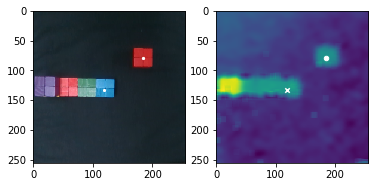

start pix : (185,80,0.516957609702) -> goal pix : (119,133,0.509371114917)
start pixel        goal pixek
x : 185.000000    x : 119.000000
y : 80.000000    y : 133.000000
z : 0.516958    z : 0.509371
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.667418    x : 0.751611
y : 0.105486    y : -0.003065
z : -0.196232    z : -0.139696
x : -0.011167    x : 0.001206
y : 0.993305    y : 0.995439
z : 0.024238    z : -0.014582
w : 0.112399    w : 0.094271


-----------data 6----------


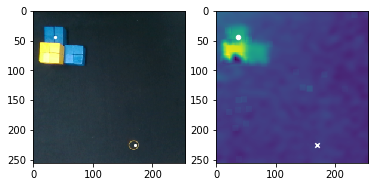

start pix : (36,44,0.558712869999) -> goal pix : (170,225,0.163077014584)
start pixel        goal pixek
x : 36.000000    x : 170.000000
y : 44.000000    y : 225.000000
z : 0.558713    z : 0.163077
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.569893    x : 0.896851
y : -0.142214    y : 0.074371
z : -0.202826    z : -0.192807
x : 0.012136    x : -0.024004
y : 0.999467    y : 0.986616
z : -0.007899    z : 0.012392
w : 0.029251    w : 0.160809


-----------data 7----------


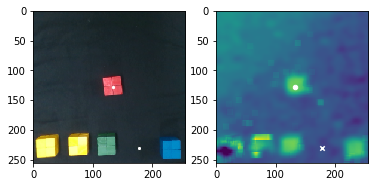

start pix : (133,128,0.493682825879) -> goal pix : (178,230,0.144805620136)
start pixel        goal pixek
x : 133.000000    x : 178.000000
y : 128.000000    y : 230.000000
z : 0.493683    z : 0.144806
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.731958    x : 0.902187
y : 0.025931    y : 0.103583
z : -0.193602    z : -0.188163
x : -0.054301    x : -0.013507
y : 0.994240    y : 0.984279
z : 0.022123    z : 0.048261
w : 0.089712    w : 0.169362


-----------data 8----------


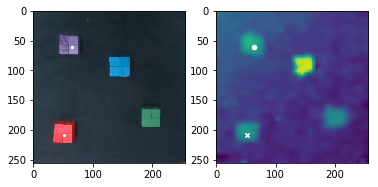

start pix : (64,61,0.532057654123) -> goal pix : (52,208,0.449101198458)
start pixel        goal pixek
x : 64.000000    x : 52.000000
y : 61.000000    y : 208.000000
z : 0.532058    z : 0.449101
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.617784    x : 0.863259
y : -0.099432    y : -0.118000
z : -0.206812    z : -0.155553
x : 0.034784    x : 0.032294
y : 0.998777    y : 0.996354
z : -0.008378    z : -0.014452
w : 0.034123    w : 0.077630


-----------data 9----------


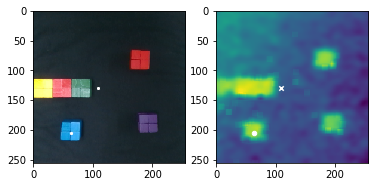

start pix : (63,205,0.481461244121) -> goal pix : (109,130,0.195145336621)
start pixel        goal pixek
x : 63.000000    x : 109.000000
y : 205.000000    y : 130.000000
z : 0.481461    z : 0.195145
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.851543    x : 0.727482
y : -0.095186    y : -0.006704
z : -0.201675    z : -0.197440
x : 0.006800    x : -0.694445
y : 0.988086    y : 0.702705
z : -0.016054    z : 0.062307
w : 0.152912    w : 0.141671


-----------data 10----------


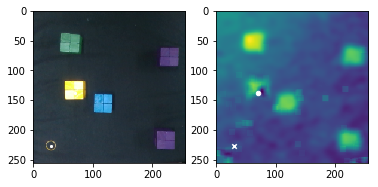

start pix : (70,138,0.270886187793) -> goal pix : (30,227,0.181656966154)
start pixel        goal pixek
x : 70.000000    x : 30.000000
y : 138.000000    y : 227.000000
z : 0.270886    z : 0.181657
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.742347    x : 0.906499
y : -0.084805    y : -0.157794
z : -0.197544    z : -0.194823
x : 0.006977    x : -0.028688
y : 0.998947    y : 0.994077
z : 0.013730    z : 0.017058
w : 0.043228    w : 0.103422


-----------data 11----------


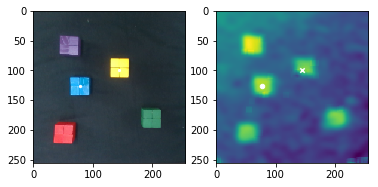

start pix : (78,127,0.513480070717) -> goal pix : (144,99,0.473130006515)
start pixel        goal pixek
x : 78.000000    x : 144.000000
y : 127.000000    y : 99.000000
z : 0.513480    z : 0.473130
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.731863    x : 0.688553
y : -0.072142    y : 0.039080
z : -0.209643    z : -0.152761
x : 0.008107    x : 0.002687
y : 0.997498    y : 0.992803
z : -0.004042    z : -0.015411
w : 0.070119    w : 0.118734


-----------data 12----------


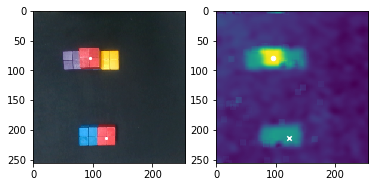

start pix : (95,80,0.798476337133) -> goal pix : (122,214,0.453407000771)
start pixel        goal pixek
x : 95.000000    x : 122.000000
y : 80.000000    y : 214.000000
z : 0.798476    z : 0.453407
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.636541    x : 0.848044
y : -0.045246    y : -0.063285
z : -0.152541    z : -0.153489
x : 0.035131    x : 0.032828
y : 0.997255    y : 0.997932
z : -0.036554    z : -0.022936
w : 0.053964    w : 0.050272


-----------data 13----------


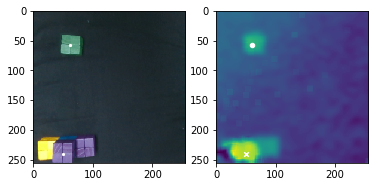

start pix : (61,58,0.577900353294) -> goal pix : (50,240,0.79849855393)
start pixel        goal pixek
x : 61.000000    x : 50.000000
y : 58.000000    y : 240.000000
z : 0.577900    z : 0.798499
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.619808    x : 0.911184
y : -0.093488    y : -0.104727
z : -0.185202    z : -0.076595
x : 0.006924    x : -0.022683
y : 0.998617    y : 0.992504
z : 0.048085    z : 0.029384
w : 0.020092    w : 0.116436


-----------data 14----------


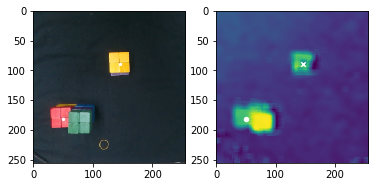

start pix : (50,181,0.811431219656) -> goal pix : (146,89,0.611572565269)
start pixel        goal pixek
x : 50.000000    x : 146.000000
y : 181.000000    y : 89.000000
z : 0.811431    z : 0.611573
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.818060    x : 0.685565
y : -0.119565    y : 0.033840
z : -0.157170    z : -0.099729
x : -0.699624    x : -0.028824
y : 0.708004    y : 0.995750
z : 0.031232    z : 0.006324
w : 0.091004    w : 0.087241


-----------data 15----------


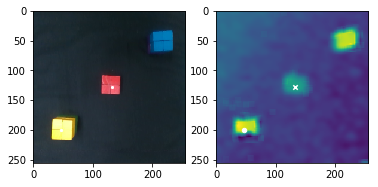

start pix : (47,201,0.782462299405) -> goal pix : (132,128,0.509646627606)
start pixel        goal pixek
x : 47.000000    x : 132.000000
y : 201.000000    y : 128.000000
z : 0.782462    z : 0.509647
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.846554    x : 0.735858
y : -0.104094    y : 0.024849
z : -0.144830    z : -0.137471
x : 0.009920    x : 0.023852
y : 0.985201    y : 0.982540
z : -0.023200    z : -0.015041
w : 0.169538    w : 0.183902


-----------data 16----------


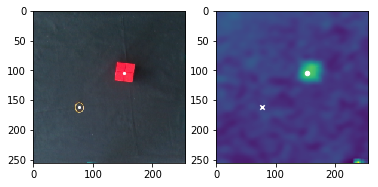

start pix : (153,105,0.464084254764) -> goal pix : (77,162,0.155654903747)
start pixel        goal pixek
x : 153.000000    x : 77.000000
y : 105.000000    y : 162.000000
z : 0.464084    z : 0.155655
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.687772    x : 0.830425
y : 0.044953    y : -0.079795
z : -0.206434    z : -0.214795
x : -0.078579    x : -0.152367
y : 0.993477    y : 0.984445
z : 0.013617    z : 0.008588
w : 0.081506    w : 0.087055


-----------data 17----------


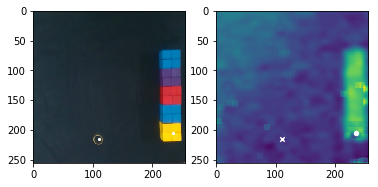

start pix : (235,206,0.265196161065) -> goal pix : (110,216,0.156189498462)
start pixel        goal pixek
x : 235.000000    x : 110.000000
y : 206.000000    y : 216.000000
z : 0.265196    z : 0.156189
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.879659    x : 0.900548
y : 0.181875    y : -0.033152
z : -0.204031    z : -0.201828
x : -0.017890    x : -0.043767
y : 0.967237    y : 0.965762
z : -0.002991    z : -0.009265
w : 0.253228    w : 0.255543


-----------data 18----------


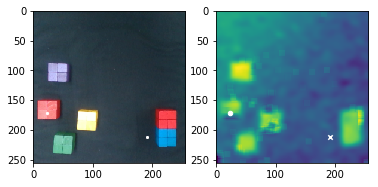

start pix : (23,171,0.416279250949) -> goal pix : (191,212,0.154740348918)
start pixel        goal pixek
x : 23.000000    x : 191.000000
y : 171.000000    y : 212.000000
z : 0.416279    z : 0.154740
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.798591    x : 0.882886
y : -0.155507    y : 0.133524
z : -0.195085    z : -0.178428
x : 0.000537    x : -0.719476
y : 0.990818    y : 0.659208
z : -0.026791    z : 0.003892
w : 0.132523    w : 0.218597


-----------data 19----------


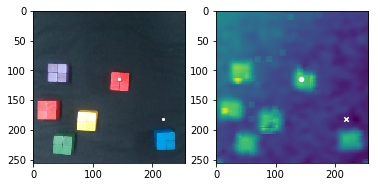

start pix : (143,115,0.499827068092) -> goal pix : (218,182,0.0970691954215)
start pixel        goal pixek
x : 143.000000    x : 218.000000
y : 115.000000    y : 182.000000
z : 0.499827    z : 0.097069
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.716073    x : 0.833837
y : 0.045350    y : 0.175184
z : -0.202191    z : -0.199971
x : -0.007049    x : -0.047795
y : 0.991262    y : 0.979411
z : -0.011954    z : 0.015393
w : 0.131174    w : 0.195532


-----------data 20----------


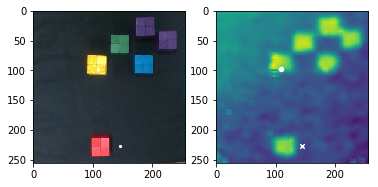

start pix : (109,98,0.388456697046) -> goal pix : (145,228,0.131325542312)
start pixel        goal pixek
x : 109.000000    x : 145.000000
y : 98.000000    y : 228.000000
z : 0.388457    z : 0.131326
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.676514    x : 0.900601
y : -0.015641    y : 0.052155
z : -0.194028    z : -0.184364
x : -0.007130    x : -0.708846
y : 0.998345    y : 0.687053
z : 0.024555    z : -0.039022
w : 0.051520    w : 0.154833


-----------data 21----------


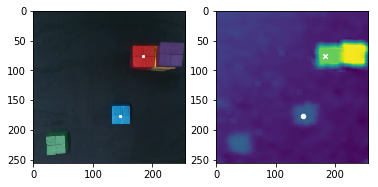

start pix : (146,177,0.492335792218) -> goal pix : (184,76,1.15638404805)
start pixel        goal pixek
x : 146.000000    x : 184.000000
y : 177.000000    y : 76.000000
z : 0.492336    z : 1.156384
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.813907    x : 0.656975
y : 0.052729    y : 0.105538
z : -0.187568    z : -0.031490
x : -0.020781    x : -0.687425
y : 0.991635    y : 0.714434
z : 0.040584    z : 0.098556
w : 0.120754    w : 0.085541


-----------data 22----------


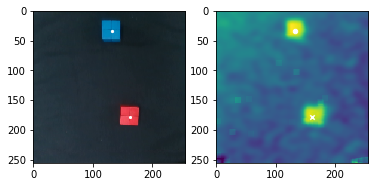

start pix : (132,33,0.504283053507) -> goal pix : (162,178,0.472463836282)
start pixel        goal pixek
x : 132.000000    x : 162.000000
y : 33.000000    y : 178.000000
z : 0.504283    z : 0.472464
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.573285    x : 0.822622
y : 0.010760    y : 0.052869
z : -0.207535    z : -0.150223
x : -0.048992    x : 0.015886
y : 0.992040    y : 0.990926
z : -0.047899    z : -0.039289
w : 0.105652    w : 0.127552


-----------data 23----------


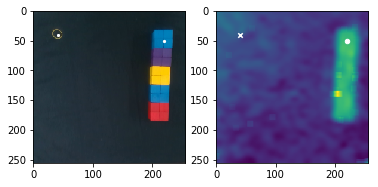

start pix : (220,51,0.462046026456) -> goal pix : (41,41,0.234540831346)
start pixel        goal pixek
x : 220.000000    x : 41.000000
y : 51.000000    y : 41.000000
z : 0.462046    z : 0.234541
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.601650    x : 0.559576
y : 0.152233    y : -0.148586
z : -0.207535    z : -0.204883
x : 0.035674    x : 0.008711
y : 0.995229    y : 0.995928
z : -0.005289    z : -0.007464
w : 0.090651    w : 0.089421


-----------data 24----------


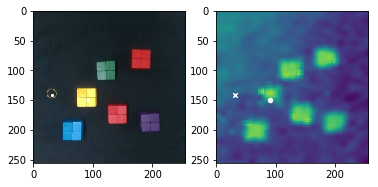

start pix : (91,150,0.347194820527) -> goal pix : (31,142,0.235011982052)
start pixel        goal pixek
x : 91.000000    x : 31.000000
y : 150.000000    y : 142.000000
z : 0.347195    z : 0.235012
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.751505    x : 0.741908
y : -0.049111    y : -0.161869
z : -0.198493    z : -0.193056
x : 0.006029    x : -0.002985
y : 0.994571    y : 0.994604
z : -0.010856    z : -0.031071
w : 0.103315    w : 0.098941


-----------data 25----------


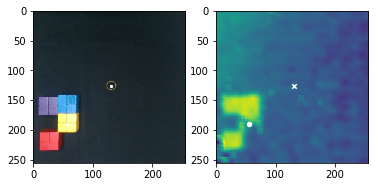

start pix : (56,190,0.287567290936) -> goal pix : (131,126,0.193401244863)
start pixel        goal pixek
x : 56.000000    x : 131.000000
y : 190.000000    y : 126.000000
z : 0.287567    z : 0.193401
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.821970    x : 0.715823
y : -0.106203    y : 0.019036
z : -0.201467    z : -0.196746
x : -0.009968    x : -0.079770
y : 0.996960    y : 0.995098
z : -0.022308    z : 0.012993
w : 0.073980    w : 0.056982


-----------data 26----------


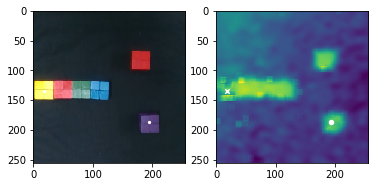

start pix : (194,187,0.440053904552) -> goal pix : (18,135,0.446267311802)
start pixel        goal pixek
x : 194.000000    x : 18.000000
y : 187.000000    y : 135.000000
z : 0.440054    z : 0.446267
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.844948    x : 0.746117
y : 0.134363    y : -0.164484
z : -0.199761    z : -0.142781
x : -0.051352    x : -0.007856
y : 0.979374    y : 0.984841
z : 0.017845    z : -0.012874
w : 0.194607    w : 0.172804


-----------data 27----------


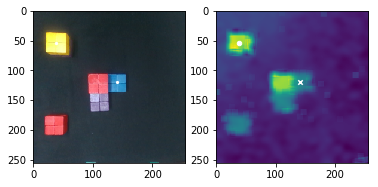

start pix : (38,54,0.867884534638) -> goal pix : (141,120,0.499614454165)
start pixel        goal pixek
x : 38.000000    x : 141.000000
y : 54.000000    y : 120.000000
z : 0.867885    z : 0.499614
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.626248    x : 0.717038
y : -0.127321    y : 0.039322
z : -0.153293    z : -0.145686
x : 0.018193    x : -0.712673
y : 0.995977    y : 0.699641
z : -0.035781    z : 0.012066
w : 0.080114    w : 0.049542


-----------data 28----------


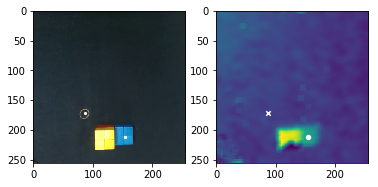

start pix : (154,212,0.472793556327) -> goal pix : (87,172,0.159092285669)
start pixel        goal pixek
x : 154.000000    x : 87.000000
y : 212.000000    y : 172.000000
z : 0.472794    z : 0.159092
o : 2.000000    o : 2.000000


start pose        goal pose
x : 0.864916    x : 0.795651
y : 0.065217    y : -0.051751
z : -0.200355    z : -0.193070
x : -0.714409    x : -0.735115
y : 0.685229    y : 0.668145
z : -0.118745    z : -0.071574
w : 0.077330    w : 0.089808


-----------data 29----------


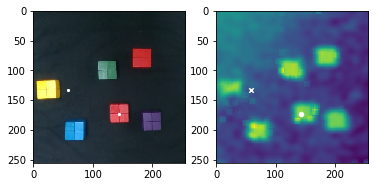

start pix : (143,173,0.469486834395) -> goal pix : (58,133,0.211925271956)
start pixel        goal pixek
x : 143.000000    x : 58.000000
y : 173.000000    y : 133.000000
z : 0.469487    z : 0.211925
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.823349    x : 0.728239
y : 0.032330    y : -0.136735
z : -0.198601    z : -0.192878
x : -0.006669    x : 0.675118
y : 0.986446    y : 0.714807
z : 0.018753    z : -0.110625
w : 0.162875    w : 0.145011


-----------data 30----------


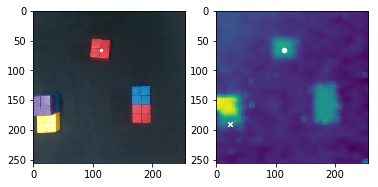

start pix : (114,66,0.510729761534) -> goal pix : (23,191,0.305525973802)
start pixel        goal pixek
x : 114.000000    x : 23.000000
y : 66.000000    y : 191.000000
z : 0.510730    z : 0.305526
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.619319    x : 0.822317
y : -0.027582    y : -0.174092
z : -0.199481    z : -0.144640
x : 0.066733    x : -0.007706
y : 0.993358    y : 0.999147
z : -0.041647    z : -0.026377
w : 0.083972    w : 0.030829


-----------data 31----------


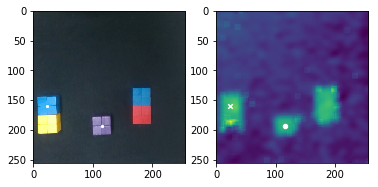

start pix : (116,193,0.439819130794) -> goal pix : (23,160,0.475466631625)
start pixel        goal pixek
x : 116.000000    x : 23.000000
y : 193.000000    y : 160.000000
z : 0.439819    z : 0.475467
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.827900    x : 0.766274
y : -0.028072    y : -0.172276
z : -0.212295    z : -0.155444
x : 0.043035    x : 0.017777
y : 0.997734    y : 0.999575
z : -0.018449    z : -0.001700
w : 0.048306    w : 0.023027


-----------data 32----------


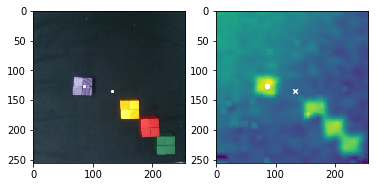

start pix : (85,127,0.525258036762) -> goal pix : (132,134,0.182837687157)
start pixel        goal pixek
x : 85.000000    x : 132.000000
y : 127.000000    y : 134.000000
z : 0.525258    z : 0.182838
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.734498    x : 0.754701
y : -0.054775    y : 0.020962
z : -0.197671    z : -0.197197
x : -0.050217    x : -0.074478
y : 0.994665    y : 0.990333
z : -0.011843    z : -0.007213
w : 0.089330    w : 0.116800


-----------data 33----------


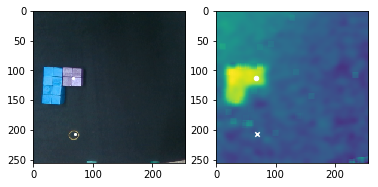

start pix : (67,113,0.498638115482) -> goal pix : (69,207,0.179357885802)
start pixel        goal pixek
x : 67.000000    x : 69.000000
y : 113.000000    y : 207.000000
z : 0.498638    z : 0.179358
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.697394    x : 0.849204
y : -0.101582    y : -0.080814
z : -0.205307    z : -0.200544
x : -0.700634    x : -0.048672
y : 0.713298    y : 0.997404
z : -0.013826    z : -0.016639
w : 0.011300    w : 0.050390


-----------data 34----------


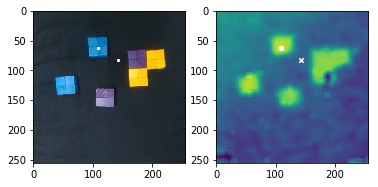

start pix : (109,63,0.526701135688) -> goal pix : (142,83,0.168311177879)
start pixel        goal pixek
x : 109.000000    x : 142.000000
y : 63.000000    y : 83.000000
z : 0.526701    z : 0.168311
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.616544    x : 0.664093
y : -0.032993    y : 0.029498
z : -0.194323    z : -0.190290
x : -0.043258    x : -0.718257
y : 0.997387    y : 0.684651
z : -0.010148    z : -0.054418
w : 0.056973    w : 0.111346


-----------data 35----------


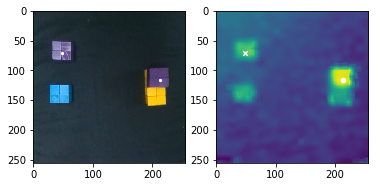

start pix : (213,117,0.772703543113) -> goal pix : (48,70,0.56450513875)
start pixel        goal pixek
x : 213.000000    x : 48.000000
y : 117.000000    y : 70.000000
z : 0.772704    z : 0.564505
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.713232    x : 0.633045
y : 0.134801    y : -0.124409
z : -0.152919    z : -0.141417
x : -0.025145    x : 0.006546
y : 0.994640    y : 0.996994
z : -0.017787    z : -0.034649
w : 0.098702    w : 0.068985


-----------data 36----------


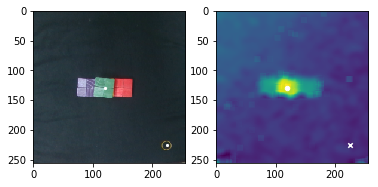

start pix : (120,130,0.860056812645) -> goal pix : (225,226,0.112939670327)
start pixel        goal pixek
x : 120.000000    x : 225.000000
y : 130.000000    y : 226.000000
z : 0.860057    z : 0.112940
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.743374    x : 0.913930
y : -0.000703    y : 0.172680
z : -0.148863    z : -0.188139
x : 0.051988    x : -0.089496
y : 0.993935    y : 0.963667
z : 0.012995    z : 0.057247
w : 0.096028    w : 0.245070


-----------data 37----------


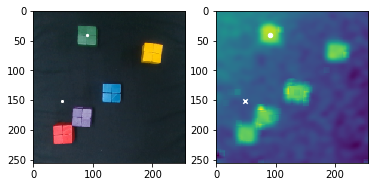

start pix : (90,41,0.537582112821) -> goal pix : (48,151,0.187902726106)
start pixel        goal pixek
x : 90.000000    x : 48.000000
y : 41.000000    y : 151.000000
z : 0.537582    z : 0.187903
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.595731    x : 0.773797
y : -0.048491    y : -0.125663
z : -0.195659    z : -0.188079
x : -0.002301    x : -0.039629
y : 0.994096    y : 0.987508
z : -0.005623    z : -0.000764
w : 0.108332    w : 0.152499


-----------data 38----------


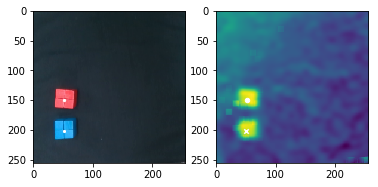

start pix : (52,150,0.493541887569) -> goal pix : (51,202,0.474746066863)
start pixel        goal pixek
x : 52.000000    x : 51.000000
y : 150.000000    y : 202.000000
z : 0.493542    z : 0.474746
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.772116    x : 0.856303
y : -0.128259    y : -0.134217
z : -0.200718    z : -0.147355
x : 0.027619    x : -0.030652
y : 0.987444    y : 0.985190
z : -0.053116    z : -0.072426
w : 0.146182    w : 0.152369


-----------data 39----------


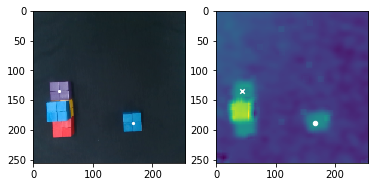

start pix : (167,188,0.4740211035) -> goal pix : (43,135,0.4948693086)
start pixel        goal pixek
x : 167.000000    x : 43.000000
y : 188.000000    y : 135.000000
z : 0.474021    z : 0.494869
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.833174    x : 0.743591
y : 0.070886    y : -0.134028
z : -0.210415    z : -0.156670
x : -0.022140    x : -0.042070
y : 0.989481    y : 0.983903
z : -0.007968    z : -0.019057
w : 0.142737    w : 0.172633


-----------data 40----------


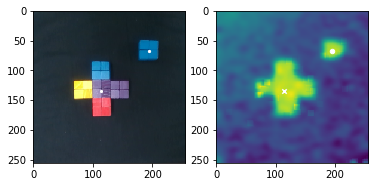

start pix : (195,67,0.481347706526) -> goal pix : (114,134,0.486712879746)
start pixel        goal pixek
x : 195.000000    x : 114.000000
y : 67.000000    y : 134.000000
z : 0.481348    z : 0.486713
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.631225    x : 0.741580
y : 0.113092    y : -0.027727
z : -0.205655    z : -0.150184
x : -0.032997    x : -0.032594
y : 0.988550    y : 0.988924
z : -0.037688    z : -0.041860
w : 0.142336    w : 0.138616


-----------data 41----------


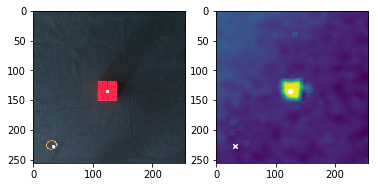

start pix : (124,135,0.865395923854) -> goal pix : (32,228,0.152655400234)
start pixel        goal pixek
x : 124.000000    x : 32.000000
y : 135.000000    y : 228.000000
z : 0.865396    z : 0.152655
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.745284    x : 0.904373
y : 0.004848    y : -0.169458
z : -0.155277    z : -0.208677
x : 0.010656    x : -0.032166
y : 0.995502    y : 0.990066
z : -0.026092    z : -0.060911
w : 0.090446    w : 0.122571


-----------data 42----------


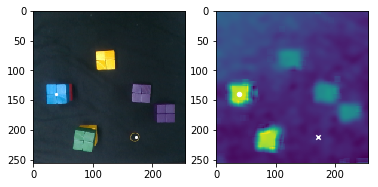

start pix : (38,140,0.822960015785) -> goal pix : (172,212,0.151886483421)
start pixel        goal pixek
x : 38.000000    x : 172.000000
y : 140.000000    y : 212.000000
z : 0.822960    z : 0.151886
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.769074    x : 0.907426
y : -0.132258    y : 0.073210
z : -0.150944    z : -0.193495
x : -0.032886    x : -0.072376
y : 0.993311    y : 0.978996
z : -0.025491    z : -0.012464
w : 0.107711    w : 0.190193


-----------data 43----------


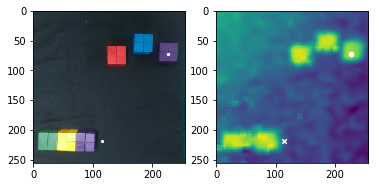

start pix : (227,73,0.463002687405) -> goal pix : (115,218,0.184931351661)
start pixel        goal pixek
x : 227.000000    x : 115.000000
y : 73.000000    y : 218.000000
z : 0.463003    z : 0.184931
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.629933    x : 0.877508
y : 0.191996    y : 0.007535
z : -0.183803    z : -0.178876
x : -0.012708    x : -0.697711
y : 0.996825    y : 0.700942
z : 0.053789    z : -0.015891
w : 0.057320    w : 0.147061


-----------data 44----------


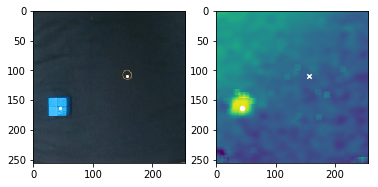

start pix : (44,163,0.500913099155) -> goal pix : (157,109,0.167327616703)
start pixel        goal pixek
x : 44.000000    x : 157.000000
y : 163.000000    y : 109.000000
z : 0.500913    z : 0.167328
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.793859    x : 0.707446
y : -0.141139    y : 0.058563
z : -0.202722    z : -0.198671
x : -0.013993    x : -0.019951
y : 0.993464    y : 0.993073
z : 0.006948    z : 0.023515
w : 0.113075    w : 0.113377


-----------data 45----------


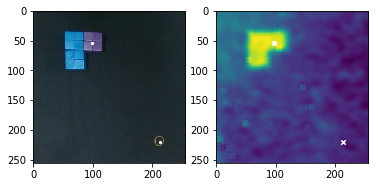

start pix : (98,54,0.519199565218) -> goal pix : (213,221,0.126645220151)
start pixel        goal pixek
x : 98.000000    x : 213.000000
y : 54.000000    y : 221.000000
z : 0.519200    z : 0.126645
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.582768    x : 0.876452
y : -0.040798    y : 0.163852
z : -0.208952    z : -0.196841
x : -0.682408    x : -0.041945
y : 0.730582    y : 0.970851
z : -0.020749    z : 0.009318
w : -0.011789    w : 0.235800


-----------data 46----------


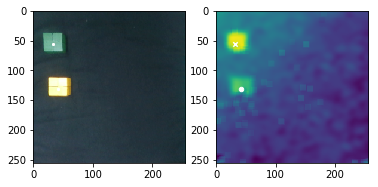

start pix : (42,132,0.414287726743) -> goal pix : (32,55,0.588244815139)
start pixel        goal pixek
x : 42.000000    x : 32.000000
y : 132.000000    y : 55.000000
z : 0.414288    z : 0.588245
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.730778    x : 0.612291
y : -0.123630    y : -0.130822
z : -0.213286    z : -0.159808
x : 0.021638    x : 0.001960
y : 0.995595    y : 0.996753
z : 0.007340    z : 0.028937
w : 0.090935    w : 0.075116


-----------data 47----------


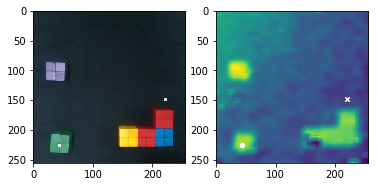

start pix : (43,226,0.488884685524) -> goal pix : (221,149,0.119295338317)
start pixel        goal pixek
x : 43.000000    x : 221.000000
y : 226.000000    y : 149.000000
z : 0.488885    z : 0.119295
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.893783    x : 0.785804
y : -0.113053    y : 0.175082
z : -0.203979    z : -0.192534
x : 0.027534    x : -0.021812
y : 0.983527    y : 0.977552
z : -0.011115    z : -0.004012
w : 0.178307    w : 0.209525


-----------data 48----------


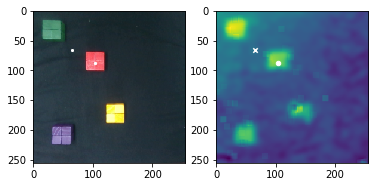

start pix : (104,87,0.505330087175) -> goal pix : (65,65,0.248992348764)
start pixel        goal pixek
x : 104.000000    x : 65.000000
y : 87.000000    y : 65.000000
z : 0.505330    z : 0.248992
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.662004    x : 0.625280
y : -0.036447    y : -0.096995
z : -0.197628    z : -0.192043
x : 0.027283    x : -0.004704
y : 0.996930    y : 0.996884
z : -0.017461    z : -0.022933
w : 0.071280    w : 0.075329


-----------data 49----------


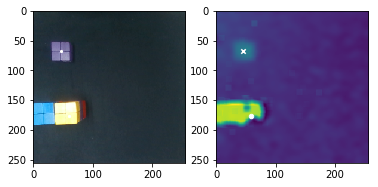

start pix : (59,176,0.995120603571) -> goal pix : (46,68,0.51425942861)
start pixel        goal pixek
x : 59.000000    x : 46.000000
y : 176.000000    y : 68.000000
z : 0.995121    z : 0.514259
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.768745    x : 0.607389
y : -0.096170    y : -0.133553
z : -0.108737    z : -0.158228
x : -0.734574    x : 0.017946
y : 0.678465    y : 0.999659
z : 0.007363    z : -0.017957
w : 0.005687    w : 0.006094


-----------data 50----------


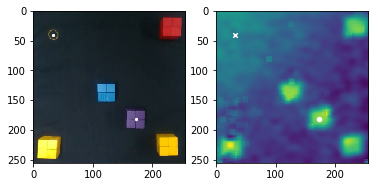

start pix : (173,182,0.477096469642) -> goal pix : (32,41,0.27714779654)
start pixel        goal pixek
x : 173.000000    x : 32.000000
y : 182.000000    y : 41.000000
z : 0.477096    z : 0.277148
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.843424    x : 0.584152
y : 0.080175    y : -0.144600
z : -0.213770    z : -0.198955
x : -0.020646    x : 0.026989
y : 0.983953    y : 0.987817
z : -0.015896    z : -0.023342
w : 0.176517    w : 0.151475


-----------data 51----------


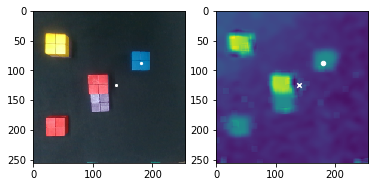

start pix : (180,88,0.491506869711) -> goal pix : (139,124,0.263428920707)
start pixel        goal pixek
x : 180.000000    x : 139.000000
y : 88.000000    y : 124.000000
z : 0.491507    z : 0.263429
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.666269    x : 0.707669
y : 0.095766    y : 0.036386
z : -0.203526    z : -0.211440
x : -0.018277    x : -0.708309
y : 0.996762    y : 0.704450
z : -0.014786    z : -0.026868
w : 0.076890    w : 0.036432


-----------data 52----------


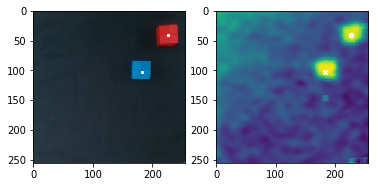

start pix : (227,40,0.458897145505) -> goal pix : (183,102,0.46755944186)
start pixel        goal pixek
x : 227.000000    x : 183.000000
y : 40.000000    y : 102.000000
z : 0.458897    z : 0.467559
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.594301    x : 0.692330
y : 0.176676    y : 0.097032
z : -0.208338    z : -0.153836
x : -0.047245    x : 0.008212
y : 0.989908    y : 0.986160
z : -0.020298    z : -0.012510
w : 0.132054    w : 0.165118


-----------data 53----------


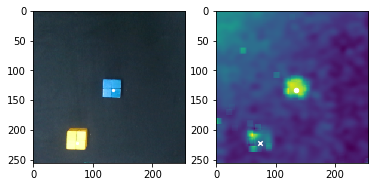

start pix : (134,133,0.472367803569) -> goal pix : (74,222,0.207274857021)
start pixel        goal pixek
x : 134.000000    x : 74.000000
y : 133.000000    y : 222.000000
z : 0.472368    z : 0.207275
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.742372    x : 0.881241
y : 0.013726    y : -0.087527
z : -0.204324    z : -0.158055
x : -0.023459    x : -0.002132
y : 0.991101    y : 0.997101
z : -0.036998    z : -0.019007
w : 0.125696    w : 0.073651


-----------data 54----------


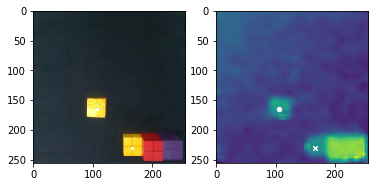

start pix : (106,165,0.477754554751) -> goal pix : (166,231,0.446772463158)
start pixel        goal pixek
x : 106.000000    x : 166.000000
y : 165.000000    y : 231.000000
z : 0.477755    z : 0.446772
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.796517    x : 0.896881
y : -0.027188    y : 0.082341
z : -0.191278    z : -0.128452
x : -0.053403    x : -0.731358
y : 0.986282    y : 0.662117
z : -0.021485    z : 0.009893
w : 0.154706    w : 0.163156


-----------data 55----------


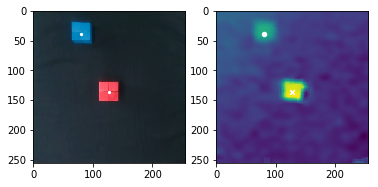

start pix : (80,38,0.514915226935) -> goal pix : (127,137,0.804319427823)
start pixel        goal pixek
x : 80.000000    x : 127.000000
y : 38.000000    y : 137.000000
z : 0.514915    z : 0.804319
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.575593    x : 0.745121
y : -0.071569    y : 0.003901
z : -0.205459    z : -0.101011
x : 0.045516    x : 0.036831
y : 0.998062    y : 0.996707
z : -0.011599    z : 0.033152
w : 0.040808    w : 0.064189


-----------data 56----------


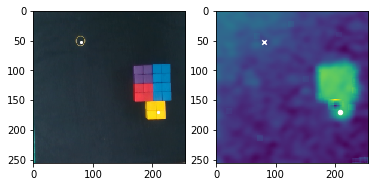

start pix : (209,170,0.447295302502) -> goal pix : (80,52,0.197080684071)
start pixel        goal pixek
x : 209.000000    x : 80.000000
y : 170.000000    y : 52.000000
z : 0.447295    z : 0.197081
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.806720    x : 0.592964
y : 0.139380    y : -0.085738
z : -0.205912    z : -0.200511
x : -0.037272    x : -0.015164
y : 0.986026    y : 0.990453
z : 0.017469    z : 0.007677
w : 0.161426    w : 0.136803


-----------data 57----------


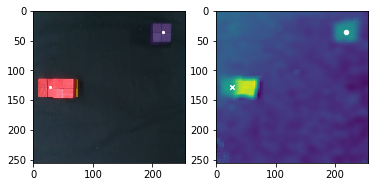

start pix : (218,36,0.463000685452) -> goal pix : (27,128,0.53546849796)
start pixel        goal pixek
x : 218.000000    x : 27.000000
y : 36.000000    y : 128.000000
z : 0.463001    z : 0.535468
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.591389    x : 0.732115
y : 0.163653    y : -0.141085
z : -0.195766    z : -0.141819
x : -0.013781    x : -0.707684
y : 0.991337    y : 0.694458
z : 0.012280    z : 0.059558
w : 0.130039    w : 0.115604


-----------data 58----------


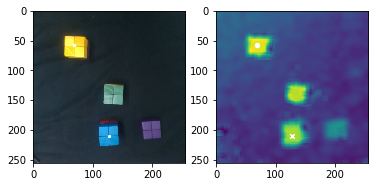

start pix : (68,58,0.85132342254) -> goal pix : (127,210,0.77961311734)
start pixel        goal pixek
x : 68.000000    x : 127.000000
y : 58.000000    y : 210.000000
z : 0.851323    z : 0.779613
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.630040    x : 0.867476
y : -0.076214    y : -0.002187
z : -0.151604    z : -0.102406
x : 0.016737    x : -0.014977
y : 0.998494    y : 0.997141
z : -0.023911    z : -0.027603
w : 0.046459    w : 0.068735


-----------data 59----------


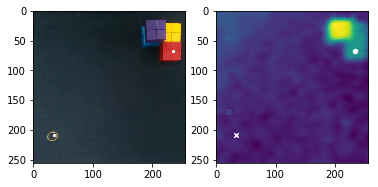

start pix : (234,68,0.470470464745) -> goal pix : (34,209,0.143120366267)
start pixel        goal pixek
x : 234.000000    x : 34.000000
y : 68.000000    y : 209.000000
z : 0.470470    z : 0.143120
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.639809    x : 0.875846
y : 0.173811    y : -0.182912
z : -0.207781    z : -0.206310
x : -0.020824    x : -0.036036
y : 0.998525    y : 0.997221
z : -0.033176    z : -0.022180
w : 0.037594    w : 0.061312


-----------data 60----------


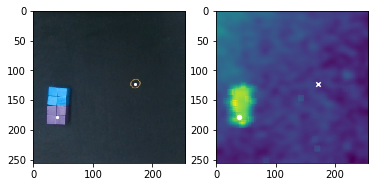

start pix : (39,178,0.487820358563) -> goal pix : (171,123,0.147922193146)
start pixel        goal pixek
x : 39.000000    x : 171.000000
y : 178.000000    y : 123.000000
z : 0.487820    z : 0.147922
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.796422    x : 0.711961
y : -0.150313    y : 0.082735
z : -0.201589    z : -0.192162
x : 0.030205    x : -0.083664
y : 0.998116    y : 0.993952
z : -0.035738    z : -0.027883
w : 0.039681    w : 0.065435


-----------data 61----------


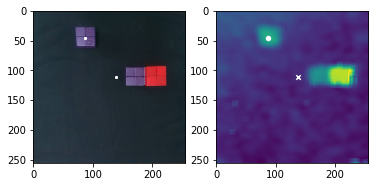

start pix : (87,45,0.553975602038) -> goal pix : (138,111,0.166187467802)
start pixel        goal pixek
x : 87.000000    x : 138.000000
y : 45.000000    y : 111.000000
z : 0.553976    z : 0.166187
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.598693    x : 0.705164
y : -0.063502    y : 0.026915
z : -0.202109    z : -0.192632
x : 0.013701    x : -0.695125
y : 0.998180    y : 0.714539
z : -0.001700    z : 0.051298
w : 0.058704    w : 0.060036


-----------data 62----------


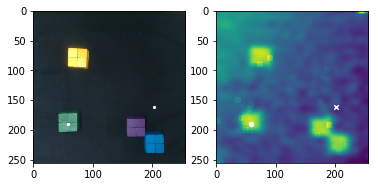

start pix : (58,191,0.462416749918) -> goal pix : (202,161,0.128252255434)
start pixel        goal pixek
x : 58.000000    x : 202.000000
y : 191.000000    y : 161.000000
z : 0.462417    z : 0.128252
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.833960    x : 0.800600
y : -0.097869    y : 0.135517
z : -0.202129    z : -0.196436
x : -0.016107    x : -0.040056
y : 0.990287    y : 0.985278
z : -0.017579    z : 0.013282
w : 0.136976    w : 0.165671


-----------data 63----------


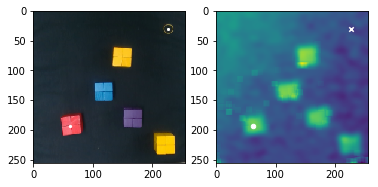

start pix : (62,194,0.47763697256) -> goal pix : (227,30,0.112808847576)
start pixel        goal pixek
x : 62.000000    x : 227.000000
y : 194.000000    y : 30.000000
z : 0.477637    z : 0.112809
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.851530    x : 0.577409
y : -0.088824    y : 0.198097
z : -0.204133    z : -0.189909
x : -0.053280    x : -0.049927
y : 0.979995    y : 0.986414
z : -0.024261    z : -0.008082
w : 0.190217    w : 0.156299


-----------data 64----------


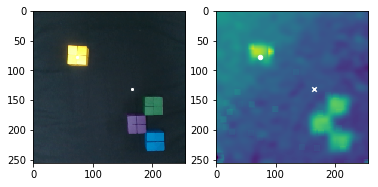

start pix : (73,77,0.484088461673) -> goal pix : (165,132,0.172047953511)
start pixel        goal pixek
x : 73.000000    x : 165.000000
y : 77.000000    y : 132.000000
z : 0.484088    z : 0.172048
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.647786    x : 0.747401
y : -0.068181    y : 0.084730
z : -0.205401    z : -0.199004
x : 0.036081    x : -0.019984
y : 0.994144    y : 0.996395
z : -0.016811    z : -0.005723
w : 0.100463    w : 0.082248


-----------data 65----------


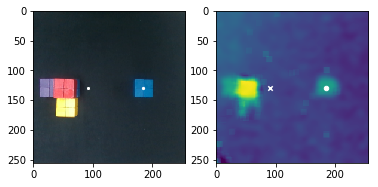

start pix : (185,130,0.482657712194) -> goal pix : (91,130,0.184693990012)
start pixel        goal pixek
x : 185.000000    x : 91.000000
y : 130.000000    y : 130.000000
z : 0.482658    z : 0.184694
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.729793    x : 0.718626
y : 0.120694    y : -0.036009
z : -0.204334    z : -0.181660
x : -0.004238    x : -0.715078
y : 0.992858    y : 0.689720
z : -0.002570    z : 0.088120
w : 0.119196    w : 0.072010


-----------data 66----------


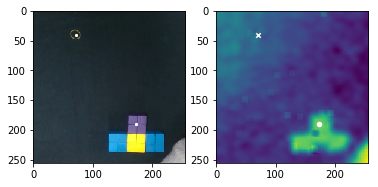

start pix : (173,190,0.48101836083) -> goal pix : (71,41,0.270821755014)
start pixel        goal pixek
x : 173.000000    x : 71.000000
y : 190.000000    y : 41.000000
z : 0.481018    z : 0.270822
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.847104    x : 0.587038
y : 0.094279    y : -0.090748
z : -0.202286    z : -0.195247
x : 0.018475    x : 0.008579
y : 0.981506    y : 0.989589
z : 0.029619    z : 0.008418
w : 0.188223    w : 0.143418


-----------data 67----------


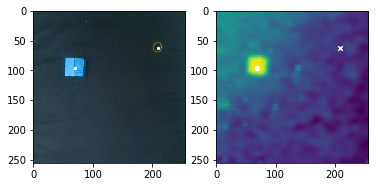

start pix : (69,96,0.548036816364) -> goal pix : (209,62,0.141796285893)
start pixel        goal pixek
x : 69.000000    x : 209.000000
y : 96.000000    y : 62.000000
z : 0.548037    z : 0.141796
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.678319    x : 0.619986
y : -0.078612    y : 0.163116
z : -0.193171    z : -0.185219
x : 0.024405    x : -0.000535
y : 0.996132    y : 0.993845
z : -0.001437    z : 0.015393
w : 0.084399    w : 0.109701


-----------data 68----------


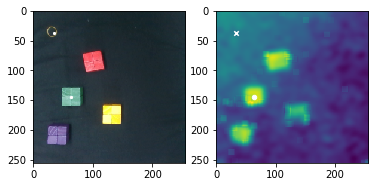

start pix : (63,145,0.521993099498) -> goal pix : (34,37,0.289156040086)
start pixel        goal pixek
x : 63.000000    x : 34.000000
y : 145.000000    y : 37.000000
z : 0.521993    z : 0.289156
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.762535    x : 0.575178
y : -0.087674    y : -0.154835
z : -0.201498    z : -0.190609
x : -0.064190    x : -0.038272
y : 0.992200    y : 0.996928
z : 0.011090    z : -0.013165
w : 0.106100    w : 0.067056


-----------data 69----------


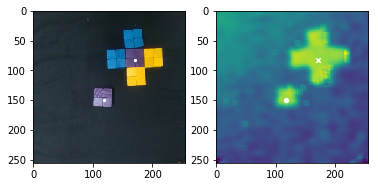

start pix : (118,150,0.468874004819) -> goal pix : (171,82,0.480557866863)
start pixel        goal pixek
x : 118.000000    x : 171.000000
y : 150.000000    y : 82.000000
z : 0.468874    z : 0.480558
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.766179    x : 0.658750
y : -0.010521    y : 0.080349
z : -0.193883    z : -0.141782
x : -0.009283    x : -0.031349
y : 0.996351    y : 0.996411
z : -0.028780    z : -0.001540
w : 0.079818    w : 0.078618


-----------data 70----------


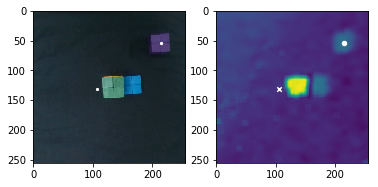

start pix : (215,54,0.440200946378) -> goal pix : (106,131,0.209373851928)
start pixel        goal pixek
x : 215.000000    x : 106.000000
y : 54.000000    y : 131.000000
z : 0.440201    z : 0.209374
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.613919    x : 0.722218
y : 0.164150    y : -0.014985
z : -0.198441    z : -0.191825
x : -0.002492    x : -0.673692
y : 0.994041    y : 0.721782
z : 0.015064    z : 0.093048
w : 0.107934    w : 0.128501


-----------data 71----------


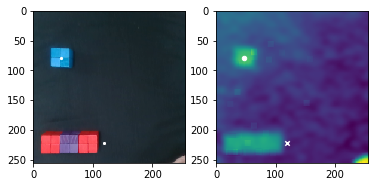

start pix : (47,79,0.560647623373) -> goal pix : (119,223,0.153819776021)
start pixel        goal pixek
x : 47.000000    x : 119.000000
y : 79.000000    y : 223.000000
z : 0.560648    z : 0.153820
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.658720    x : 0.903948
y : -0.128302    y : 0.013477
z : -0.202083    z : -0.193039
x : -0.030448    x : 0.715342
y : 0.992298    y : -0.677940
z : -0.015093    z : 0.022644
w : 0.119120    w : -0.167839


-----------data 72----------


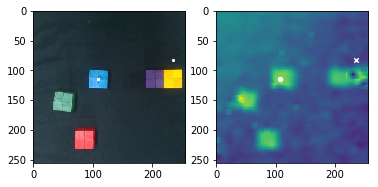

start pix : (108,115,0.5186653123) -> goal pix : (235,82,0.135774500546)
start pixel        goal pixek
x : 108.000000    x : 235.000000
y : 115.000000    y : 82.000000
z : 0.518665    z : 0.135775
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.705367    x : 0.653587
y : -0.019722    y : 0.190310
z : -0.202198    z : -0.184071
x : 0.020993    x : -0.052381
y : 0.998014    y : 0.995633
z : -0.002547    z : 0.015177
w : 0.059344    w : 0.075772


-----------data 73----------


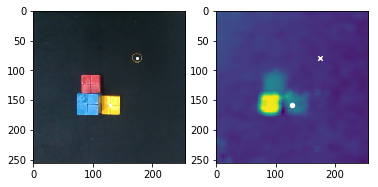

start pix : (128,159,0.454935382084) -> goal pix : (174,79,0.142024512613)
start pixel        goal pixek
x : 128.000000    x : 174.000000
y : 159.000000    y : 79.000000
z : 0.454935    z : 0.142025
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.777084    x : 0.644521
y : -0.002790    y : 0.090073
z : -0.195823    z : -0.190355
x : -0.730311    x : 0.996539
y : 0.651581    y : 0.067728
z : -0.202941    z : 0.048129
w : -0.030037    w : 0.002636


-----------data 74----------


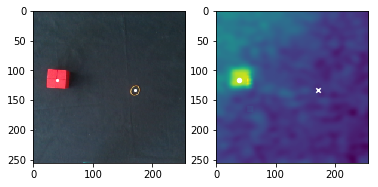

start pix : (39,116,0.524137280765) -> goal pix : (171,133,0.163312138277)
start pixel        goal pixek
x : 39.000000    x : 171.000000
y : 116.000000    y : 133.000000
z : 0.524137    z : 0.163312
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.709711    x : 0.744283
y : -0.141224    y : 0.079846
z : -0.207428    z : -0.213454
x : 0.036796    x : -0.040400
y : 0.994934    y : 0.997147
z : -0.004031    z : -0.014021
w : 0.093467    w : 0.062202


-----------data 75----------


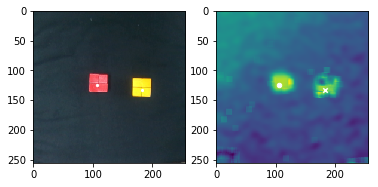

start pix : (106,124,0.490337786078) -> goal pix : (183,133,0.463946120001)
start pixel        goal pixek
x : 106.000000    x : 183.000000
y : 124.000000    y : 133.000000
z : 0.490338    z : 0.463946
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.723179    x : 0.739495
y : -0.025408    y : 0.099741
z : -0.210594    z : -0.156886
x : 0.004152    x : 0.030162
y : 0.997053    y : 0.995652
z : 0.030100    z : 0.025149
w : 0.070436    w : 0.084464


-----------data 76----------


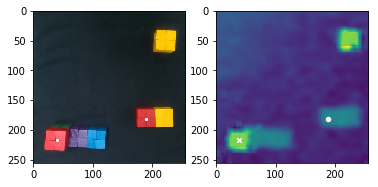

start pix : (189,181,0.453676865673) -> goal pix : (39,217,0.781055614052)
start pixel        goal pixek
x : 189.000000    x : 39.000000
y : 181.000000    y : 217.000000
z : 0.453677    z : 0.781056
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.818615    x : 0.877801
y : 0.115701    y : -0.142721
z : -0.199722    z : -0.087230
x : -0.739115    x : 0.010300
y : 0.660407    y : 0.985091
z : 0.038014    z : -0.052028
w : 0.126992    w : 0.163655


-----------data 77----------


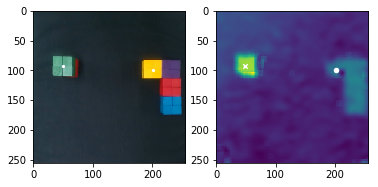

start pix : (201,100,0.391710859571) -> goal pix : (49,93,0.844007521011)
start pixel        goal pixek
x : 201.000000    x : 49.000000
y : 100.000000    y : 93.000000
z : 0.391711    z : 0.844008
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.690143    x : 0.686812
y : 0.139129    y : -0.115674
z : -0.192266    z : -0.082937
x : -0.654981    x : 0.048725
y : 0.749986    y : 0.993584
z : 0.025151    z : -0.050631
w : 0.088823    w : 0.088615


-----------data 78----------


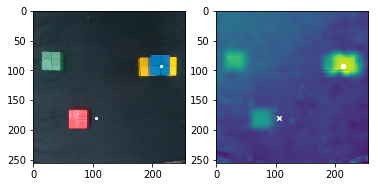

start pix : (214,93,0.81563908089) -> goal pix : (105,180,0.228600381446)
start pixel        goal pixek
x : 214.000000    x : 105.000000
y : 93.000000    y : 180.000000
z : 0.815639    z : 0.228600
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.689036    x : 0.834733
y : 0.141372    y : -0.022102
z : -0.153639    z : -0.197556
x : -0.043504    x : -0.700013
y : 0.997055    y : 0.706683
z : -0.008119    z : 0.039040
w : 0.062636    w : 0.095167


-----------data 79----------


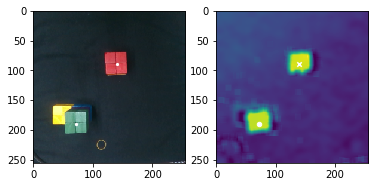

start pix : (72,190,1.14336006559) -> goal pix : (140,89,1.17626345434)
start pixel        goal pixek
x : 72.000000    x : 140.000000
y : 190.000000    y : 89.000000
z : 1.143360    z : 1.176263
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.821539    x : 0.685305
y : -0.071721    y : 0.025974
z : -0.111987    z : -0.059488
x : -0.014930    x : -0.003621
y : 0.998484    y : 0.998557
z : -0.011894    z : -0.013020
w : 0.051634    w : 0.051968


-----------data 80----------


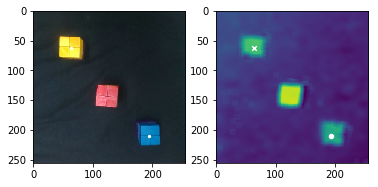

start pix : (194,210,0.759740054633) -> goal pix : (63,62,0.890298682086)
start pixel        goal pixek
x : 194.000000    x : 63.000000
y : 210.000000    y : 62.000000
z : 0.759740    z : 0.890299
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.881387    x : 0.644208
y : 0.124985    y : -0.078654
z : -0.156457    z : -0.102444
x : -0.035403    x : 0.023010
y : 0.981591    y : 0.988059
z : 0.006738    z : 0.004881
w : 0.187565    w : 0.152269


-----------data 81----------


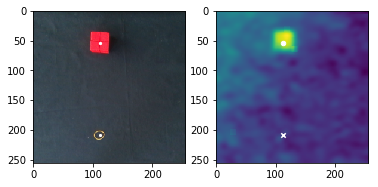

start pix : (112,54,0.521825171442) -> goal pix : (112,208,0.19341610082)
start pixel        goal pixek
x : 112.000000    x : 112.000000
y : 54.000000    y : 208.000000
z : 0.521825    z : 0.193416
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.598361    x : 0.875143
y : -0.010883    y : -0.020284
z : -0.208042    z : -0.219723
x : -0.012124    x : -0.081572
y : 0.997196    y : 0.987451
z : -0.011995    z : -0.006656
w : 0.072864    w : 0.135061


-----------data 82----------


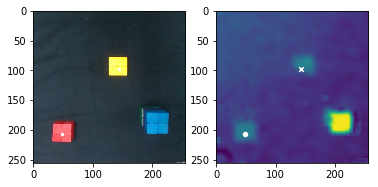

start pix : (48,207,0.480088860526) -> goal pix : (143,98,0.415879698549)
start pixel        goal pixek
x : 48.000000    x : 143.000000
y : 207.000000    y : 98.000000
z : 0.480089    z : 0.415880
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.874045    x : 0.701202
y : -0.121959    y : 0.038054
z : -0.192128    z : -0.130436
x : 0.047098    x : 0.015083
y : 0.985143    y : 0.985880
z : -0.017177    z : 0.008785
w : 0.164257    w : 0.166543


-----------data 83----------


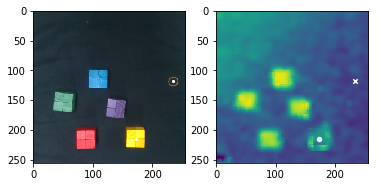

start pix : (173,215,0.283184332049) -> goal pix : (234,118,0.123807594075)
start pixel        goal pixek
x : 173.000000    x : 234.000000
y : 215.000000    y : 118.000000
z : 0.283184    z : 0.123808
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.891741    x : 0.727401
y : 0.081372    y : 0.201938
z : -0.193560    z : -0.177191
x : -0.009127    x : -0.028490
y : 0.978344    y : 0.984710
z : -0.005379    z : 0.024947
w : 0.206713    w : 0.170039


-----------data 84----------


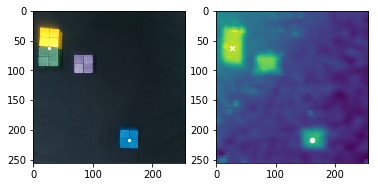

start pix : (161,217,0.466618255358) -> goal pix : (26,62,0.610684520042)
start pixel        goal pixek
x : 161.000000    x : 26.000000
y : 217.000000    y : 62.000000
z : 0.466618    z : 0.610685
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.898522    x : 0.634607
y : 0.076777    y : -0.139572
z : -0.201386    z : -0.146693
x : 0.010647    x : 0.032313
y : 0.970425    y : 0.970918
z : 0.013525    z : 0.031522
w : 0.240789    w : 0.235117


-----------data 85----------


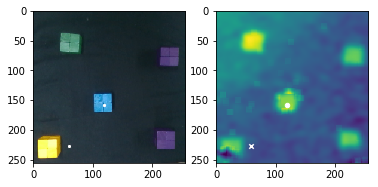

start pix : (119,159,0.506275240963) -> goal pix : (59,227,0.148640910577)
start pixel        goal pixek
x : 119.000000    x : 59.000000
y : 159.000000    y : 227.000000
z : 0.506275    z : 0.148641
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.780328    x : 0.909399
y : -0.004061    y : -0.098765
z : -0.195548    z : -0.189339
x : -0.043378    x : -0.702163
y : 0.997269    y : 0.696622
z : -0.002509    z : -0.022511
w : 0.059716    w : 0.145527


-----------data 86----------


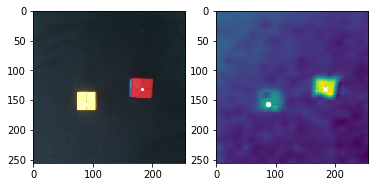

start pix : (88,156,0.46709489109) -> goal pix : (183,132,0.78465521114)
start pixel        goal pixek
x : 88.000000    x : 183.000000
y : 156.000000    y : 132.000000
z : 0.467095    z : 0.784655
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.776611    x : 0.750959
y : -0.053927    y : 0.087070
z : -0.194353    z : -0.085325
x : -0.012567    x : 0.015270
y : 0.993119    y : 0.986799
z : -0.008974    z : -0.017159
w : 0.116088    w : 0.160315


-----------data 87----------


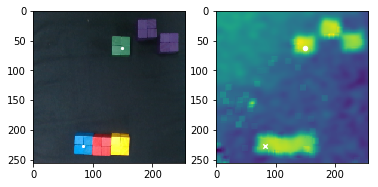

start pix : (149,63,0.492833387422) -> goal pix : (83,227,0.470558290263)
start pixel        goal pixek
x : 149.000000    x : 83.000000
y : 63.000000    y : 227.000000
z : 0.492833    z : 0.470558
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.614919    x : 0.894191
y : 0.044102    y : -0.053348
z : -0.191376    z : -0.131800
x : 0.008930    x : 0.075842
y : 0.998932    y : 0.991206
z : 0.023096    z : 0.046362
w : 0.039016    w : 0.098031


-----------data 88----------


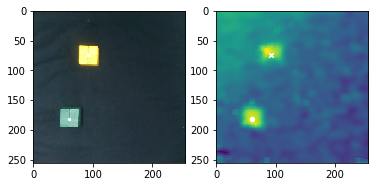

start pix : (60,181,0.483161439396) -> goal pix : (92,75,0.453453778113)
start pixel        goal pixek
x : 60.000000    x : 92.000000
y : 181.000000    y : 75.000000
z : 0.483161    z : 0.453454
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.831925    x : 0.661350
y : -0.101596    y : -0.050915
z : -0.201472    z : -0.139620
x : 0.004829    x : 0.019344
y : 0.987802    y : 0.998387
z : -0.014469    z : -0.028344
w : 0.154963    w : 0.045233


-----------data 89----------


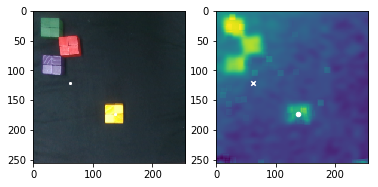

start pix : (137,174,0.357987866347) -> goal pix : (62,122,0.180345377642)
start pixel        goal pixek
x : 137.000000    x : 62.000000
y : 174.000000    y : 122.000000
z : 0.357988    z : 0.180345
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.810810    x : 0.722022
y : 0.021772    y : -0.095378
z : -0.210376    z : -0.203385
x : -0.038628    x : -0.031788
y : 0.993154    y : 0.993837
z : -0.022869    z : -0.006931
w : 0.107847    w : 0.105965


-----------data 90----------


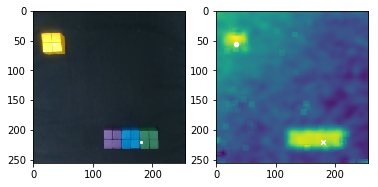

start pix : (34,56,0.44223278227) -> goal pix : (180,220,0.457028102578)
start pixel        goal pixek
x : 34.000000    x : 180.000000
y : 56.000000    y : 220.000000
z : 0.442233    z : 0.457028
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.612861    x : 0.891103
y : -0.139862    y : 0.097639
z : -0.198654    z : -0.135252
x : -0.020331    x : 0.020900
y : 0.997822    y : 0.988003
z : -0.032530    z : -0.002186
w : 0.053663    w : 0.152999


-----------data 91----------


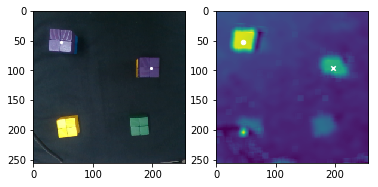

start pix : (46,53,1.22541548368) -> goal pix : (197,96,0.827610516169)
start pixel        goal pixek
x : 46.000000    x : 197.000000
y : 53.000000    y : 96.000000
z : 1.225415    z : 0.827611
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.632206    x : 0.699479
y : -0.108963    y : 0.107803
z : -0.101813    z : -0.100264
x : 0.021407    x : 0.013903
y : 0.997219    y : 0.998349
z : -0.038333    z : -0.032030
w : 0.060217    w : 0.045605


-----------data 92----------


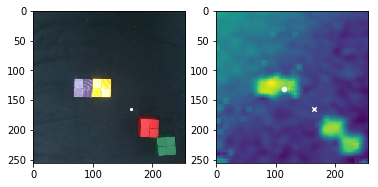

start pix : (115,131,0.467107879371) -> goal pix : (164,165,0.15027138336)
start pixel        goal pixek
x : 115.000000    x : 164.000000
y : 131.000000    y : 165.000000
z : 0.467108    z : 0.150271
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.731292    x : 0.800555
y : -0.009332    y : 0.073916
z : -0.196683    z : -0.192492
x : -0.699782    x : -0.038528
y : 0.713562    y : 0.995841
z : 0.004968    z : 0.015681
w : 0.033317    w : 0.081055


-----------data 93----------


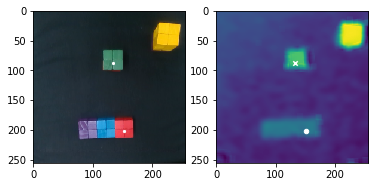

start pix : (152,202,0.453499416133) -> goal pix : (133,87,0.822782073895)
start pixel        goal pixek
x : 152.000000    x : 133.000000
y : 202.000000    y : 87.000000
z : 0.453499    z : 0.822782
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.863589    x : 0.667652
y : 0.048685    y : 0.012083
z : -0.199494    z : -0.089874
x : -0.717629    x : 0.019214
y : 0.686649    y : 0.991784
z : -0.037138    z : -0.059260
w : 0.110192    w : 0.111727


-----------data 94----------


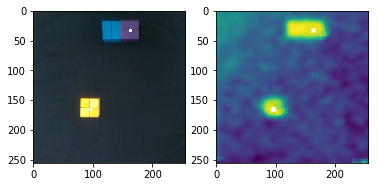

start pix : (95,165,0.473406121417) -> goal pix : (163,32,0.479816521665)
start pixel        goal pixek
x : 95.000000    x : 163.000000
y : 165.000000    y : 32.000000
z : 0.473406    z : 0.479817
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.784973    x : 0.575776
y : -0.055674    y : 0.059329
z : -0.207834    z : -0.159457
x : -0.007550    x : 0.008285
y : 0.990524    y : 0.990411
z : -0.043553    z : -0.019384
w : 0.130030    w : 0.136534


-----------data 95----------


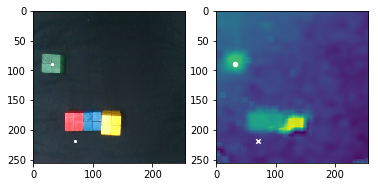

start pix : (31,90,0.569091714982) -> goal pix : (70,218,0.138437236489)
start pixel        goal pixek
x : 31.000000    x : 70.000000
y : 90.000000    y : 218.000000
z : 0.569092    z : 0.138437
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.665629    x : 0.891859
y : -0.150451    y : -0.082472
z : -0.189219    z : -0.181719
x : -0.000218    x : -0.027308
y : 0.998624    y : 0.993931
z : -0.000866    z : 0.012672
w : 0.052433    w : 0.105810


-----------data 96----------


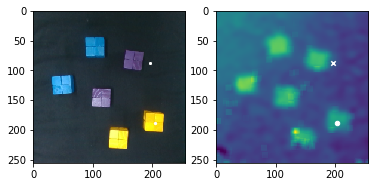

start pix : (204,189,0.377243534048) -> goal pix : (196,87,0.199166515731)
start pixel        goal pixek
x : 204.000000    x : 196.000000
y : 189.000000    y : 87.000000
z : 0.377244    z : 0.199167
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.841207    x : 0.664131
y : 0.151727    y : 0.147939
z : -0.209703    z : -0.206591
x : -0.052232    x : -0.655077
y : 0.983603    y : 0.733554
z : 0.020213    z : 0.101971
w : 0.171428    w : 0.149580


-----------data 97----------


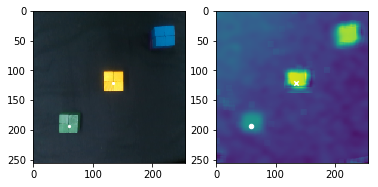

start pix : (59,193,0.476679497809) -> goal pix : (134,122,0.85633135293)
start pixel        goal pixek
x : 59.000000    x : 134.000000
y : 193.000000    y : 122.000000
z : 0.476679    z : 0.856331
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.762535    x : 0.731726
y : -0.087674    y : 0.021510
z : -0.201498    z : -0.093476
x : -0.022770    x : -0.032441
y : 0.987963    y : 0.985845
z : -0.012360    z : -0.025338
w : 0.115251    w : 0.162527


-----------data 98----------


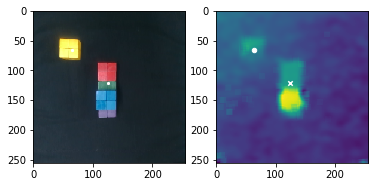

start pix : (64,66,0.425879759361) -> goal pix : (125,121,0.492296851789)
start pixel        goal pixek
x : 64.000000    x : 125.000000
y : 66.000000    y : 121.000000
z : 0.425880    z : 0.492297
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.628595    x : 0.722613
y : -0.093987    y : 0.008838
z : -0.205838    z : -0.151686
x : 0.054840    x : 0.009534
y : 0.996222    y : 0.995212
z : -0.007761    z : 0.048042
w : 0.066886    w : 0.084588


-----------data 99----------


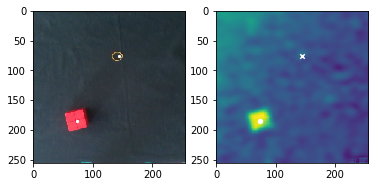

start pix : (73,185,0.497596798774) -> goal pix : (144,76,0.214842398355)
start pixel        goal pixek
x : 73.000000    x : 144.000000
y : 185.000000    y : 76.000000
z : 0.497597    z : 0.214842
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.819153    x : 0.644071
y : -0.081228    y : 0.023925
z : -0.210295    z : -0.193351
x : -0.136122    x : -0.096218
y : 0.985294    y : 0.989943
z : 0.029777    z : -0.037643
w : 0.098893    w : 0.096631


-----------data 100----------


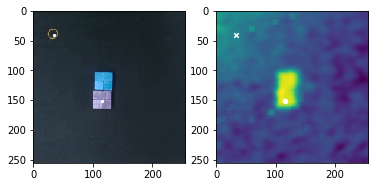

start pix : (116,151,0.482855108022) -> goal pix : (34,40,0.280384458251)
start pixel        goal pixek
x : 116.000000    x : 34.000000
y : 151.000000    y : 40.000000
z : 0.482855    z : 0.280384
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.765094    x : 0.570292
y : -0.006297    y : -0.149676
z : -0.197170    z : -0.187045
x : -0.040524    x : -0.068337
y : 0.993165    y : 0.993896
z : 0.005671    z : -0.011302
w : 0.109310    w : 0.085862


-----------data 101----------


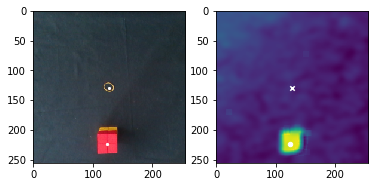

start pix : (124,224,0.769069135642) -> goal pix : (127,130,0.180400813839)
start pixel        goal pixek
x : 124.000000    x : 127.000000
y : 224.000000    y : 130.000000
z : 0.769069    z : 0.180401
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.879774    x : 0.727630
y : 0.004070    y : 0.009926
z : -0.155700    z : -0.219237
x : -0.032458    x : -0.025514
y : 0.987463    y : 0.999327
z : -0.004996    z : -0.015252
w : 0.154399    w : 0.021475


-----------data 102----------


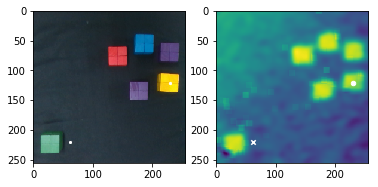

start pix : (230,122,0.439082749789) -> goal pix : (62,220,0.159556063328)
start pixel        goal pixek
x : 230.000000    x : 62.000000
y : 122.000000    y : 220.000000
z : 0.439083    z : 0.159556
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.730244    x : 0.872481
y : 0.183377    y : -0.085024
z : -0.194970    z : -0.190186
x : 0.016717    x : -0.733792
y : 0.990823    y : 0.674996
z : 0.040202    z : 0.004748
w : 0.127964    w : 0.076857


-----------data 103----------


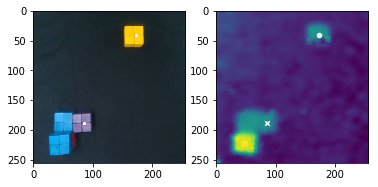

start pix : (173,41,0.458553147303) -> goal pix : (85,188,0.452643776504)
start pixel        goal pixek
x : 173.000000    x : 85.000000
y : 41.000000    y : 188.000000
z : 0.458553    z : 0.452644
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.583880    x : 0.824051
y : 0.083024    y : -0.075837
z : -0.207276    z : -0.157082
x : -0.015205    x : -0.026729
y : 0.994654    y : 0.991605
z : -0.018005    z : -0.031389
w : 0.100540    w : 0.122552


-----------data 104----------


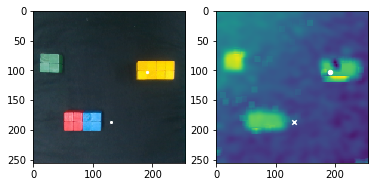

start pix : (191,102,0.448433998766) -> goal pix : (131,187,0.202042923544)
start pixel        goal pixek
x : 191.000000    x : 131.000000
y : 102.000000    y : 187.000000
z : 0.448434    z : 0.202043
o : 2.000000    o : 2.000000


start pose        goal pose
x : 0.685486    x : 0.834283
y : 0.125486    y : 0.019552
z : -0.191910    z : -0.190523
x : -0.705948    x : -0.713751
y : 0.704154    y : 0.693040
z : 0.014528    z : 0.005208
w : 0.074790    w : 0.101138


-----------data 105----------


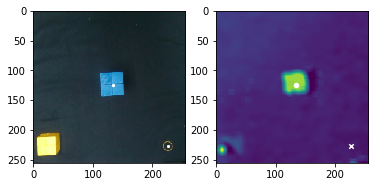

start pix : (134,125,1.49291028971) -> goal pix : (227,228,0.129599000196)
start pixel        goal pixek
x : 134.000000    x : 227.000000
y : 125.000000    y : 228.000000
z : 1.492910    z : 0.129599
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.735269    x : 0.921819
y : 0.016805    y : 0.177397
z : -0.049533    z : -0.179028
x : -0.067530    x : -0.101616
y : 0.993448    y : 0.955596
z : 0.007805    z : 0.051541
w : 0.091865    w : 0.271762


-----------data 106----------


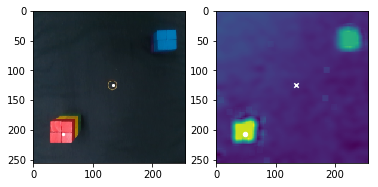

start pix : (49,207,1.14892565791) -> goal pix : (134,125,0.174083235855)
start pixel        goal pixek
x : 49.000000    x : 134.000000
y : 207.000000    y : 125.000000
z : 1.148926    z : 0.174083
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.845237    x : 0.737854
y : -0.098545    y : 0.015443
z : -0.096483    z : -0.179658
x : -0.001748    x : -0.041260
y : 0.984570    y : 0.991604
z : -0.020217    z : 0.016460
w : 0.173813    w : 0.121441


-----------data 107----------


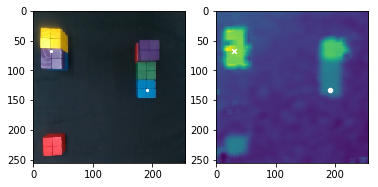

start pix : (191,133,0.443281834167) -> goal pix : (30,67,0.958590941302)
start pixel        goal pixek
x : 191.000000    x : 30.000000
y : 133.000000    y : 67.000000
z : 0.443282    z : 0.958591
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.744691    x : 0.636339
y : 0.120105    y : -0.132479
z : -0.210604    z : -0.100515
x : -0.080323    x : -0.027033
y : 0.989745    y : 0.994307
z : -0.000932    z : -0.010817
w : 0.118116    w : 0.102495


-----------data 108----------


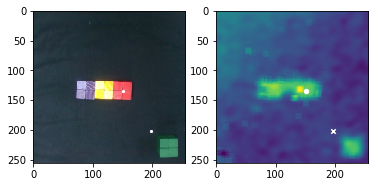

start pix : (151,134,0.494702357107) -> goal pix : (197,202,0.169887524686)
start pixel        goal pixek
x : 151.000000    x : 197.000000
y : 134.000000    y : 202.000000
z : 0.494702    z : 0.169888
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.734018    x : 0.853816
y : 0.046335    y : 0.120815
z : -0.191677    z : -0.186401
x : -0.657599    x : -0.022168
y : 0.751055    y : 0.987562
z : 0.049411    z : 0.027044
w : 0.032239    w : 0.153293


-----------data 109----------


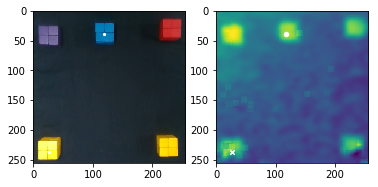

start pix : (118,39,0.515126034222) -> goal pix : (26,237,0.418091201592)
start pixel        goal pixek
x : 118.000000    x : 26.000000
y : 39.000000    y : 237.000000
z : 0.515126    z : 0.418091
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.591725    x : 0.915688
y : 0.001417    y : -0.160512
z : -0.201436    z : -0.147514
x : -0.010965    x : 0.001806
y : 0.994963    y : 0.989772
z : -0.014985    z : -0.004463
w : 0.098504    w : 0.142574


-----------data 110----------


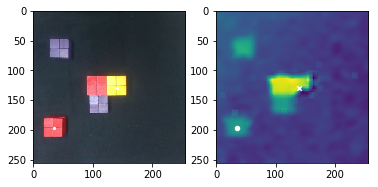

start pix : (35,197,0.492335771873) -> goal pix : (140,129,0.7054448939)
start pixel        goal pixek
x : 35.000000    x : 140.000000
y : 197.000000    y : 129.000000
z : 0.492336    z : 0.705445
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.848452    x : 0.745863
y : -0.146053    y : 0.024833
z : -0.195729    z : -0.082676
x : 0.006818    x : -0.022926
y : 0.986100    y : 0.989054
z : -0.014421    z : -0.018981
w : 0.165386    w : 0.144520


-----------data 111----------


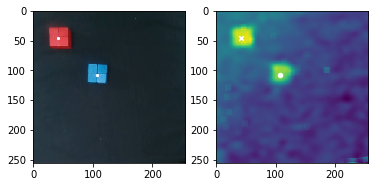

start pix : (107,107,0.491705547278) -> goal pix : (42,46,0.556827062749)
start pixel        goal pixek
x : 107.000000    x : 42.000000
y : 107.000000    y : 46.000000
z : 0.491706    z : 0.556827
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.696056    x : 0.599652
y : -0.032746    y : -0.131454
z : -0.208431    z : -0.147884
x : 0.005997    x : -0.041954
y : 0.993267    y : 0.990023
z : -0.050024    z : -0.042514
w : 0.104314    w : 0.127619


-----------data 112----------


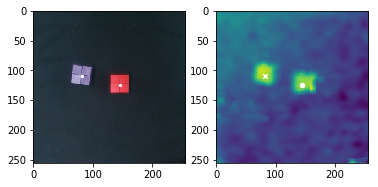

start pix : (145,124,0.495120639161) -> goal pix : (82,110,0.516528768565)
start pixel        goal pixek
x : 145.000000    x : 82.000000
y : 124.000000    y : 110.000000
z : 0.495121    z : 0.516529
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.719559    x : 0.693756
y : 0.028104    y : -0.076977
z : -0.214994    z : -0.157919
x : 0.028573    x : 0.099325
y : 0.994738    y : 0.991972
z : -0.041101    z : -0.032582
w : 0.089393    w : 0.071172


-----------data 113----------


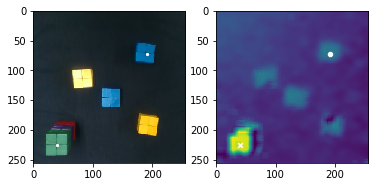

start pix : (191,73,0.462825506419) -> goal pix : (40,226,1.08666241061)
start pixel        goal pixek
x : 191.000000    x : 40.000000
y : 73.000000    y : 226.000000
z : 0.462826    z : 1.086662
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.641537    x : 0.876432
y : 0.110921    y : -0.112533
z : -0.209018    z : -0.047510
x : -0.111456    x : -0.031618
y : 0.984867    y : 0.976357
z : -0.021279    z : -0.026766
w : 0.131004    w : 0.212158


-----------data 114----------


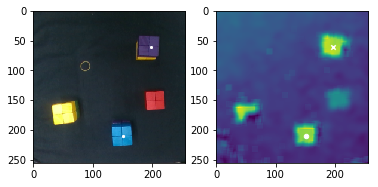

start pix : (151,211,0.795952911897) -> goal pix : (197,61,0.830219069171)
start pixel        goal pixek
x : 151.000000    x : 197.000000
y : 211.000000    y : 61.000000
z : 0.795953    z : 0.830219
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.884442    x : 0.652206
y : 0.034673    y : 0.104701
z : -0.156772    z : -0.097767
x : -0.037450    x : -0.022301
y : 0.986524    y : 0.991889
z : -0.014498    z : -0.028127
w : 0.158615    w : 0.121937


-----------data 115----------


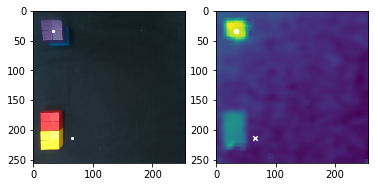

start pix : (33,33,0.8750440641) -> goal pix : (65,213,0.140169784465)
start pixel        goal pixek
x : 33.000000    x : 65.000000
y : 33.000000    y : 213.000000
z : 0.875044    z : 0.140170
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.580937    x : 0.874357
y : -0.137215    y : -0.105462
z : -0.157405    z : -0.192737
x : 0.015792    x : -0.716945
y : 0.998547    y : 0.692031
z : -0.010052    z : -0.035515
w : 0.050527    w : 0.076293


-----------data 116----------


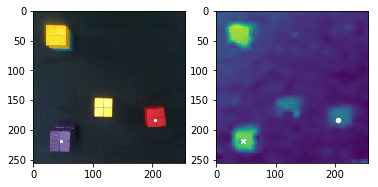

start pix : (205,183,0.428352879423) -> goal pix : (46,219,0.782235911878)
start pixel        goal pixek
x : 205.000000    x : 46.000000
y : 183.000000    y : 219.000000
z : 0.428353    z : 0.782236
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.833803    x : 0.883211
y : 0.141135    y : -0.115157
z : -0.209615    z : -0.097118
x : -0.050524    x : 0.035132
y : 0.981918    y : 0.983324
z : 0.034258    z : 0.001607
w : 0.179196    w : 0.178427


-----------data 117----------


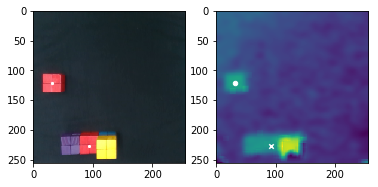

start pix : (31,122,0.498442868091) -> goal pix : (93,228,0.450493654481)
start pixel        goal pixek
x : 31.000000    x : 93.000000
y : 122.000000    y : 228.000000
z : 0.498443    z : 0.450494
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.724972    x : 0.893149
y : -0.154949    y : -0.046129
z : -0.215562    z : -0.157082
x : -0.016945    x : -0.710048
y : 0.992147    y : 0.690310
z : -0.023614    z : 0.001365
w : 0.121655    w : 0.138931


-----------data 118----------


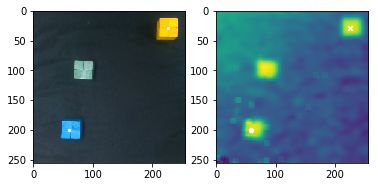

start pix : (59,201,0.477084107989) -> goal pix : (226,29,0.494955213546)
start pixel        goal pixek
x : 59.000000    x : 226.000000
y : 201.000000    y : 29.000000
z : 0.477084    z : 0.494955
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.846616    x : 0.565634
y : -0.102071    y : 0.180046
z : -0.207671    z : -0.147202
x : -0.001222    x : 0.057583
y : 0.990526    y : 0.988326
z : -0.000627    z : 0.107478
w : 0.137317    w : 0.091344


-----------data 119----------


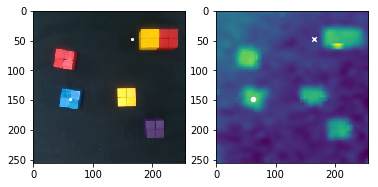

start pix : (62,149,0.507770980675) -> goal pix : (165,48,0.160332088701)
start pixel        goal pixek
x : 62.000000    x : 165.000000
y : 149.000000    y : 48.000000
z : 0.507771    z : 0.160332
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.767468    x : 0.594028
y : -0.103539    y : 0.087907
z : -0.203177    z : -0.193014
x : 0.053263    x : -0.675424
y : 0.988025    y : 0.717066
z : -0.022545    z : 0.053302
w : 0.143044    w : 0.163639


-----------data 120----------


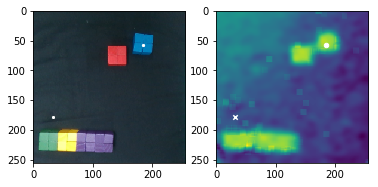

start pix : (185,57,0.500219634002) -> goal pix : (32,179,0.193931192768)
start pixel        goal pixek
x : 185.000000    x : 32.000000
y : 57.000000    y : 179.000000
z : 0.500220    z : 0.193931
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.600789    x : 0.823372
y : 0.110967    y : -0.150826
z : -0.195067    z : -0.189237
x : 0.043815    x : 0.007155
y : 0.997249    y : 0.995477
z : 0.020827    z : 0.029585
w : 0.056051    w : 0.089994


-----------data 121----------


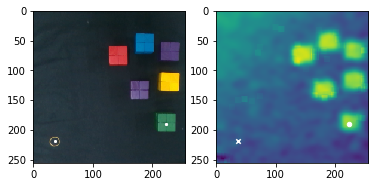

start pix : (223,190,0.440377594323) -> goal pix : (37,219,0.166666418801)
start pixel        goal pixek
x : 223.000000    x : 37.000000
y : 190.000000    y : 219.000000
z : 0.440378    z : 0.166666
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.852632    x : 0.904844
y : 0.177862    y : -0.146732
z : -0.187412    z : -0.180267
x : -0.042572    x : -0.063775
y : 0.977286    y : 0.978318
z : 0.039524    z : 0.009325
w : 0.203810    w : 0.196824


-----------data 122----------


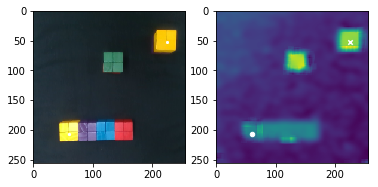

start pix : (60,207,0.45242201951) -> goal pix : (225,52,0.789101727968)
start pixel        goal pixek
x : 60.000000    x : 225.000000
y : 207.000000    y : 52.000000
z : 0.452422    z : 0.789102
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.860954    x : 0.613543
y : -0.104726    y : 0.164980
z : -0.207245    z : -0.093508
x : 0.686913    x : 0.032275
y : 0.721099    y : 0.990831
z : 0.024127    z : 0.083276
w : 0.087097    w : 0.101374


-----------data 123----------


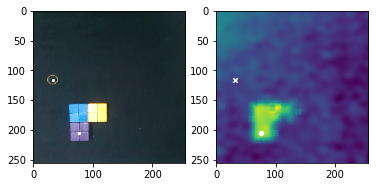

start pix : (76,205,0.473189080406) -> goal pix : (32,116,0.172841898806)
start pixel        goal pixek
x : 76.000000    x : 32.000000
y : 205.000000    y : 116.000000
z : 0.473189    z : 0.172842
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.850810    x : 0.702915
y : -0.077996    y : -0.169002
z : -0.203077    z : -0.190731
x : -0.007544    x : -0.011317
y : 0.994128    y : 0.993629
z : -0.014250    z : 0.003369
w : 0.106999    w : 0.112079


-----------data 124----------


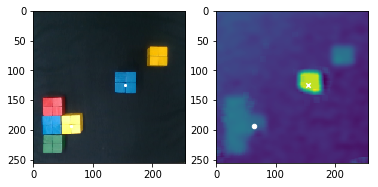

start pix : (63,193,0.445025779441) -> goal pix : (154,125,1.14725790893)
start pixel        goal pixek
x : 63.000000    x : 154.000000
y : 193.000000    y : 125.000000
z : 0.445026    z : 1.147258
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.843169    x : 0.730905
y : -0.093302    y : 0.047215
z : -0.194525    z : -0.037717
x : -0.728686    x : 0.010015
y : 0.677066    y : 0.995165
z : 0.007405    z : -0.041275
w : 0.102683    w : 0.088556


-----------data 125----------


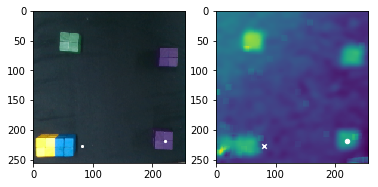

start pix : (221,218,0.42323128123) -> goal pix : (81,227,0.161076444967)
start pixel        goal pixek
x : 221.000000    x : 81.000000
y : 218.000000    y : 227.000000
z : 0.423231    z : 0.161076
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.912107    x : 0.900289
y : 0.166026    y : -0.033926
z : -0.187441    z : -0.182192
x : -0.009613    x : -0.728457
y : 0.957382    y : 0.634453
z : 0.022079    z : 0.090827
w : 0.287819    w : 0.242012


-----------data 126----------


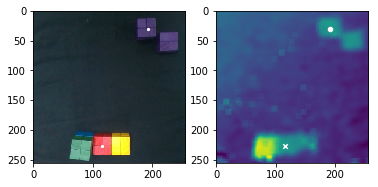

start pix : (192,31,0.485486203341) -> goal pix : (116,228,0.492106027412)
start pixel        goal pixek
x : 192.000000    x : 116.000000
y : 31.000000    y : 228.000000
z : 0.485486    z : 0.492106
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.563113    x : 0.898500
y : 0.108393    y : -0.019065
z : -0.204053    z : -0.147809
x : -0.116357    x : -0.695620
y : 0.992862    y : 0.704407
z : 0.003451    z : -0.066348
w : 0.025962    w : 0.124586


-----------data 127----------


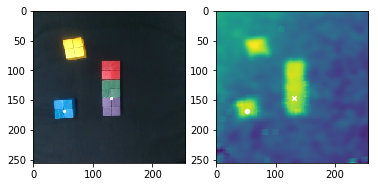

start pix : (52,168,0.481453545554) -> goal pix : (131,147,0.481532630838)
start pixel        goal pixek
x : 52.000000    x : 131.000000
y : 168.000000    y : 147.000000
z : 0.481454    z : 0.481533
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.797686    x : 0.771734
y : -0.121639    y : 0.015313
z : -0.198465    z : -0.143985
x : -0.027642    x : -0.004070
y : 0.992219    y : 0.990878
z : -0.016726    z : -0.015149
w : 0.120242    w : 0.133849


-----------data 128----------


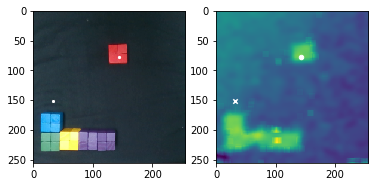

start pix : (143,77,0.513351721924) -> goal pix : (32,152,0.241872003871)
start pixel        goal pixek
x : 143.000000    x : 32.000000
y : 77.000000    y : 152.000000
z : 0.513352    z : 0.241872
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.640205    x : 0.779045
y : 0.039166    y : -0.151740
z : -0.195452    z : -0.187204
x : -0.035502    x : 0.010283
y : 0.997762    y : 0.995340
z : 0.024801    z : 0.004515
w : 0.050948    w : 0.095773


-----------data 129----------


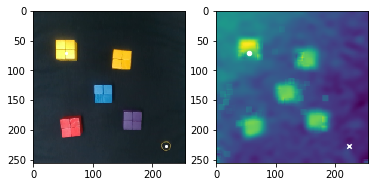

start pix : (55,71,0.439678684834) -> goal pix : (223,227,0.116378976891)
start pixel        goal pixek
x : 55.000000    x : 223.000000
y : 71.000000    y : 227.000000
z : 0.439679    z : 0.116379
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.629413    x : 0.911041
y : -0.101985    y : 0.183149
z : -0.193915    z : -0.167904
x : 0.025451    x : -0.050049
y : 0.996479    y : 0.962426
z : -0.015449    z : 0.062829
w : 0.078377    w : 0.259391


-----------data 130----------


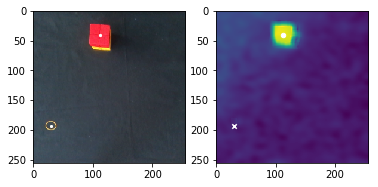

start pix : (112,40,0.886142334523) -> goal pix : (30,193,0.175673409159)
start pixel        goal pixek
x : 112.000000    x : 30.000000
y : 40.000000    y : 193.000000
z : 0.886142    z : 0.175673
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.592184    x : 0.840600
y : -0.004967    y : -0.160665
z : -0.156106    z : -0.218978
x : 0.064753    x : -0.001647
y : 0.997638    y : 0.996042
z : 0.005868    z : 0.007353
w : 0.022165    w : 0.088564


-----------data 131----------


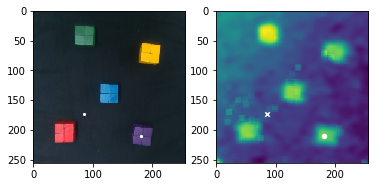

start pix : (181,210,0.472791753755) -> goal pix : (85,173,0.203498611988)
start pixel        goal pixek
x : 181.000000    x : 85.000000
y : 210.000000    y : 173.000000
z : 0.472792    z : 0.203499
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.882718    x : 0.823366
y : 0.109240    y : -0.048987
z : -0.209262    z : -0.195473
x : 0.016556    x : -0.005287
y : 0.975297    y : 0.972121
z : 0.013528    z : -0.004852
w : 0.219861    w : 0.234370


-----------data 132----------


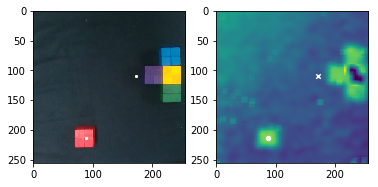

start pix : (88,214,0.48557937554) -> goal pix : (172,109,0.172591557015)
start pixel        goal pixek
x : 88.000000    x : 172.000000
y : 214.000000    y : 109.000000
z : 0.485579    z : 0.172592
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.884548    x : 0.701967
y : -0.059545    y : 0.097401
z : -0.199066    z : -0.191794
x : -0.008133    x : -0.700638
y : 0.993651    y : 0.705680
z : -0.015927    z : 0.068266
w : 0.111072    w : 0.080382


-----------data 133----------


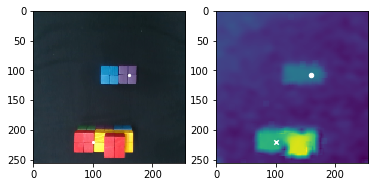

start pix : (160,107,0.487371656587) -> goal pix : (100,221,0.76390884523)
start pixel        goal pixek
x : 160.000000    x : 100.000000
y : 107.000000    y : 221.000000
z : 0.487372    z : 0.763909
o : 1.000000    o : 2.000000


start pose        goal pose
x : 0.694253    x : 0.870782
y : 0.051881    y : -0.029285
z : -0.203812    z : -0.094113
x : 0.677168    x : -0.702113
y : 0.724898    y : 0.706183
z : -0.027564    z : 0.010778
w : 0.123316    w : 0.090706


-----------data 134----------


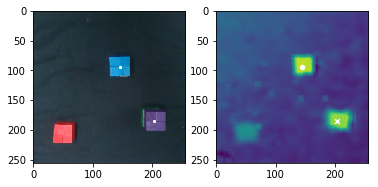

start pix : (145,94,0.853575290166) -> goal pix : (203,185,0.795768431106)
start pixel        goal pixek
x : 145.000000    x : 203.000000
y : 94.000000    y : 185.000000
z : 0.853575    z : 0.795768
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.691171    x : 0.844321
y : 0.040748    y : 0.134824
z : -0.148646    z : -0.086460
x : -0.012760    x : 0.011139
y : 0.992873    y : 0.989161
z : 0.030715    z : 0.027137
w : 0.114440    w : 0.143873


-----------data 135----------


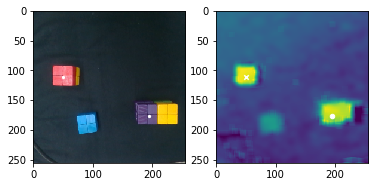

start pix : (195,177,0.790776296615) -> goal pix : (50,112,0.843245615104)
start pixel        goal pixek
x : 195.000000    x : 50.000000
y : 177.000000    y : 112.000000
z : 0.790776    z : 0.843246
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.822088    x : 0.714833
y : 0.106854    y : -0.115775
z : -0.164396    z : -0.108467
x : -0.720398    x : 0.021236
y : 0.686759    y : 0.998630
z : -0.013195    z : -0.017698
w : 0.095994    w : 0.044434


-----------data 136----------


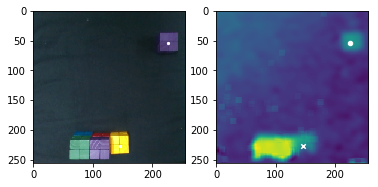

start pix : (226,54,0.475671164498) -> goal pix : (146,227,0.428151886589)
start pixel        goal pixek
x : 226.000000    x : 146.000000
y : 54.000000    y : 227.000000
z : 0.475671    z : 0.428152
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.615535    x : 0.903029
y : 0.176878    y : 0.050378
z : -0.198054    z : -0.131864
x : -0.033317    x : -0.735387
y : 0.997228    y : 0.665216
z : -0.009279    z : -0.039486
w : 0.065884    w : 0.123018


-----------data 137----------


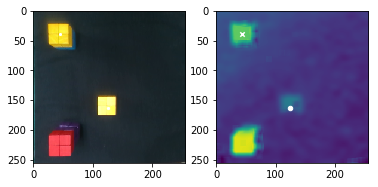

start pix : (125,163,0.415473871736) -> goal pix : (44,39,0.905085062778)
start pixel        goal pixek
x : 125.000000    x : 44.000000
y : 163.000000    y : 39.000000
z : 0.415474    z : 0.905085
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.796830    x : 0.609772
y : -0.005555    y : -0.118623
z : -0.201901    z : -0.086743
x : -0.015448    x : -0.004636
y : 0.986137    y : 0.988951
z : 0.030195    z : 0.011697
w : 0.162433    w : 0.147709


-----------data 138----------


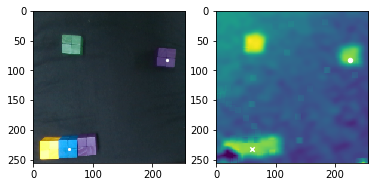

start pix : (225,82,0.47425372882) -> goal pix : (60,233,0.475033005333)
start pixel        goal pixek
x : 225.000000    x : 60.000000
y : 82.000000    y : 233.000000
z : 0.474254    z : 0.475033
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.650902    x : 0.898064
y : 0.166340    y : -0.110021
z : -0.211282    z : -0.160872
x : -0.071200    x : -0.054831
y : 0.993888    y : 0.992427
z : 0.028005    z : -0.000058
w : 0.079583    w : 0.109921


-----------data 139----------


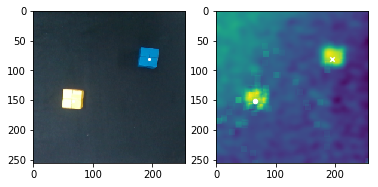

start pix : (66,152,0.408663976054) -> goal pix : (195,81,0.472572250993)
start pixel        goal pixek
x : 66.000000    x : 195.000000
y : 152.000000    y : 81.000000
z : 0.408664    z : 0.472572
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.766412    x : 0.654498
y : -0.086621    y : 0.129797
z : -0.204477    z : -0.143647
x : 0.004617    x : 0.028592
y : 0.994633    y : 0.998514
z : -0.025206    z : -0.018788
w : 0.100244    w : 0.042426


-----------data 140----------


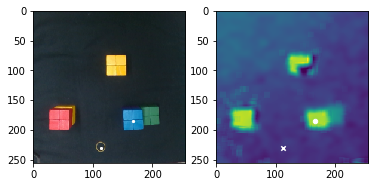

start pix : (167,185,0.788845840115) -> goal pix : (113,230,0.146975936656)
start pixel        goal pixek
x : 167.000000    x : 113.000000
y : 185.000000    y : 230.000000
z : 0.788846    z : 0.146976
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.840734    x : 0.935854
y : 0.074797    y : -0.012087
z : -0.154459    z : -0.199823
x : -0.022709    x : -0.031137
y : 0.993636    y : 0.982710
z : -0.015881    z : -0.007444
w : 0.109173    w : 0.182363


-----------data 141----------


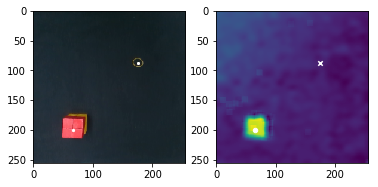

start pix : (66,200,0.868842615671) -> goal pix : (175,88,0.173766129742)
start pixel        goal pixek
x : 66.000000    x : 175.000000
y : 200.000000    y : 88.000000
z : 0.868843    z : 0.173766
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.831481    x : 0.650435
y : -0.080783    y : 0.095847
z : -0.154481    z : -0.199393
x : 0.030923    x : 0.012639
y : 0.999074    y : 0.999310
z : -0.008014    z : -0.034187
w : 0.028839    w : 0.007199


-----------data 142----------


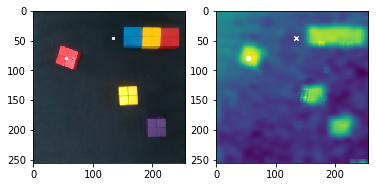

start pix : (54,79,0.522966337595) -> goal pix : (134,45,0.162284277785)
start pixel        goal pixek
x : 54.000000    x : 134.000000
y : 79.000000    y : 45.000000
z : 0.522966    z : 0.162284
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.647660    x : 0.594618
y : -0.108260    y : 0.017522
z : -0.201874    z : -0.190058
x : 0.064614    x : -0.686522
y : 0.992892    y : 0.716736
z : 0.020780    z : -0.042572
w : 0.097771    w : 0.114742


-----------data 143----------


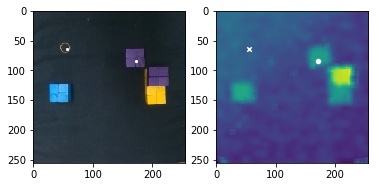

start pix : (172,84,0.484856747789) -> goal pix : (56,64,0.263131488259)
start pixel        goal pixek
x : 172.000000    x : 56.000000
y : 84.000000    y : 64.000000
z : 0.484857    z : 0.263131
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.654258    x : 0.616451
y : 0.077480    y : -0.125043
z : -0.194593    z : -0.182754
x : -0.023872    x : -0.005321
y : 0.997788    y : 0.993508
z : 0.014681    z : -0.001897
w : 0.060282    w : 0.113622


-----------data 144----------


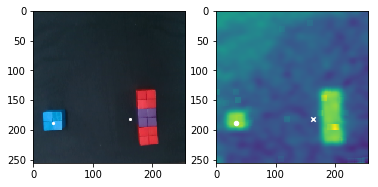

start pix : (33,188,0.494081861515) -> goal pix : (163,182,0.180376814816)
start pixel        goal pixek
x : 33.000000    x : 163.000000
y : 188.000000    y : 182.000000
z : 0.494082    z : 0.180377
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.834568    x : 0.818907
y : -0.152462    y : 0.076002
z : -0.203883    z : -0.203021
x : -0.059489    x : -0.711138
y : 0.981721    y : 0.672993
z : -0.024229    z : 0.114844
w : 0.179160    w : 0.167851


-----------data 145----------


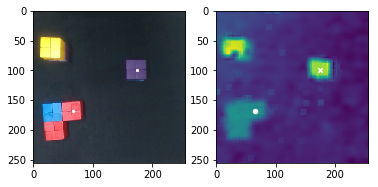

start pix : (66,169,0.463288938212) -> goal pix : (174,100,0.819701715077)
start pixel        goal pixek
x : 66.000000    x : 174.000000
y : 169.000000    y : 100.000000
z : 0.463289    z : 0.819702
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.780862    x : 0.679974
y : -0.093643    y : 0.083646
z : -0.206378    z : -0.097198
x : 0.701278    x : -0.031300
y : 0.710398    y : 0.998686
z : 0.029808    z : -0.034268
w : 0.051527    w : -0.021732


-----------data 146----------


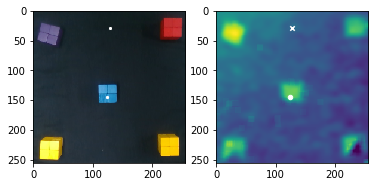

start pix : (124,145,0.482832171011) -> goal pix : (128,28,0.229718081617)
start pixel        goal pixek
x : 124.000000    x : 128.000000
y : 145.000000    y : 28.000000
z : 0.482832    z : 0.229718
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.752117    x : 0.578659
y : 0.006084    y : 0.010324
z : -0.210312    z : -0.200937
x : -0.010265    x : -0.013402
y : 0.992372    y : 0.994170
z : -0.013686    z : -0.011765
w : 0.122088    w : 0.106341


-----------data 147----------


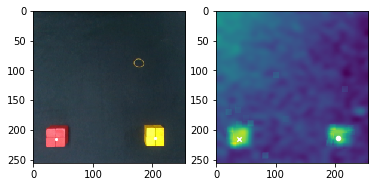

start pix : (205,214,0.441897312714) -> goal pix : (38,215,0.478017079159)
start pixel        goal pixek
x : 205.000000    x : 38.000000
y : 214.000000    y : 215.000000
z : 0.441897    z : 0.478017
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.881988    x : 0.869014
y : 0.141041    y : -0.141743
z : -0.198619    z : -0.150956
x : -0.017688    x : 0.003683
y : 0.977748    y : 0.976176
z : 0.025769    z : -0.029461
w : 0.207442    w : 0.214938


-----------data 148----------


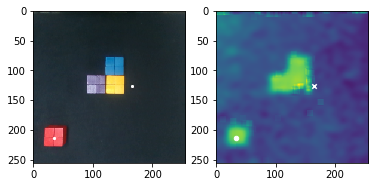

start pix : (34,213,0.474515760878) -> goal pix : (165,127,0.170657881928)
start pixel        goal pixek
x : 34.000000    x : 165.000000
y : 213.000000    y : 127.000000
z : 0.474516    z : 0.170658
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.858680    x : 0.700920
y : -0.143906    y : 0.097590
z : -0.210443    z : -0.201623
x : 0.001293    x : -0.680745
y : 0.984561    y : 0.714391
z : -0.012703    z : 0.144015
w : 0.174573    w : 0.074101


-----------data 149----------


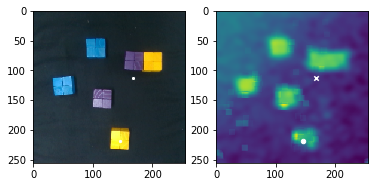

start pix : (146,219,0.381771089286) -> goal pix : (168,113,0.163221936456)
start pixel        goal pixek
x : 146.000000    x : 168.000000
y : 219.000000    y : 113.000000
z : 0.381771    z : 0.163222
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.887842    x : 0.713869
y : 0.044593    y : 0.085782
z : -0.196340    z : -0.192032
x : -0.003210    x : -0.012000
y : 0.990709    y : 0.994339
z : 0.006639    z : 0.040971
w : 0.135797    w : 0.097305


-----------data 150----------


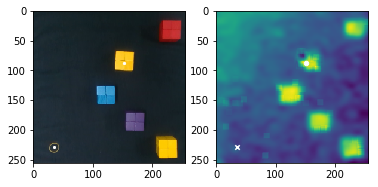

start pix : (152,87,0.448848366432) -> goal pix : (35,229,0.158120642625)
start pixel        goal pixek
x : 152.000000    x : 35.000000
y : 87.000000    y : 229.000000
z : 0.448848    z : 0.158121
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.662508    x : 0.917961
y : 0.055183    y : -0.160173
z : -0.205485    z : -0.192505
x : 0.005509    x : -0.024669
y : 0.992538    y : 0.986226
z : 0.012389    z : -0.025403
w : 0.121180    w : 0.161567


-----------data 151----------


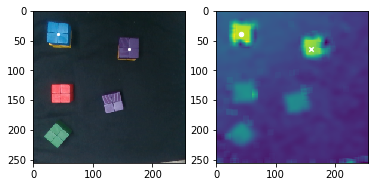

start pix : (42,39,0.925916845352) -> goal pix : (160,64,0.850136020223)
start pixel        goal pixek
x : 42.000000    x : 160.000000
y : 39.000000    y : 64.000000
z : 0.925917    z : 0.850136
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.603781    x : 0.649268
y : -0.118815    y : 0.062259
z : -0.155660    z : -0.099599
x : 0.028058    x : 0.007298
y : 0.998256    y : 0.999230
z : 0.010319    z : -0.017119
w : 0.050903    w : 0.034547


-----------data 152----------


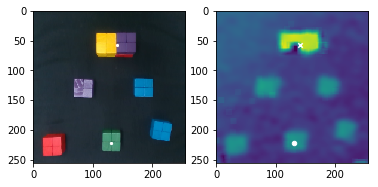

start pix : (131,222,0.478291839081) -> goal pix : (141,58,0.681093148839)
start pixel        goal pixek
x : 131.000000    x : 141.000000
y : 222.000000    y : 58.000000
z : 0.478292    z : 0.681093
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.898056    x : 0.636997
y : 0.016962    y : 0.033062
z : -0.208604    z : -0.091410
x : -0.027592    x : -0.024658
y : 0.978728    y : 0.979984
z : 0.005071    z : 0.001792
w : 0.203236    w : 0.197535


-----------data 153----------


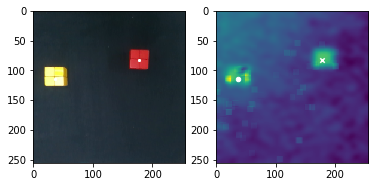

start pix : (36,115,0.45293496709) -> goal pix : (178,83,0.510519503563)
start pixel        goal pixek
x : 36.000000    x : 178.000000
y : 115.000000    y : 83.000000
z : 0.452935    z : 0.510520
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.697360    x : 0.666454
y : -0.130754    y : 0.101365
z : -0.200690    z : -0.148603
x : 0.005332    x : -0.005543
y : 0.998324    y : 0.993465
z : -0.015356    z : -0.035673
w : 0.055549    w : 0.108278


-----------data 154----------


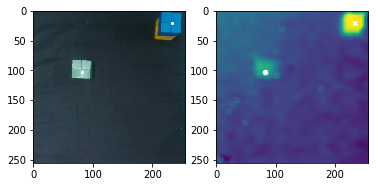

start pix : (82,103,0.492034351795) -> goal pix : (233,21,0.79438458104)
start pixel        goal pixek
x : 82.000000    x : 233.000000
y : 103.000000    y : 21.000000
z : 0.492034    z : 0.794385
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.675462    x : 0.567710
y : -0.067687    y : 0.177241
z : -0.198921    z : -0.092851
x : 0.024168    x : 0.052988
y : 0.998325    y : 0.996467
z : -0.012945    z : 0.002777
w : 0.050942    w : 0.065107


-----------data 155----------


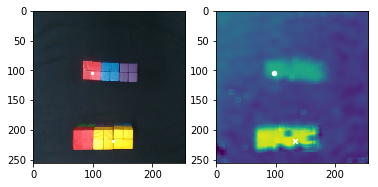

start pix : (98,104,0.514284847717) -> goal pix : (133,219,0.72939919024)
start pixel        goal pixek
x : 98.000000    x : 133.000000
y : 104.000000    y : 219.000000
z : 0.514285    z : 0.729399
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.692184    x : 0.882377
y : -0.034386    y : 0.021019
z : -0.199246    z : -0.092005
x : -0.680558    x : 0.017782
y : 0.719408    y : 0.989149
z : 0.109124    z : -0.010188
w : 0.085937    w : 0.145482


-----------data 156----------


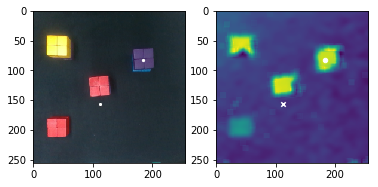

start pix : (184,82,0.796713125096) -> goal pix : (112,156,0.140642432566)
start pixel        goal pixek
x : 184.000000    x : 112.000000
y : 82.000000    y : 156.000000
z : 0.796713    z : 0.140642
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.665609    x : 0.789408
y : 0.093495    y : -0.018448
z : -0.158225    z : -0.201743
x : 0.012772    x : 0.002062
y : 0.995037    y : 0.998415
z : 0.001440    z : 0.006741
w : 0.098671    w : 0.055846


-----------data 157----------


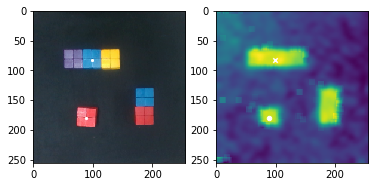

start pix : (89,180,0.490286333442) -> goal pix : (99,82,0.510220020334)
start pixel        goal pixek
x : 89.000000    x : 99.000000
y : 180.000000    y : 82.000000
z : 0.490286    z : 0.510220
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.804803    x : 0.646331
y : -0.066353    y : -0.049083
z : -0.208848    z : -0.150263
x : 0.067897    x : 0.004046
y : 0.991148    y : 0.993188
z : -0.024745    z : -0.020691
w : 0.111368    w : 0.114596


-----------data 158----------


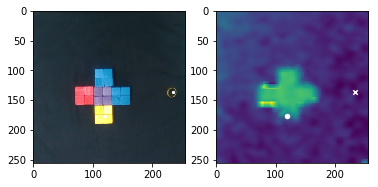

start pix : (120,176,0.305359172862) -> goal pix : (234,137,0.1095456844)
start pixel        goal pixek
x : 120.000000    x : 234.000000
y : 176.000000    y : 137.000000
z : 0.305359    z : 0.109546
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.799357    x : 0.746070
y : -0.015513    y : 0.187851
z : -0.207526    z : -0.198957
x : -0.010832    x : -0.055043
y : 0.994157    y : 0.990126
z : -0.016211    z : -0.007087
w : 0.106164    w : 0.128725


-----------data 159----------


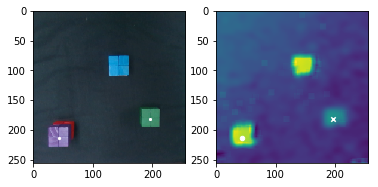

start pix : (43,214,0.820419215874) -> goal pix : (196,181,0.481639169736)
start pixel        goal pixek
x : 43.000000    x : 196.000000
y : 214.000000    y : 181.000000
z : 0.820419    z : 0.481639
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.872431    x : 0.837973
y : -0.117909    y : 0.132982
z : -0.153085    z : -0.142972
x : -0.001835    x : 0.014129
y : 0.987232    y : 0.987209
z : -0.013545    z : -0.005614
w : 0.158704    w : 0.158706


-----------data 160----------


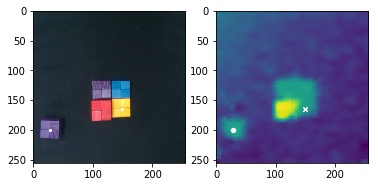

start pix : (28,200,0.496637427864) -> goal pix : (149,165,0.462410394124)
start pixel        goal pixek
x : 28.000000    x : 149.000000
y : 200.000000    y : 165.000000
z : 0.496637    z : 0.462410
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.863013    x : 0.786054
y : -0.152900    y : 0.065957
z : -0.207966    z : -0.153834
x : -0.006984    x : -0.737676
y : 0.982973    y : 0.662113
z : -0.021099    z : 0.071851
w : 0.182399    w : 0.110808


-----------data 161----------


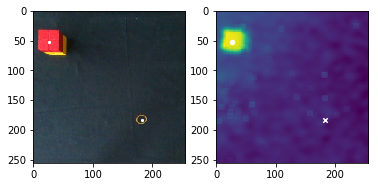

start pix : (26,53,0.89540382927) -> goal pix : (183,183,0.16994124376)
start pixel        goal pixek
x : 26.000000    x : 183.000000
y : 53.000000    y : 183.000000
z : 0.895404    z : 0.169941
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.593914    x : 0.839935
y : -0.143938    y : 0.096152
z : -0.154677    z : -0.202399
x : 0.081408    x : -0.061139
y : 0.995995    y : 0.985907
z : 0.009867    z : -0.018126
w : -0.035618    w : 0.154663


-----------data 162----------


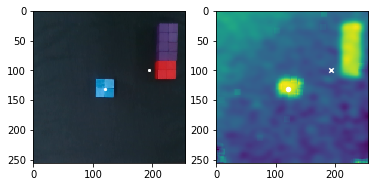

start pix : (121,132,0.490349244411) -> goal pix : (194,100,0.177317590438)
start pixel        goal pixek
x : 121.000000    x : 194.000000
y : 132.000000    y : 100.000000
z : 0.490349    z : 0.177318
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.751150    x : 0.687751
y : -0.017017    y : 0.122170
z : -0.205768    z : -0.192150
x : -0.019681    x : -0.693997
y : 0.987320    y : 0.707227
z : -0.035481    z : 0.063886
w : 0.153469    w : 0.118814


-----------data 163----------


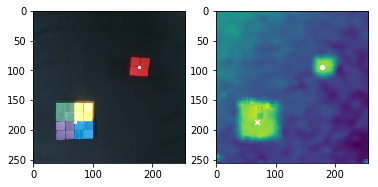

start pix : (178,95,0.471864279818) -> goal pix : (69,187,0.481432866843)
start pixel        goal pixek
x : 178.000000    x : 69.000000
y : 95.000000    y : 187.000000
z : 0.471864    z : 0.481433
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.685568    x : 0.834113
y : 0.101603    y : -0.081247
z : -0.206807    z : -0.149573
x : -0.003426    x : -0.036215
y : 0.990050    y : 0.988673
z : -0.018686    z : -0.003398
w : 0.139425    w : 0.145611


-----------data 164----------


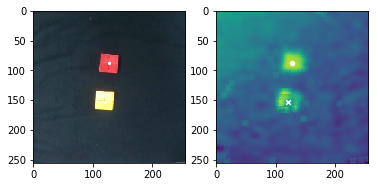

start pix : (127,88,0.513058342211) -> goal pix : (121,154,0.348453662459)
start pixel        goal pixek
x : 127.000000    x : 121.000000
y : 88.000000    y : 154.000000
z : 0.513058    z : 0.348454
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.669597    x : 0.775977
y : 0.009227    y : -0.008881
z : -0.207788    z : -0.152363
x : -0.039553    x : 0.001157
y : 0.997008    y : 0.997269
z : 0.025357    z : 0.019377
w : 0.061381    w : 0.071255


-----------data 165----------


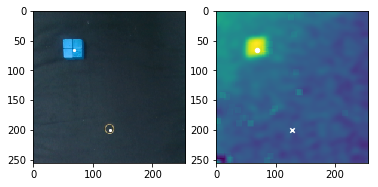

start pix : (68,65,0.560601212242) -> goal pix : (128,200,0.159361528014)
start pixel        goal pixek
x : 68.000000    x : 128.000000
y : 65.000000    y : 200.000000
z : 0.560601    z : 0.159362
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.622869    x : 0.854473
y : -0.083105    y : 0.015364
z : -0.191329    z : -0.186917
x : -0.012009    x : -0.001959
y : 0.997987    y : 0.995962
z : 0.036447    z : 0.023986
w : 0.050483    w : 0.086490


-----------data 166----------


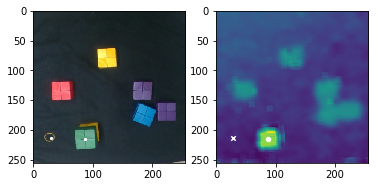

start pix : (87,215,0.780355467584) -> goal pix : (29,213,0.122501409208)
start pixel        goal pixek
x : 87.000000    x : 29.000000
y : 215.000000    y : 213.000000
z : 0.780355    z : 0.122501
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.888042    x : 0.892006
y : -0.063595    y : -0.190366
z : -0.152051    z : -0.201524
x : -0.096545    x : -0.054158
y : 0.987098    y : 0.990615
z : -0.031980    z : -0.038865
w : 0.123670    w : 0.119325


-----------data 167----------


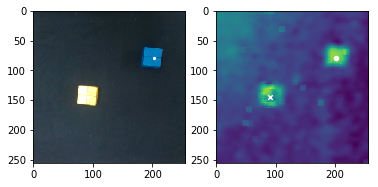

start pix : (202,80,0.45904118847) -> goal pix : (91,144,0.360410298748)
start pixel        goal pixek
x : 202.000000    x : 91.000000
y : 80.000000    y : 144.000000
z : 0.459041    z : 0.360410
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.650568    x : 0.755979
y : 0.130139    y : -0.053326
z : -0.202021    z : -0.143760
x : 0.056016    x : 0.080358
y : 0.994533    y : 0.995164
z : -0.032484    z : -0.011814
w : 0.081926    w : 0.055243


-----------data 168----------


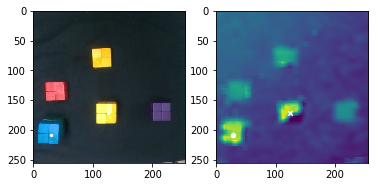

start pix : (29,208,0.816496820129) -> goal pix : (125,172,0.655458981931)
start pixel        goal pixek
x : 29.000000    x : 125.000000
y : 208.000000    y : 172.000000
z : 0.816497    z : 0.655459
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.861866    x : 0.814508
y : -0.152433    y : -0.001446
z : -0.159847    z : -0.108922
x : -0.020639    x : -0.009217
y : 0.990581    y : 0.990993
z : -0.053013    z : -0.033016
w : 0.124551    w : 0.129451


-----------data 169----------


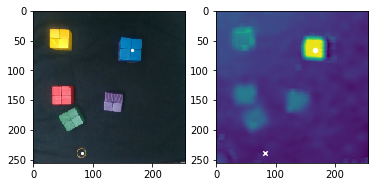

start pix : (166,65,1.15798159847) -> goal pix : (82,239,0.0933330667615)
start pixel        goal pixek
x : 166.000000    x : 82.000000
y : 65.000000    y : 239.000000
z : 1.157982    z : 0.093333
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.655952    x : 0.935825
y : 0.060603    y : -0.079411
z : -0.101780    z : -0.200019
x : -0.033380    x : -0.052936
y : 0.996058    y : 0.986302
z : -0.036836    z : -0.001326
w : 0.073464    w : 0.156218


-----------data 170----------


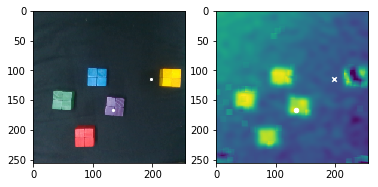

start pix : (134,166,0.481794789036) -> goal pix : (198,115,0.143597583867)
start pixel        goal pixek
x : 134.000000    x : 198.000000
y : 166.000000    y : 115.000000
z : 0.481795    z : 0.143598
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.794985    x : 0.708973
y : 0.031484    y : 0.142986
z : -0.198870    z : -0.179039
x : 0.030533    x : -0.705814
y : 0.992300    y : 0.703236
z : 0.009583    z : 0.054876
w : 0.119655    w : 0.065383


-----------data 171----------


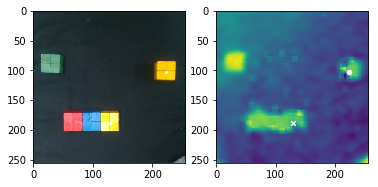

start pix : (223,103,0.443245225281) -> goal pix : (129,188,0.372328759581)
start pixel        goal pixek
x : 223.000000    x : 129.000000
y : 103.000000    y : 188.000000
z : 0.443245    z : 0.372329
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.692938    x : 0.831629
y : 0.177295    y : 0.021887
z : -0.199250    z : -0.138759
x : 0.009293    x : -0.695321
y : 0.991469    y : 0.700450
z : 0.055881    z : 0.104250
w : 0.117391    w : 0.122599


-----------data 172----------


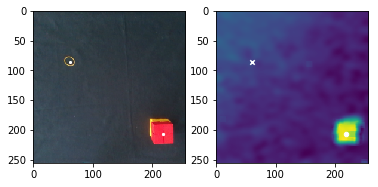

start pix : (218,207,0.779795950181) -> goal pix : (61,86,0.257869114516)
start pixel        goal pixek
x : 218.000000    x : 61.000000
y : 207.000000    y : 86.000000
z : 0.779796    z : 0.257869
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.870131    x : 0.655954
y : 0.161284    y : -0.110184
z : -0.153692    z : -0.213506
x : -0.045156    x : -0.062547
y : 0.973017    y : 0.992815
z : 0.070322    z : -0.042957
w : 0.215067    w : 0.092529


-----------data 173----------


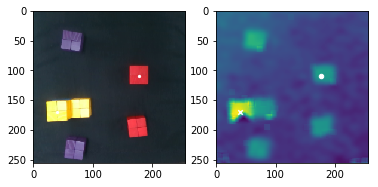

start pix : (177,110,0.477489121) -> goal pix : (40,170,0.811236021093)
start pixel        goal pixek
x : 177.000000    x : 40.000000
y : 110.000000    y : 170.000000
z : 0.477489    z : 0.811236
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.714755    x : 0.806249
y : 0.085671    y : -0.134146
z : -0.212014    z : -0.106969
x : 0.007841    x : -0.015323
y : 0.993826    y : 0.992778
z : -0.008633    z : -0.018016
w : 0.110337    w : 0.117607


-----------data 174----------


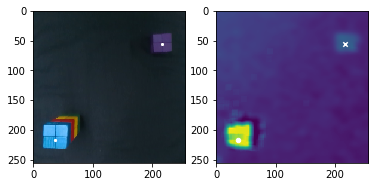

start pix : (37,217,1.5122365466) -> goal pix : (217,56,0.452425649067)
start pixel        goal pixek
x : 37.000000    x : 217.000000
y : 217.000000    y : 56.000000
z : 1.512237    z : 0.452426
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.848482    x : 0.629459
y : -0.102915    y : 0.165310
z : -0.042717    z : -0.130964
x : 0.001878    x : -0.041310
y : 0.983251    y : 0.981773
z : -0.029117    z : 0.003799
w : 0.179906    w : 0.185472


-----------data 175----------


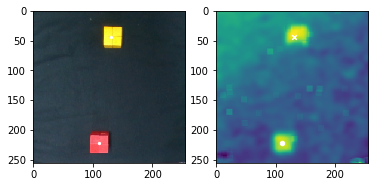

start pix : (111,222,0.460360825485) -> goal pix : (131,44,0.491305465906)
start pixel        goal pixek
x : 111.000000    x : 131.000000
y : 222.000000    y : 44.000000
z : 0.460361    z : 0.491305
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.908288    x : 0.612442
y : -0.023900    y : 0.017142
z : -0.207229    z : -0.142603
x : -0.000789    x : 0.013606
y : 0.983092    y : 0.990614
z : 0.019489    z : 0.017413
w : 0.182072    w : 0.134888


-----------data 176----------


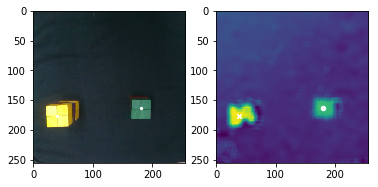

start pix : (180,164,0.808028245286) -> goal pix : (39,177,1.17470258605)
start pixel        goal pixek
x : 180.000000    x : 39.000000
y : 164.000000    y : 177.000000
z : 0.808028    z : 1.174703
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.810864    x : 0.816517
y : 0.082694    y : -0.122526
z : -0.156938    z : -0.054025
x : 0.010764    x : 0.001674
y : 0.994167    y : 0.990975
z : 0.003847    z : -0.006756
w : 0.107248    w : 0.133864


-----------data 177----------


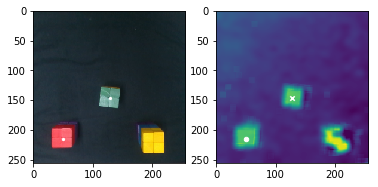

start pix : (50,216,0.77516734921) -> goal pix : (128,147,0.789800145107)
start pixel        goal pixek
x : 50.000000    x : 128.000000
y : 216.000000    y : 147.000000
z : 0.775167    z : 0.789800
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.875126    x : 0.776431
y : -0.110534    y : 0.012774
z : -0.148470    z : -0.093002
x : -0.031988    x : 0.035209
y : 0.989156    y : 0.989536
z : -0.030462    z : -0.018343
w : 0.140066    w : 0.138716


-----------data 178----------


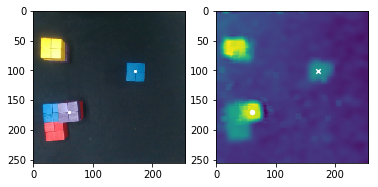

start pix : (60,170,0.851234054867) -> goal pix : (171,101,0.479064747593)
start pixel        goal pixek
x : 60.000000    x : 171.000000
y : 170.000000    y : 101.000000
z : 0.851234    z : 0.479065
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.785352    x : 0.679068
y : -0.092542    y : 0.079258
z : -0.162106    z : -0.159576
x : -0.028916    x : 0.019138
y : 0.993109    y : 0.997790
z : -0.024795    z : -0.032547
w : 0.110831    w : 0.054672


-----------data 179----------


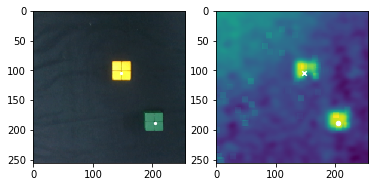

start pix : (205,189,0.466653163398) -> goal pix : (148,104,0.399107478058)
start pixel        goal pixek
x : 205.000000    x : 148.000000
y : 189.000000    y : 104.000000
z : 0.466653    z : 0.399107
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.838996    x : 0.697038
y : 0.134905    y : 0.037588
z : -0.200897    z : -0.145323
x : -0.031964    x : 0.007162
y : 0.982340    y : 0.985261
z : 0.011034    z : -0.003636
w : 0.184022    w : 0.170866


-----------data 180----------


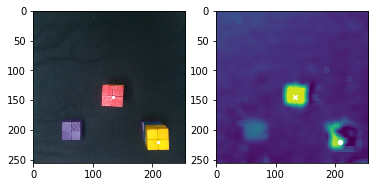

start pix : (209,220,0.994558384345) -> goal pix : (133,144,1.12478614429)
start pixel        goal pixek
x : 209.000000    x : 133.000000
y : 220.000000    y : 144.000000
z : 0.994558    z : 1.124786
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.883252    x : 0.775624
y : 0.118726    y : 0.008767
z : -0.095607    z : -0.037258
x : -0.018929    x : 0.032489
y : 0.981760    y : 0.984332
z : -0.009535    z : -0.010805
w : 0.188939    w : 0.172967


-----------data 181----------


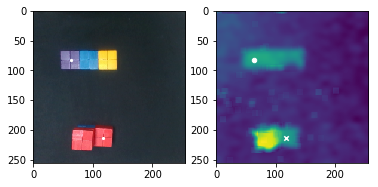

start pix : (63,83,0.531066898937) -> goal pix : (117,214,0.504233842896)
start pixel        goal pixek
x : 63.000000    x : 117.000000
y : 83.000000    y : 214.000000
z : 0.531067    z : 0.504234
o : 2.000000    o : 2.000000


start pose        goal pose
x : 0.635121    x : 0.857647
y : -0.099332    y : -0.008508
z : -0.196202    z : -0.145730
x : -0.705880    x : -0.684661
y : 0.708148    y : 0.724833
z : -0.015937    z : -0.048517
w : 0.002576    w : 0.059176


-----------data 182----------


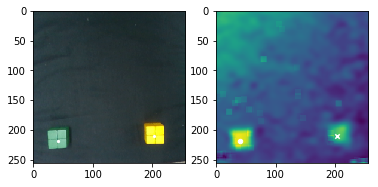

start pix : (41,219,0.464160109254) -> goal pix : (203,211,0.357364099271)
start pixel        goal pixek
x : 41.000000    x : 203.000000
y : 219.000000    y : 211.000000
z : 0.464160    z : 0.357364
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.886717    x : 0.887105
y : -0.124999    y : 0.138538
z : -0.204389    z : -0.147382
x : 0.031598    x : 0.026607
y : 0.985394    y : 0.983332
z : 0.017440    z : 0.037175
w : 0.166421    w : 0.175981


-----------data 183----------


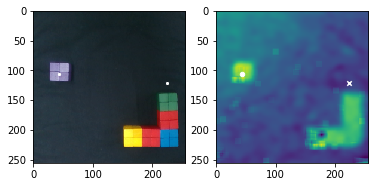

start pix : (43,106,0.519210860791) -> goal pix : (224,121,0.13853023372)
start pixel        goal pixek
x : 43.000000    x : 224.000000
y : 106.000000    y : 121.000000
z : 0.519211    z : 0.138530
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.686346    x : 0.733684
y : -0.121651    y : 0.176759
z : -0.204912    z : -0.201539
x : 0.019554    x : -0.008021
y : 0.996497    y : 0.991152
z : -0.020631    z : 0.000618
w : 0.078644    w : 0.132491


-----------data 184----------


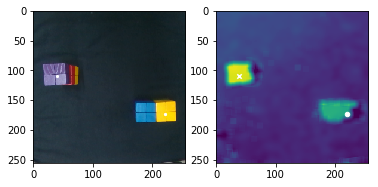

start pix : (221,173,0.761023530353) -> goal pix : (39,110,1.19641400321)
start pixel        goal pixek
x : 221.000000    x : 39.000000
y : 173.000000    y : 110.000000
z : 0.761024    z : 1.196414
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.820672    x : 0.716168
y : 0.154367    y : -0.124017
z : -0.158024    z : -0.053951
x : -0.715560    x : -0.005434
y : 0.687435    y : 0.994573
z : 0.008312    z : -0.048799
w : 0.123845    w : 0.091727


-----------data 185----------


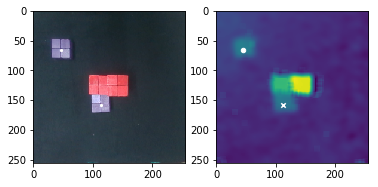

start pix : (46,65,0.505952450442) -> goal pix : (113,158,0.470906894585)
start pixel        goal pixek
x : 46.000000    x : 113.000000
y : 65.000000    y : 158.000000
z : 0.505952    z : 0.470907
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.625363    x : 0.778221
y : -0.134774    y : -0.029873
z : -0.194768    z : -0.142325
x : 0.004965    x : -0.025435
y : 0.995411    y : 0.998321
z : -0.032300    z : -0.042831
w : 0.089936    w : 0.029571


-----------data 186----------


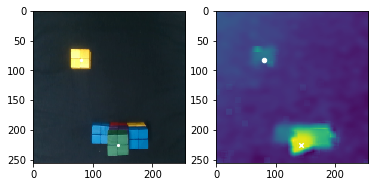

start pix : (80,82,0.451806349765) -> goal pix : (142,226,1.11437529247)
start pixel        goal pixek
x : 80.000000    x : 142.000000
y : 82.000000    y : 226.000000
z : 0.451806    z : 1.114375
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.648572    x : 0.874677
y : -0.069351    y : 0.032965
z : -0.204124    z : -0.048069
x : 0.024894    x : 0.007229
y : 0.997549    y : 0.995029
z : -0.011380    z : -0.002933
w : 0.064397    w : 0.099280


-----------data 187----------


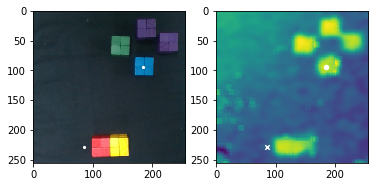

start pix : (185,94,0.474091729312) -> goal pix : (85,229,0.16708356967)
start pixel        goal pixek
x : 185.000000    x : 85.000000
y : 94.000000    y : 229.000000
z : 0.474092    z : 0.167084
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.675131    x : 0.889591
y : 0.116575    y : -0.057213
z : -0.193426    z : -0.185388
x : -0.023814    x : -0.677261
y : 0.996298    y : 0.723483
z : 0.054202    z : -0.043870
w : 0.062339    w : 0.126357


-----------data 188----------


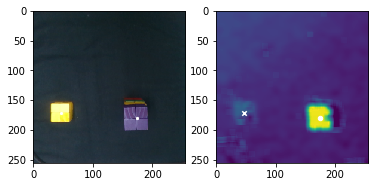

start pix : (174,180,1.46354914942) -> goal pix : (47,171,0.411535924232)
start pixel        goal pixek
x : 174.000000    x : 47.000000
y : 180.000000    y : 171.000000
z : 1.463549    z : 0.411536
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.815741    x : 0.814463
y : 0.069688    y : -0.123106
z : -0.052765    z : -0.153330
x : -0.017786    x : 0.018239
y : 0.997013    y : 0.996074
z : -0.028329    z : -0.036009
w : 0.069614    w : 0.078785


-----------data 189----------


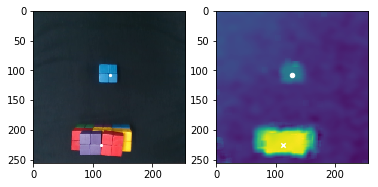

start pix : (128,107,0.49287134315) -> goal pix : (113,225,1.12308957858)
start pixel        goal pixek
x : 128.000000    x : 113.000000
y : 107.000000    y : 225.000000
z : 0.492871    z : 1.123090
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.703487    x : 0.883031
y : 0.001301    y : -0.003931
z : -0.209531    z : -0.054694
x : 0.003782    x : -0.023406
y : 0.996779    y : 0.994719
z : -0.021242    z : 0.009516
w : 0.077242    w : 0.099475


-----------data 190----------


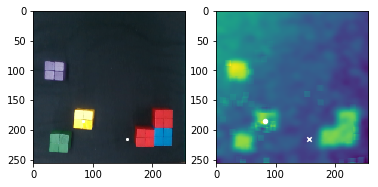

start pix : (83,185,0.433435699947) -> goal pix : (157,215,0.1291033866)
start pixel        goal pixek
x : 83.000000    x : 157.000000
y : 185.000000    y : 215.000000
z : 0.433436    z : 0.129103
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.824519    x : 0.878387
y : -0.047336    y : 0.081893
z : -0.208017    z : -0.198089
x : 0.015503    x : -0.691498
y : 0.992543    y : 0.702278
z : -0.022402    z : 0.016747
w : 0.118807    w : 0.168393


-----------data 191----------


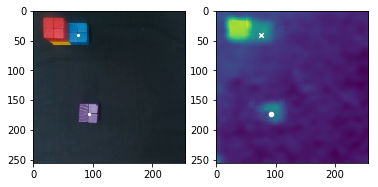

start pix : (93,174,0.428358490588) -> goal pix : (75,40,0.55744139379)
start pixel        goal pixek
x : 93.000000    x : 75.000000
y : 174.000000    y : 40.000000
z : 0.428358    z : 0.557441
o : 2.000000    o : 2.000000


start pose        goal pose
x : 0.807550    x : 0.579998
y : -0.051596    y : -0.083900
z : -0.211482    z : -0.150588
x : -0.704200    x : -0.712261
y : 0.703843    y : 0.699017
z : 0.014857    z : 0.010384
w : 0.092121    w : 0.062859


-----------data 192----------


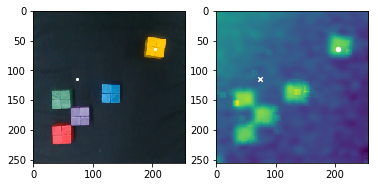

start pix : (205,64,0.464027471725) -> goal pix : (74,115,0.183746769168)
start pixel        goal pixek
x : 205.000000    x : 74.000000
y : 64.000000    y : 115.000000
z : 0.464027    z : 0.183747
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.624130    x : 0.726451
y : 0.147840    y : -0.074438
z : -0.208429    z : -0.200395
x : -0.036458    x : -0.039864
y : 0.991362    y : 0.986802
z : -0.013174    z : -0.023720
w : 0.125297    w : 0.155144


-----------data 193----------


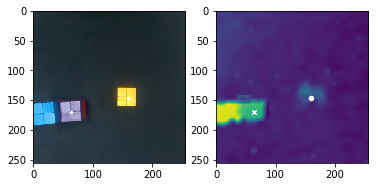

start pix : (159,147,0.294082427509) -> goal pix : (63,170,0.802984849402)
start pixel        goal pixek
x : 159.000000    x : 63.000000
y : 147.000000    y : 170.000000
z : 0.294082    z : 0.802985
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.759816    x : 0.772650
y : 0.052225    y : -0.081221
z : -0.206643    z : -0.106008
x : -0.015734    x : -0.745193
y : 0.992531    y : 0.660364
z : -0.019955    z : 0.066066
w : 0.119318    w : 0.065129


-----------data 194----------


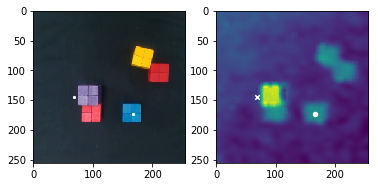

start pix : (167,174,0.48953106816) -> goal pix : (68,144,0.228812922132)
start pixel        goal pixek
x : 167.000000    x : 68.000000
y : 174.000000    y : 144.000000
z : 0.489531    z : 0.228813
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.821324    x : 0.751731
y : 0.076273    y : -0.069301
z : -0.202951    z : -0.194926
x : -0.037850    x : -0.704499
y : 0.984355    y : 0.690126
z : -0.005481    z : 0.093702
w : 0.171997    w : 0.136482


-----------data 195----------


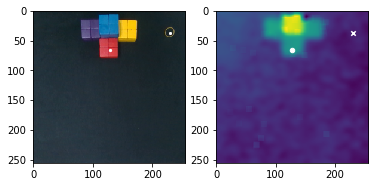

start pix : (128,65,0.488742664857) -> goal pix : (230,37,0.126592900816)
start pixel        goal pixek
x : 128.000000    x : 230.000000
y : 65.000000    y : 37.000000
z : 0.488743    z : 0.126593
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.617248    x : 0.569732
y : 0.006425    y : 0.185185
z : -0.202886    z : -0.195022
x : 0.018878    x : -0.005035
y : 0.996834    y : 0.996137
z : -0.059522    z : -0.026958
w : 0.049230    w : 0.083416


-----------data 196----------


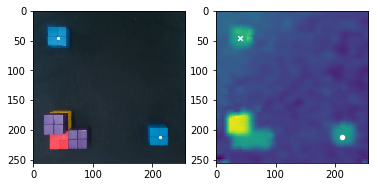

start pix : (212,212,0.45970486033) -> goal pix : (41,45,0.544103243047)
start pixel        goal pixek
x : 212.000000    x : 41.000000
y : 212.000000    y : 45.000000
z : 0.459705    z : 0.544103
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.884976    x : 0.591903
y : 0.145506    y : -0.138123
z : -0.211179    z : -0.159421
x : -0.040820    x : 0.009179
y : 0.971267    y : 0.998120
z : -0.002651    z : -0.031042
w : 0.234452    w : 0.052040


-----------data 197----------


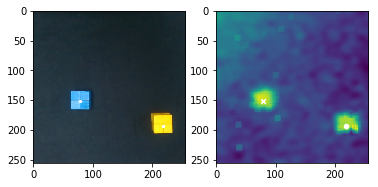

start pix : (218,194,0.464772332548) -> goal pix : (79,152,0.492344211)
start pixel        goal pixek
x : 218.000000    x : 79.000000
y : 194.000000    y : 152.000000
z : 0.464772    z : 0.492344
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.840060    x : 0.774070
y : 0.154982    y : -0.075660
z : -0.205485    z : -0.140333
x : -0.036925    x : 0.008007
y : 0.983990    y : 0.980221
z : 0.052722    z : 0.019713
w : 0.166195    w : 0.196757


-----------data 198----------


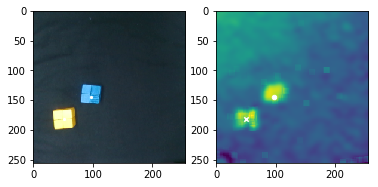

start pix : (97,144,0.490436833927) -> goal pix : (51,182,0.422905581368)
start pixel        goal pixek
x : 97.000000    x : 51.000000
y : 144.000000    y : 182.000000
z : 0.490437    z : 0.422906
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.764497    x : 0.833094
y : -0.045479    y : -0.121646
z : -0.197494    z : -0.145345
x : -0.018916    x : -0.064877
y : 0.996211    y : 0.993996
z : 0.023818    z : 0.028854
w : 0.081479    w : 0.083252


-----------data 199----------


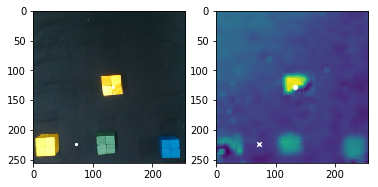

start pix : (133,128,0.658514857514) -> goal pix : (72,224,0.148456975035)
start pixel        goal pixek
x : 133.000000    x : 72.000000
y : 128.000000    y : 224.000000
z : 0.658515    z : 0.148457
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.735983    x : 0.903185
y : 0.015598    y : -0.083836
z : -0.151184    z : -0.198110
x : -0.014150    x : -0.008960
y : 0.995148    y : 0.990175
z : 0.005898    z : -0.007598
w : 0.097192    w : 0.139341


-----------data 200----------


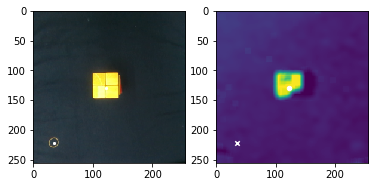

start pix : (122,129,1.76364821497) -> goal pix : (35,222,0.144248283722)
start pixel        goal pixek
x : 122.000000    x : 35.000000
y : 129.000000    y : 222.000000
z : 1.763648    z : 0.144248
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.738794    x : 0.897251
y : 0.009062    y : -0.159171
z : 0.001125    z : -0.197381
x : -0.031622    x : -0.033067
y : 0.996430    y : 0.990121
z : -0.000760    z : 0.018807
w : 0.078274    w : 0.134958


-----------data 201----------


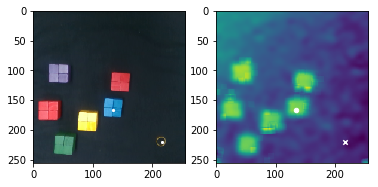

start pix : (134,166,0.468291578888) -> goal pix : (217,220,0.0738594913504)
start pixel        goal pixek
x : 134.000000    x : 217.000000
y : 166.000000    y : 220.000000
z : 0.468292    z : 0.073859
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.785116    x : 0.894167
y : 0.027965    y : 0.168074
z : -0.206530    z : -0.196032
x : 0.023860    x : -0.040187
y : 0.992873    y : 0.967621
z : 0.008112    z : 0.014341
w : 0.116486    w : 0.248774


-----------data 202----------


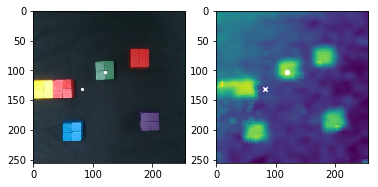

start pix : (120,102,0.498822339925) -> goal pix : (82,131,0.190820650032)
start pixel        goal pixek
x : 120.000000    x : 82.000000
y : 102.000000    y : 131.000000
z : 0.498822    z : 0.190821
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.694958    x : 0.734424
y : 0.003865    y : -0.040594
z : -0.188692    z : -0.178511
x : -0.052555    x : -0.693714
y : 0.990597    y : 0.707244
z : -0.042063    z : 0.069901
w : 0.119104    w : 0.116963


-----------data 203----------


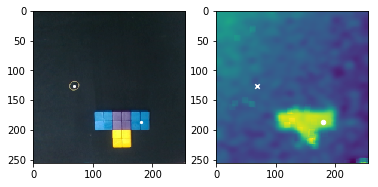

start pix : (180,187,0.457350282746) -> goal pix : (68,126,0.162354651319)
start pixel        goal pixek
x : 180.000000    x : 68.000000
y : 187.000000    y : 126.000000
z : 0.457350    z : 0.162355
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.821805    x : 0.711337
y : 0.109138    y : -0.096601
z : -0.212487    z : -0.205894
x : -0.714374    x : -0.039049
y : 0.691171    y : 0.997055
z : 0.013748    z : -0.022471
w : 0.108459    w : 0.062067


-----------data 204----------


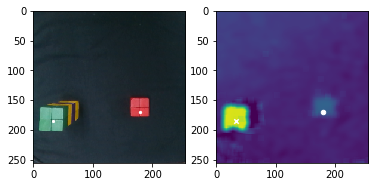

start pix : (179,170,0.465073451519) -> goal pix : (33,186,1.45305419115)
start pixel        goal pixek
x : 179.000000    x : 33.000000
y : 170.000000    y : 186.000000
z : 0.465073    z : 1.453054
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.806080    x : 0.809586
y : 0.085940    y : -0.121676
z : -0.204349    z : -0.002244
x : -0.041824    x : 0.007181
y : 0.993999    y : 0.994777
z : 0.003786    z : 0.002126
w : 0.101011    w : 0.101796


-----------data 205----------


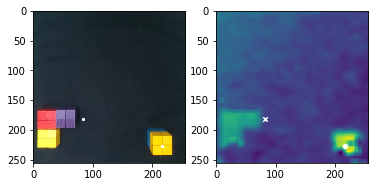

start pix : (216,227,0.704114156625) -> goal pix : (83,181,0.175442297511)
start pixel        goal pixek
x : 216.000000    x : 83.000000
y : 227.000000    y : 181.000000
z : 0.704114    z : 0.175442
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.903887    x : 0.818916
y : 0.155671    y : -0.034489
z : -0.146249    z : -0.188144
x : -0.052814    x : -0.714548
y : 0.962006    y : 0.662251
z : -0.003259    z : 0.139463
w : 0.267851    w : 0.177189


-----------data 206----------


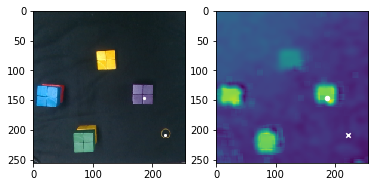

start pix : (186,146,0.802575779587) -> goal pix : (222,209,0.111449594677)
start pixel        goal pixek
x : 186.000000    x : 222.000000
y : 146.000000    y : 209.000000
z : 0.802576    z : 0.111450
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.766539    x : 0.896103
y : 0.100578    y : 0.178396
z : -0.153680    z : -0.193262
x : -0.008348    x : -0.044432
y : 0.998386    y : 0.971027
z : 0.000354    z : 0.048260
w : 0.056169    w : 0.229790


-----------data 207----------


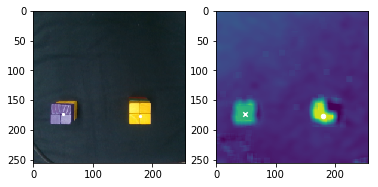

start pix : (179,177,1.13399486805) -> goal pix : (49,173,0.794102667797)
start pixel        goal pixek
x : 179.000000    x : 49.000000
y : 177.000000    y : 173.000000
z : 1.133995    z : 0.794103
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.814680    x : 0.816477
y : 0.081717    y : -0.123335
z : -0.105303    z : -0.103015
x : -0.012558    x : 0.018007
y : 0.995137    y : 0.995585
z : -0.011037    z : -0.009588
w : 0.097071    w : 0.091619


-----------data 208----------


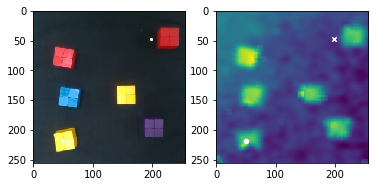

start pix : (50,219,0.482918519479) -> goal pix : (198,47,0.162674654567)
start pixel        goal pixek
x : 50.000000    x : 198.000000
y : 219.000000    y : 47.000000
z : 0.482919    z : 0.162675
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.881097    x : 0.597403
y : -0.112265    y : 0.124919
z : -0.201498    z : -0.186555
x : -0.062815    x : -0.711139
y : 0.994465    y : 0.696627
z : 0.016917    z : 0.019038
w : 0.082504    w : 0.092899


-----------data 209----------


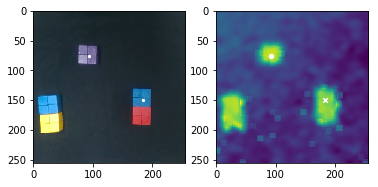

start pix : (93,76,0.474853370734) -> goal pix : (184,150,0.431755031853)
start pixel        goal pixek
x : 93.000000    x : 184.000000
y : 76.000000    y : 150.000000
z : 0.474853    z : 0.431755
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.637051    x : 0.767772
y : -0.059223    y : 0.080045
z : -0.198560    z : -0.142378
x : 0.011128    x : 0.031025
y : 0.995199    y : 0.992563
z : -0.016131    z : -0.024459
w : 0.095888    w : 0.115139


-----------data 210----------


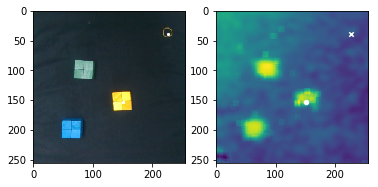

start pix : (151,154,0.386206277989) -> goal pix : (227,38,0.155085551547)
start pixel        goal pixek
x : 151.000000    x : 227.000000
y : 154.000000    y : 38.000000
z : 0.386206    z : 0.155086
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.772236    x : 0.574301
y : 0.046906    y : 0.185523
z : -0.203991    z : -0.191952
x : -0.018264    x : 0.013908
y : 0.991979    y : 0.994675
z : 0.009729    z : 0.032206
w : 0.124697    w : 0.096904


-----------data 211----------


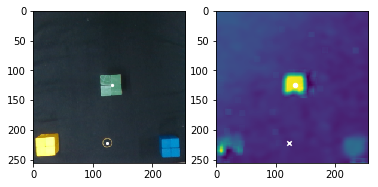

start pix : (132,124,1.15301705186) -> goal pix : (123,223,0.121032354066)
start pixel        goal pixek
x : 132.000000    x : 123.000000
y : 124.000000    y : 223.000000
z : 1.153017    z : 0.121032
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.737321    x : 0.908789
y : 0.017391    y : 0.000249
z : -0.095310    z : -0.193392
x : -0.045856    x : -0.084588
y : 0.993559    y : 0.980840
z : -0.017646    z : -0.001807
w : 0.102109    w : 0.175483


-----------data 212----------


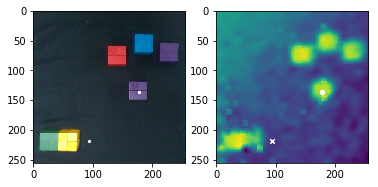

start pix : (178,136,0.470820078181) -> goal pix : (94,218,0.134956084223)
start pixel        goal pixek
x : 178.000000    x : 94.000000
y : 136.000000    y : 218.000000
z : 0.470820    z : 0.134956
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.743209    x : 0.880500
y : 0.103332    y : -0.034562
z : -0.193641    z : -0.188766
x : -0.020832    x : -0.716050
y : 0.993771    y : 0.682375
z : 0.039489    z : 0.021175
w : 0.102103    w : 0.145562


-----------data 213----------


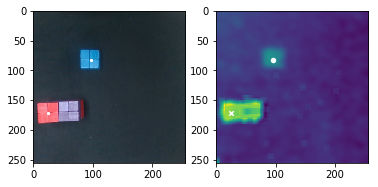

start pix : (96,83,0.49823935247) -> goal pix : (25,172,0.816897768199)
start pixel        goal pixek
x : 96.000000    x : 25.000000
y : 83.000000    y : 172.000000
z : 0.498239    z : 0.816898
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.637763    x : 0.776214
y : -0.047790    y : -0.150111
z : -0.202727    z : -0.104105
x : 0.018042    x : -0.023485
y : 0.996721    y : 0.998106
z : -0.041521    z : -0.011767
w : 0.067069    w : 0.055622


-----------data 214----------


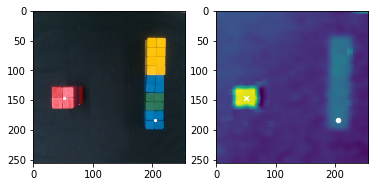

start pix : (205,184,0.455181439207) -> goal pix : (51,147,1.16436600994)
start pixel        goal pixek
x : 205.000000    x : 51.000000
y : 184.000000    y : 147.000000
z : 0.455181    z : 1.164366
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.835414    x : 0.770175
y : 0.157336    y : -0.084731
z : -0.208619    z : -0.047569
x : 0.004000    x : -0.013319
y : 0.983188    y : 0.982985
z : 0.056452    z : -0.015078
w : 0.173604    w : 0.182578


-----------data 215----------


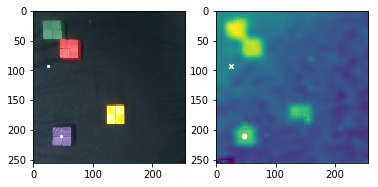

start pix : (47,210,0.462094118089) -> goal pix : (25,93,0.273023284913)
start pixel        goal pixek
x : 47.000000    x : 25.000000
y : 210.000000    y : 93.000000
z : 0.462094    z : 0.273023
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.868707    x : 0.674050
y : -0.130641    y : -0.151467
z : -0.199040    z : -0.187199
x : -0.018162    x : 0.008758
y : 0.986779    y : 0.993485
z : -0.002941    z : 0.013090
w : 0.161027    w : 0.112873


-----------data 216----------


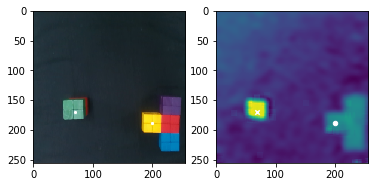

start pix : (200,189,0.449432147344) -> goal pix : (69,170,0.816059653797)
start pixel        goal pixek
x : 200.000000    x : 69.000000
y : 189.000000    y : 170.000000
z : 0.449432    z : 0.816060
o : 2.000000    o : 0.000000


start pose        goal pose
x : 0.841219    x : 0.798758
y : 0.138969    y : -0.085460
z : -0.198091    z : -0.088250
x : -0.668675    x : 0.001163
y : 0.721172    y : 0.987497
z : 0.082246    z : -0.033863
w : 0.161307    w : 0.153952


-----------data 217----------


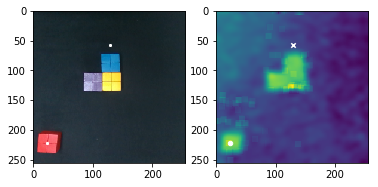

start pix : (23,223,0.553178527675) -> goal pix : (129,57,0.19368486709)
start pixel        goal pixek
x : 23.000000    x : 129.000000
y : 223.000000    y : 57.000000
z : 0.553179    z : 0.193685
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.881298    x : 0.595802
y : -0.146505    y : 0.009512
z : -0.205118    z : -0.202127
x : 0.001932    x : -0.055867
y : 0.983660    y : 0.994638
z : -0.014445    z : -0.011701
w : 0.179446    w : 0.086241


-----------data 218----------


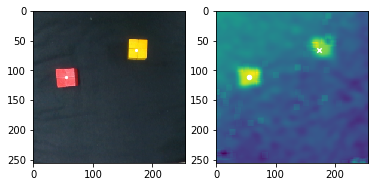

start pix : (55,112,0.556612988047) -> goal pix : (173,66,0.483286004009)
start pixel        goal pixek
x : 55.000000    x : 173.000000
y : 112.000000    y : 66.000000
z : 0.556613    z : 0.483286
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.708852    x : 0.638969
y : -0.111907    y : 0.085867
z : -0.192688    z : -0.137745
x : -0.052394    x : 0.005880
y : 0.990809    y : 0.993208
z : 0.056558    z : 0.032817
w : 0.111147    w : 0.111475


-----------data 219----------


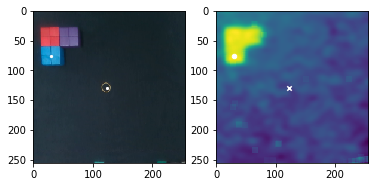

start pix : (30,76,0.489139946749) -> goal pix : (123,129,0.110723426887)
start pixel        goal pixek
x : 30.000000    x : 123.000000
y : 76.000000    y : 129.000000
z : 0.489140    z : 0.110723
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.640243    x : 0.739083
y : -0.171634    y : -0.019513
z : -0.211900    z : -0.211317
x : -0.024772    x : -0.041522
y : 0.997251    y : 0.993339
z : 0.043171    z : -0.004141
w : 0.054883    w : 0.107411


-----------data 220----------


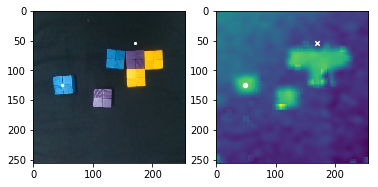

start pix : (48,124,0.501828268406) -> goal pix : (170,54,0.15827208712)
start pixel        goal pixek
x : 48.000000    x : 170.000000
y : 124.000000    y : 54.000000
z : 0.501828    z : 0.158272
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.723295    x : 0.605463
y : -0.116017    y : 0.082438
z : -0.197221    z : -0.187142
x : -0.062373    x : -0.039834
y : 0.996137    y : 0.997403
z : -0.019366    z : -0.005204
w : 0.058698    w : 0.059785


-----------data 221----------


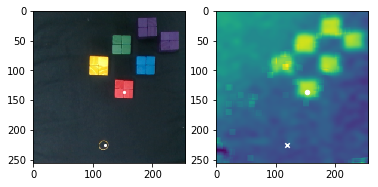

start pix : (153,136,0.484043657801) -> goal pix : (120,226,0.145338192552)
start pixel        goal pixek
x : 153.000000    x : 120.000000
y : 136.000000    y : 226.000000
z : 0.484044    z : 0.145338
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.749655    x : 0.917150
y : 0.052181    y : -0.008772
z : -0.193589    z : -0.191652
x : -0.010572    x : -0.045039
y : 0.993771    y : 0.987179
z : 0.010606    z : 0.020822
w : 0.110431    w : 0.151709




In [6]:
x_array = []
x_ori_array = []
y_array = []
mean_depth = 0
# resume = int(input('where do you want to start from? : '))
resume = 0
for i in range(resume, num_data):
    curr_data = joblib.load(os.path.join(pp_path,data_list[i]))
    print('-----------data {0}----------'.format(i))
    plt.figure(i)
    plt.subplot(121)
    plt.imshow(curr_data['image'])
    plt.scatter(curr_data['start_pix'][0], curr_data['start_pix'][1], s=5, c='w', marker='o')
    plt.scatter(curr_data['goal_pix'][0], curr_data['goal_pix'][1], s=5, c='w', marker='x')
    plt.subplot(122)
    
    curr_data['depth']  = (750 - curr_data['depth'])/750
    curr_data['depth'][np.where(curr_data['depth'] >= 0.5)] = 0
    curr_data['depth'][np.where(curr_data['depth'] < 0)] = 0
    curr_data['depth'] = curr_data['depth']*5
    
    kernel = np.ones((10,10),np.float32)/100
    curr_data['depth'] = cv2.filter2D(curr_data['depth'],-1,kernel)
    plt.imshow(curr_data['depth'])
    mean_depth += curr_data['depth'].mean()
    plt.scatter(curr_data['start_pix'][0], curr_data['start_pix'][1], s=20, c='w', marker='o')
    plt.scatter(curr_data['goal_pix'][0], curr_data['goal_pix'][1], s=20, c='w', marker='x')
    plt.show()
    
    sx = curr_data['start_pix'][0]
    sy = curr_data['start_pix'][1]
    sz = curr_data['depth'][sy,sx]
    gx = curr_data['goal_pix'][0]
    gy = curr_data['goal_pix'][1]
    gz = curr_data['depth'][gy,gx]
    
    x = [sx,sy,sz,gx,gy,gz]
    
    pick_p_x = curr_data['pick'][0].x
    pick_p_y = curr_data['pick'][0].y
    pick_p_z = curr_data['pick'][0].z
    
    pick_o_x = curr_data['pick'][1].x
    pick_o_y = curr_data['pick'][1].y
    pick_o_z = curr_data['pick'][1].z
    pick_o_w = curr_data['pick'][1].w
    
    place_p_x = curr_data['place'][0].x
    place_p_y = curr_data['place'][0].y
    place_p_z = curr_data['place'][0].z
    
    place_o_x = curr_data['place'][1].x
    place_o_y = curr_data['place'][1].y
    place_o_z = curr_data['place'][1].z
    place_o_w = curr_data['place'][1].w
    
    y = [pick_p_x,pick_p_y,pick_p_z,pick_o_x,pick_o_y,pick_o_z, pick_o_w, 
         place_p_x,place_p_y,place_p_z,place_o_x,place_o_y,place_o_z,place_o_w]

    print('start pix : ({0},{1},{2}) -> goal pix : ({3},{4},{5})'.format(sx,sy,sz,gx,gy,gz))
    
#     print(data_list[i])
#     try :
#         pr = curr_data['pick_orientation']
#         while True:
#             key = int(input('pick orientation {0}- pass or not : '.format(pr)))
#             if key == 2 : 
#                 break
#             elif key == 0 or key == 1 :
#                 curr_data['pick_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue

#     except :  
#         while(True):
#             key = int(input('which orientation should I "PICK" this in? horizontal : 0 vertically : 1 - '))
#             if key == 0 or key == 1 :
#                 curr_data['pick_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue
    
#     so = curr_data['pick_orientation']
    
    
#     try :
#         while(True):
#             pr = curr_data['place_orientation']
#             key = int(input('place orienation {0}- pass or not : '.format(pr)))
#             if key == 2 : 
#                 break
#             elif key == 0 or key == 1 :
#                 curr_data['place_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue
        
#     except :  
#         while(True):
#             key = int(input('which orientation should I "PLACE" this in? horizontal : 0 vertically : 1 - '))
#             if key == 0 or key == 1 :
#                 curr_data['place_orientation'] = int(key)
#                 break
#             else : 
#                 print('wrong!')
#                 continue
    so = curr_data['pick_orientation']
    go = curr_data['place_orientation']
    x_ori = [sx,sy,sz,so,gx,gy,gz,go]
    pretty_print_input(x_ori,True)
    pretty_print_out(y)
    
    x_array.append(x)
    x_ori_array.append(x_ori)
    y_array.append(y)
#     joblib.dump(curr_data, os.path.join(pp_path,data_list[i]))
    

In [7]:
mean_depth = mean_depth/len(x_array)

In [8]:
# mean_depth = 733
mean_depth

0.20402640615247683

In [9]:
x_array = np.array(x_array)
x_array[:,0:2] = (np.array(x_array)[:,0:2]-128)/128.0
#x_array[:,2] = (x_array[:,2] - mean_depth)/mean_depth
x_array[:,3:5] = (np.array(x_array)[:,3:5]-128)/128.0
#x_array[:,5] = (x_array[:,5] - mean_depth)/mean_depth

In [10]:
x_ori_array = np.array(x_ori_array)
x_ori_array[:,0:2] = (np.array(x_ori_array)[:,0:2]-128)/128.0
#x_ori_array[:,2] = (x_ori_array[:,2] - mean_depth)/mean_depth
x_ori_array[:,4:6] = (np.array(x_ori_array)[:,4:6]-128)/128.0
#x_ori_array[:,6] = (x_ori_array[:,6] - mean_depth)/mean_depth

In [11]:
pretty_print_input(x_array[0])

start pixel        goal pixek
x : 0.742188    x : 0.281250
y : -0.640625    y : -0.039062
z : 0.790754    z : 0.134433




In [12]:
for i in range(len(x_array)):
    pretty_print_input(x_ori_array[i],True)
    pretty_print_out(y_array[i])

start pixel        goal pixek
x : 0.742188    x : 0.281250
y : -0.640625    y : -0.039062
z : 0.790754    z : 0.134433
o : 0.000000    o : 1.000000


start pose        goal pose
x : 0.609000    x : 0.729854
y : 0.159913    y : 0.080530
z : -0.156211    z : -0.183483
x : 0.031282    x : 0.721345
y : 0.996200    y : 0.687770
z : 0.037584    z : 0.005822
w : 0.072070    w : 0.081240


start pixel        goal pixek
x : -0.617188    x : 0.843750
y : 0.195312    y : 0.093750
z : 0.520419    z : 0.149605
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.767249    x : 0.755721
y : -0.117574    y : 0.192348
z : -0.201861    z : -0.191422
x : 0.036263    x : 0.010296
y : 0.994901    y : 0.996463
z : -0.003497    z : 0.032648
w : 0.094042    w : 0.076748


start pixel        goal pixek
x : 0.109375    x : -0.851562
y : -0.429688    y : 0.625000
z : 0.498037    z : 0.177820
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.624417    x : 0.856450
y : 0.037286    y : -0

start pose        goal pose
x : 0.628595    x : 0.722613
y : -0.093987    y : 0.008838
z : -0.205838    z : -0.151686
x : 0.054840    x : 0.009534
y : 0.996222    y : 0.995212
z : -0.007761    z : 0.048042
w : 0.066886    w : 0.084588


start pixel        goal pixek
x : -0.429688    x : 0.125000
y : 0.445312    y : -0.406250
z : 0.497597    z : 0.214842
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.819153    x : 0.644071
y : -0.081228    y : 0.023925
z : -0.210295    z : -0.193351
x : -0.136122    x : -0.096218
y : 0.985294    y : 0.989943
z : 0.029777    z : -0.037643
w : 0.098893    w : 0.096631


start pixel        goal pixek
x : -0.093750    x : -0.734375
y : 0.179688    y : -0.687500
z : 0.482855    z : 0.280384
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.765094    x : 0.570292
y : -0.006297    y : -0.149676
z : -0.197170    z : -0.187045
x : -0.040524    x : -0.068337
y : 0.993165    y : 0.993896
z : 0.005671    z : -0.011302
w : 0.109310  

start pixel        goal pixek
x : -0.742188    x : 0.273438
y : 0.468750    y : 0.421875
z : 0.494082    z : 0.180377
o : 0.000000    o : 2.000000


start pose        goal pose
x : 0.834568    x : 0.818907
y : -0.152462    y : 0.076002
z : -0.203883    z : -0.203021
x : -0.059489    x : -0.711138
y : 0.981721    y : 0.672993
z : -0.024229    z : 0.114844
w : 0.179160    w : 0.167851


start pixel        goal pixek
x : -0.484375    x : 0.359375
y : 0.320312    y : -0.218750
z : 0.463289    z : 0.819702
o : 1.000000    o : 0.000000


start pose        goal pose
x : 0.780862    x : 0.679974
y : -0.093643    y : 0.083646
z : -0.206378    z : -0.097198
x : 0.701278    x : -0.031300
y : 0.710398    y : 0.998686
z : 0.029808    z : -0.034268
w : 0.051527    w : -0.021732


start pixel        goal pixek
x : -0.031250    x : 0.000000
y : 0.132812    y : -0.781250
z : 0.482832    z : 0.229718
o : 0.000000    o : 0.000000


start pose        goal pose
x : 0.752117    x : 0.578659
y : 0.006084    

In [13]:
x_ori_array[:,3]

array([0., 0., 0., 2., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0., 0., 0., 2.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0., 0., 2., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 2., 0., 0., 2., 2., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 2., 2., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 2., 0., 0., 0., 2., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 2., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 2.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 2., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0., 2., 0., 0.,
       0., 0., 0., 0., 2., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0., 0., 0.,
       0.])

In [14]:
print('x', np.array(x_array).shape)
print('x_ori', np.array(x_ori_array).shape)
print('y', np.array(y_array).shape)

('x', (222, 6))
('x_ori', (222, 8))
('y', (222, 14))


# Model Definition

In [75]:
class Model(object):
    def __init__(self, sess, name, input_size, output_size, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS):
        self.sess = sess
        self.batch_size = BATCH_SIZE
        self.learning_rate = LEARNING_RATE
        self.input = tf.placeholder(tf.float32, [None, input_size])
        self.target = tf.placeholder(tf.float32, [None, output_size])
        self.training = tf.placeholder(tf.bool)
        self.name = name
        if 'ori' in name: 
            with tf.variable_scope(name):
                init = tf.contrib.layers.xavier_initializer()
                if 'ori' in name : HIDDEN_UNITS = 8
                x = tf.layers.dense(self.input, HIDDEN_UNITS, kernel_initializer=init)
                self.output = tf.layers.dense(x, output_size, kernel_initializer=init)
                self.mse_loss = tf.reduce_mean(tf.square(self.target - self.output))
                self.optimize = tf.train.AdamOptimizer(self.learning_rate).minimize(self.mse_loss)
                sess.run(tf.global_variables_initializer())
        else : 
            
            with tf.variable_scope(name):
                init = tf.contrib.layers.xavier_initializer()
                self.output = tf.layers.dense(self.input, output_size, kernel_initializer=init)
                self.mse_loss = tf.reduce_mean(tf.square(self.target - self.output))
                self.optimize = tf.train.AdamOptimizer(self.learning_rate).minimize(self.mse_loss)
                sess.run(tf.global_variables_initializer())
        
    def predict(self,inputs,pick_info = None):

        feed_dict = {self.input : inputs,self.training : False}
        pred_y = self.sess.run(self.output, feed_dict=feed_dict)
        return pred_y

In [20]:
EPOCH = 1000
BATCH_SIZE = 1
# 200 160 20 20 
LEARNING_RATE = 1e-4
HIDDEN_UNITS = 4
TEST = 20
VALID = 20
num_batches = (len(x_array)-VALID-TEST)/BATCH_SIZE
SAVE = 20
print(num_batches)

182


In [21]:
tf.reset_default_graph()
sess = tf.Session()

pick_pose_model = Model(sess,'pick_pose', 2, 2, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
pick_z_model = Model(sess,'pick_z', 1, 1, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
pick_ori_models = []
for i in range(3): 
    pick_ori_model = Model(sess,'pick_ori_'+str(i), 3, 4, BATCH_SIZE, LEARNING_RATE*10, HIDDEN_UNITS)
    pick_ori_models.append(pick_ori_model)
# pick 7 
place_pose_model = Model(sess,'place_pose', 2, 2, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
place_z_model = Model(sess,'place_z', 1, 1, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
place_ori_models = []
for i in range(3): 
    place_ori_model = Model(sess,'place_ori_'+str(i), 3, 4, BATCH_SIZE, LEARNING_RATE*10, HIDDEN_UNITS)
    place_ori_models.append(place_ori_model)

saver = tf.train.Saver(max_to_keep=40)
model_name = '0211-pose-b{0}lr{1}v{2}'.format(BATCH_SIZE,LEARNING_RATE,VALID)

print(model_name)
if not os.path.exists('saved_networks/PickandPlace/'+model_name):
        os.makedirs('saved_networks/PickandPlace/'+model_name)
writer = SummaryWriter('logs/PickandPlace/{0}'.format(model_name))

for e in range(EPOCH):
    loss = np.zeros(6)
    place_loss = 0
    for i in range(num_batches):
        curr_x_batch = np.array(x_ori_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1)].squeeze()
        curr_y_batch = np.array(y_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1)].squeeze()

        # 1
        feed_dict = {pick_pose_model.input: curr_x_batch[0:2].reshape(-1,2),
                     pick_pose_model.target: curr_y_batch[0:2].reshape(-1,2),
                    }
        sess.run(pick_pose_model.optimize, feed_dict=feed_dict)
        loss[0] += sess.run(pick_pose_model.mse_loss,feed_dict=feed_dict)
        # 2
        feed_dict = {pick_z_model.input: curr_x_batch[2].reshape(-1,1),
                     pick_z_model.target: curr_y_batch[2].reshape(-1,1),
                    }
        sess.run(pick_z_model.optimize, feed_dict=feed_dict)
        loss[1] += sess.run(pick_z_model.mse_loss,feed_dict=feed_dict)
        # 3
        pick_ori_model = pick_ori_models[int(curr_x_batch[3])]
        feed_dict = {pick_ori_model.input: curr_x_batch[0:3].reshape(-1,3),
                     pick_ori_model.target: curr_y_batch[3:7].reshape(-1,4),
                    }
        sess.run(pick_ori_model.optimize, feed_dict=feed_dict)
        loss[2] += sess.run(pick_ori_model.mse_loss,feed_dict=feed_dict)
        # 4
        feed_dict = {place_pose_model.input: curr_x_batch[4:6].reshape(-1,2),
                     place_pose_model.target: curr_y_batch[7:9].reshape(-1,2),
                    }
        sess.run(place_pose_model.optimize, feed_dict=feed_dict)
        loss[3] += sess.run(place_pose_model.mse_loss,feed_dict=feed_dict)
        # 5
        feed_dict = {place_z_model.input: curr_x_batch[6].reshape(-1,1),
                     place_z_model.target: curr_y_batch[9].reshape(-1,1),
                    }
        sess.run(place_z_model.optimize, feed_dict=feed_dict)
        loss[4] += sess.run(place_z_model.mse_loss,feed_dict=feed_dict)
        # 6
        place_ori_model = place_ori_models[int(curr_x_batch[7])]
        feed_dict = {place_ori_model.input: curr_x_batch[4:7].reshape(-1,3),
                     place_ori_model.target: curr_y_batch[10:14].reshape(-1,4),
                    }
        sess.run(place_ori_model.optimize, feed_dict=feed_dict)
        loss[5] += sess.run(place_ori_model.mse_loss,feed_dict=feed_dict)

    v_loss = np.zeros(6)

    for j in range(VALID):

        curr_x_batch = np.array(x_ori_array)[BATCH_SIZE*num_batches+j]
        curr_y_batch = np.array(y_array)[BATCH_SIZE*num_batches+j]
        # 1
        feed_dict = {pick_pose_model.input: curr_x_batch[0:2].reshape(-1,2),
                     pick_pose_model.target: curr_y_batch[0:2].reshape(-1,2),
                    }
        v_loss[0] += sess.run(pick_pose_model.mse_loss,feed_dict=feed_dict)
        # 2
        feed_dict = {pick_z_model.input: curr_x_batch[2].reshape(-1,1),
                     pick_z_model.target: curr_y_batch[2].reshape(-1,1),
                    }
        v_loss[1] += sess.run(pick_z_model.mse_loss,feed_dict=feed_dict)
        # 3
        pick_ori_model = pick_ori_models[int(curr_x_batch[3])]
        feed_dict = {pick_ori_model.input: curr_x_batch[0:3].reshape(-1,3),
                     pick_ori_model.target: curr_y_batch[3:7].reshape(-1,4),
                    }
        v_loss[2] += sess.run(pick_ori_model.mse_loss,feed_dict=feed_dict)
        # 4
        feed_dict = {place_pose_model.input: curr_x_batch[4:6].reshape(-1,2),
                     place_pose_model.target: curr_y_batch[7:9].reshape(-1,2),
                    }
        v_loss[3] += sess.run(place_pose_model.mse_loss,feed_dict=feed_dict)
        # 5
        feed_dict = {place_z_model.input: curr_x_batch[6].reshape(-1,1),
                     place_z_model.target: curr_y_batch[9].reshape(-1,1),
                    }
        v_loss[4] += sess.run(place_z_model.mse_loss,feed_dict=feed_dict)
        # 6
        place_ori_model = place_ori_models[int(curr_x_batch[7])]
        feed_dict = {place_ori_model.input: curr_x_batch[4:7].reshape(-1,3),
                     place_ori_model.target: curr_y_batch[10:14].reshape(-1,4),
                    }
        v_loss[5] += sess.run(place_ori_model.mse_loss,feed_dict=feed_dict)


        if e % SAVE == 0:
            print('====== valid test ======')
            print('target')
            valid_y_batch = np.array(y_array)[BATCH_SIZE*num_batches+j]
            pretty_print_out(valid_y_batch)
            print('predict')
            
            valid_x_batch = np.array(x_ori_array)[BATCH_SIZE*num_batches+j]
            
            answer = []
            
            answer.extend(np.squeeze(pick_pose_model.predict(valid_x_batch[0:2].reshape(-1,2))))
            answer.extend(pick_z_model.predict(valid_x_batch[2].reshape(-1,1))[0])
            pick_ori_model = pick_ori_models[int(valid_x_batch[3])]
            answer.extend(pick_ori_model.predict(valid_x_batch[0:3].reshape(-1,3))[0])
            
            answer.extend(place_pose_model.predict(valid_x_batch[4:6].reshape(-1,2))[0])
            answer.extend(place_z_model.predict(valid_x_batch[6].reshape(-1,1))[0])
            place_ori_model = place_ori_models[int(valid_x_batch[7])]
            answer.extend(place_ori_model.predict(valid_x_batch[4:7].reshape(-1,3))[0])
            
            pretty_print_out(answer)
            print('\n')
            
    loss = loss/num_batches
    v_loss = v_loss/VALID

    writer.add_scalars('pick_loss',
                       {'train_pose_loss': loss[0],
                        'train_z_loss': loss[1],
                        'train_ori_loss': loss[2],
                        'valid_pose_loss': v_loss[0],
                        'valid_z_loss': v_loss[1],
                        'valid_ori_loss': v_loss[2]
                       },e)
    writer.add_scalars('place_loss',
                       {'train_pose_loss': loss[3],
                        'train_z_loss': loss[4],
                        'train_ori_loss': loss[5],
                        'valid_pose_loss': v_loss[3],
                        'valid_z_loss': v_loss[4],
                        'valid_ori_loss': v_loss[5]
                       },e)

    if e % SAVE == 0:
        saver.save(sess, 'saved_networks/PickandPlace/' + model_name+'/network-{0}'.format(e))

    #print(model.optimizer.learning_rate())
    print('epoch {0} pick  loss {1}'.format(e,loss))
    print('epoch {0} pick  v_loss {1}'.format(e,v_loss))
    

# pretty_print_out(pick_model.predict(np.array(x_array)[-1,:].reshape(-1,np.array(x_array).shape[-1])))
# pretty_print_out(np.array(y_array)[-1,:])
# test_loss = 0
# print('=========TEST===========')
# for k in range(TEST):

#     print('target')
#     pretty_print_out(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k])
#     print('predict')
#     pick_predict = pick_model.predict(np.array(x_ori_array)[BATCH_SIZE*num_batches+VALID+k,0:4].reshape(-1,4))
#     place_predict = place_model.predict(np.array(x_ori_array)[BATCH_SIZE*num_batches+VALID+k,4:8].reshape(-1,4))
#     pretty_print_out(np.concatenate([pick_predict, place_predict],-1))
#     print('='*50)
#     test_loss += np.mean(np.square(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k]-np.concatenate([pick_predict, place_predict],-1)))

# print('test_loss : {0}'.format(test_loss/TEST))


0211-pose-b1lr0.0001v20
====== valid test ======
target
start pose        goal pose
x : 0.886717    x : 0.887105
y : -0.124999    y : 0.138538
z : -0.204389    z : -0.147382
x : 0.031598    x : 0.026607
y : 0.985394    y : 0.983332
z : 0.017440    z : 0.037175
w : 0.166421    w : 0.175981


predict
start pose        goal pose
x : -0.524650    x : -0.423868
y : -0.011968    y : -0.459013
z : 0.121065    z : 0.154459
x : 0.165981    x : 0.137807
y : 0.756190    y : -0.061809
z : 0.118771    z : -0.323952
w : 0.196059    w : 0.198718




====== valid test ======
target
start pose        goal pose
x : 0.686346    x : 0.733684
y : -0.121651    y : 0.176759
z : -0.204912    z : -0.201539
x : 0.019554    x : -0.008021
y : 0.996497    y : 0.991152
z : -0.020631    z : 0.000618
w : 0.078644    w : 0.132491


predict
start pose        goal pose
x : 0.411212    x : -0.374696
y : -0.268021    y : -0.506951
z : 0.137556    z : 0.048814
x : -0.653441    x : 0.264131
y : 0.493999    y : 0.013104
z : 

====== valid test ======
target
start pose        goal pose
x : 0.735983    x : 0.903185
y : 0.015598    y : -0.083836
z : -0.151184    z : -0.198110
x : -0.014150    x : -0.008960
y : 0.995148    y : 0.990175
z : 0.005898    z : -0.007598
w : 0.097192    w : 0.139341


predict
start pose        goal pose
x : 0.002649    x : 0.104664
y : 0.014118    y : 0.228520
z : 0.179287    z : 0.053607
x : -0.238039    x : -0.255351
y : 0.763530    y : 0.362394
z : -0.003336    z : -0.409486
w : 0.203737    w : -0.199105




====== valid test ======
target
start pose        goal pose
x : 0.738794    x : 0.897251
y : 0.009062    y : -0.159171
z : 0.001125    z : -0.197381
x : -0.031622    x : -0.033067
y : 0.996430    y : 0.990121
z : -0.000760    z : 0.018807
w : 0.078274    w : 0.134958


predict
start pose        goal pose
x : 0.021870    x : 0.262582
y : -0.011839    y : 0.426726
z : 0.510344    z : 0.051575
x : -1.057329    x : -0.342376
y : 1.549536    y : 0.515877
z : 0.238163    z : -0.3838

epoch 20 pick  loss [0.24852014 0.00052048 0.00480145 0.17069725 0.00318945 0.01150389]
epoch 20 pick  v_loss [0.27068771 0.00054101 0.00102681 0.17951691 0.00501035 0.00228436]
epoch 21 pick  loss [0.24003417 0.00035531 0.00455427 0.16229665 0.00262156 0.0113845 ]
epoch 21 pick  v_loss [0.26148515 0.00046261 0.000899   0.17069185 0.00429389 0.00217818]
epoch 22 pick  loss [0.23178957 0.00025809 0.00433272 0.1541919  0.00220194 0.01127739]
epoch 22 pick  v_loss [0.25253059 0.00042919 0.00081121 0.16218476 0.00373885 0.00208719]
epoch 23 pick  loss [2.23781044e-01 2.03752818e-04 4.13196797e-03 1.46377195e-01
 1.89692891e-03 1.11796616e-02]
epoch 23 pick  v_loss [0.24381929 0.00041961 0.0007521  0.15398904 0.00331071 0.00200839]
epoch 24 pick  loss [2.16003044e-01 1.74840706e-04 3.94828687e-03 1.38846807e-01
 1.67763453e-03 1.10892102e-02]
epoch 24 pick  v_loss [0.23534594 0.00042037 0.00071299 0.14609799 0.00297985 0.00193943]
epoch 25 pick  loss [2.08450537e-01 1.60026208e-04 3.7787909

epoch 40 pick  loss [0.1188941  0.00012272 0.00216804 0.05264801 0.0006691  0.01008129]
epoch 40 pick  v_loss [0.12842913 0.00031697 0.00066085 0.0561878  0.00107901 0.00141162]
epoch 41 pick  loss [0.11430436 0.0001208  0.00210116 0.049127   0.00062781 0.01003472]
epoch 41 pick  v_loss [0.12332648 0.00030681 0.00066321 0.05252073 0.00100357 0.0013953 ]
epoch 42 pick  loss [0.10986496 0.00011894 0.00203783 0.04579134 0.00058822 0.00998958]
epoch 42 pick  v_loss [0.11838767 0.00029678 0.00066548 0.04904448 0.00093113 0.00137999]
epoch 43 pick  loss [0.10557231 0.00011713 0.00197786 0.04263484 0.00055046 0.00994583]
epoch 43 pick  v_loss [0.11360916 0.00028691 0.00066762 0.04575212 0.00086185 0.00136563]
epoch 44 pick  loss [0.10142281 0.00011539 0.00192107 0.03965136 0.00051461 0.00990342]
epoch 44 pick  v_loss [0.10898747 0.00027727 0.0006696  0.04263701 0.00079589 0.00135216]
epoch 45 pick  loss [0.09741291 0.00011373 0.00186729 0.03683459 0.00048076 0.00986231]
epoch 45 pick  v_loss 

epoch 60 pick  loss [5.16233671e-02 9.92104205e-05 1.32898794e-03 1.03386903e-02
 2.05693831e-04 9.37706129e-03]
epoch 60 pick  v_loss [0.05354229 0.00017029 0.00067301 0.01149121 0.0001976  0.00122378]
epoch 61 pick  loss [4.93727086e-02 9.88138292e-05 1.30612566e-03 9.35761447e-03
 1.99744759e-04 9.35202451e-03]
epoch 61 pick  v_loss [0.05105688 0.00016655 0.00067199 0.01040939 0.00018383 0.00121965]
epoch 62 pick  loss [4.72039622e-02 9.84630913e-05 1.28441832e-03 8.44627907e-03
 1.94751760e-04 9.32774404e-03]
epoch 62 pick  v_loss [0.04866655 0.00016308 0.00067088 0.00940023 0.00017187 0.00121582]
epoch 63 pick  loss [4.51141366e-02 9.81539615e-05 1.26380405e-03 7.60083212e-03
 1.90601402e-04 9.30419587e-03]
epoch 63 pick  v_loss [0.04636816 0.00015986 0.00066968 0.00846027 0.00016154 0.00121229]
epoch 64 pick  loss [4.31003373e-02 9.78822672e-05 1.24422307e-03 6.81771275e-03
 1.87184971e-04 9.28135607e-03]
epoch 64 pick  v_loss [0.04415849 0.00015689 0.0006684  0.00758633 0.000152

epoch 80 pick  loss [1.92146677e-02 9.62759823e-05 1.03412762e-03 6.06289500e-04
 1.74334664e-04 8.99656195e-03]
epoch 80 pick  v_loss [0.01862347 0.00013106 0.00064148 0.00060693 0.00010677 0.001181  ]
epoch 81 pick  loss [1.81411200e-02 9.62550929e-05 1.02564913e-03 4.99218570e-04
 1.74297196e-04 8.98298469e-03]
epoch 81 pick  v_loss [0.01752089 0.0001303  0.00063965 0.00049202 0.00010627 0.00118018]
epoch 82 pick  loss [1.71077046e-02 9.62373202e-05 1.01755570e-03 4.11828663e-04
 1.74269560e-04 8.96982190e-03]
epoch 82 pick  v_loss [0.01646471 0.0001296  0.00063782 0.00039953 0.00010584 0.00117942]
epoch 83 pick  loss [1.61132838e-02 9.62224258e-05 1.00982720e-03 3.41752745e-04
 1.74249317e-04 8.95706491e-03]
epoch 83 pick  v_loss [0.01545343 0.00012896 0.00063599 0.00032658 0.00010549 0.00117872]
epoch 84 pick  loss [1.51568332e-02 9.62100966e-05 1.00244419e-03 2.86656507e-04
 1.74234494e-04 8.94470122e-03]
epoch 84 pick  v_loss [0.01448557 0.00012836 0.00063417 0.00027036 0.000105

epoch 100 pick  loss [4.38657435e-03 9.61574186e-05 9.19086638e-04 1.42115392e-04
 1.74194149e-04 8.79226818e-03]
epoch 100 pick  v_loss [0.00397041 0.00012323 0.00060736 0.00013794 0.00010359 0.00117227]
epoch 101 pick  loss [3.96614386e-03 9.61574256e-05 9.15468704e-04 1.42145996e-04
 1.74194079e-04 8.78511486e-03]
epoch 101 pick  v_loss [0.00357683 0.00012308 0.00060586 0.00013794 0.00010357 0.00117208]
epoch 102 pick  loss [3.57230075e-03 9.61575206e-05 9.11986741e-04 1.42177987e-04
 1.74194025e-04 8.77819028e-03]
epoch 102 pick  v_loss [0.00320958 0.00012294 0.00060439 0.00013795 0.00010355 0.0011719 ]
epoch 103 pick  loss [3.20450387e-03 9.61576659e-05 9.08634658e-04 1.42208995e-04
 1.74194032e-04 8.77149045e-03]
epoch 103 pick  v_loss [0.00286794 0.00012281 0.00060294 0.00013794 0.00010354 0.00117174]
epoch 104 pick  loss [2.86219081e-03 9.61578928e-05 9.05406423e-04 1.42237514e-04
 1.74193943e-04 8.76500402e-03]
epoch 104 pick  v_loss [0.00255117 0.00012269 0.00060151 0.0001379

epoch 120 pick  loss [2.39717201e-04 9.61625149e-05 8.66894916e-04 1.42411877e-04
 1.74193734e-04 8.68528446e-03]
epoch 120 pick  v_loss [0.00017793 0.00012165 0.00058176 0.00013792 0.00010346 0.00116996]
epoch 121 pick  loss [2.04041397e-04 9.61626372e-05 8.65129782e-04 1.42413792e-04
 1.74193742e-04 8.68152291e-03]
epoch 121 pick  v_loss [0.00014679 0.00012162 0.00058071 0.00013792 0.00010346 0.00116989]
epoch 122 pick  loss [1.76276522e-04 9.61629033e-05 8.63423656e-04 1.42415820e-04
 1.74193720e-04 8.67787664e-03]
epoch 122 pick  v_loss [0.00012256 0.00012159 0.00057968 0.00013792 0.00010346 0.00116983]
epoch 123 pick  loss [1.55175547e-04 9.61631589e-05 8.61774569e-04 1.42417076e-04
 1.74193732e-04 8.67434286e-03]
epoch 123 pick  v_loss [0.00010411 0.00012156 0.00057866 0.00013792 0.00010346 0.00116977]
epoch 124 pick  loss [1.39556138e-04 9.61632840e-05 8.60180184e-04 1.42418134e-04
 1.74193757e-04 8.67091652e-03]
epoch 124 pick  v_loss [9.03882139e-05 1.21538010e-04 5.77673509e-

epoch 140 pick  loss [1.07162155e-04 9.61648950e-05 8.40767988e-04 1.42423629e-04
 1.74193701e-04 8.62808064e-03]
epoch 140 pick  v_loss [5.92567548e-05 1.21325647e-04 5.64254047e-04 1.37918140e-04
 1.03452684e-04 1.16892383e-03]
epoch 141 pick  loss [1.07176352e-04 9.61649522e-05 8.39864080e-04 1.42423718e-04
 1.74193689e-04 8.62601497e-03]
epoch 141 pick  v_loss [5.92520162e-05 1.21319267e-04 5.63553547e-04 1.37918137e-04
 1.03452800e-04 1.16888440e-03]
epoch 142 pick  loss [1.07189180e-04 9.61650020e-05 8.38989737e-04 1.42423740e-04
 1.74193702e-04 8.62400786e-03]
epoch 142 pick  v_loss [5.92501203e-05 1.21313409e-04 5.62866038e-04 1.37918077e-04
 1.03452684e-04 1.16884517e-03]
epoch 143 pick  loss [1.07200371e-04 9.61650705e-05 8.38143740e-04 1.42423713e-04
 1.74193689e-04 8.62205463e-03]
epoch 143 pick  v_loss [5.92500124e-05 1.21307857e-04 5.62192995e-04 1.37918043e-04
 1.03452800e-04 1.16880627e-03]
epoch 144 pick  loss [1.07210249e-04 9.61650614e-05 8.37325098e-04 1.42423773e-0

epoch 160 pick  loss [1.07264063e-04 9.61654375e-05 8.27299995e-04 1.42423950e-04
 1.74193702e-04 8.59593328e-03]
epoch 160 pick  v_loss [5.92597015e-05 1.21262293e-04 5.52634916e-04 1.37918287e-04
 1.03452684e-04 1.16820084e-03]
epoch 161 pick  loss [1.07264580e-04 9.61654248e-05 8.26830495e-04 1.42423939e-04
 1.74193689e-04 8.59473426e-03]
epoch 161 pick  v_loss [5.92599603e-05 1.21261005e-04 5.52168058e-04 1.37918287e-04
 1.03452800e-04 1.16816902e-03]
epoch 162 pick  loss [1.07265125e-04 9.61654220e-05 8.26375381e-04 1.42423935e-04
 1.74193702e-04 8.59356469e-03]
epoch 162 pick  v_loss [5.92600900e-05 1.21260019e-04 5.51710017e-04 1.37918287e-04
 1.03452684e-04 1.16813536e-03]
epoch 163 pick  loss [1.07265495e-04 9.61654379e-05 8.25934657e-04 1.42423935e-04
 1.74193689e-04 8.59242445e-03]
epoch 163 pick  v_loss [5.92601038e-05 1.21258738e-04 5.51261265e-04 1.37918287e-04
 1.03452800e-04 1.16810356e-03]
epoch 164 pick  loss [1.07265817e-04 9.61654574e-05 8.25508031e-04 1.42423929e-0

epoch 180 pick  loss [1.07267348e-04 9.61654749e-05 8.20227227e-04 1.42423925e-04
 1.74193702e-04 8.57671590e-03]
epoch 180 pick  v_loss [5.92604021e-05 1.21245196e-04 5.44751729e-04 1.37918287e-04
 1.03452684e-04 1.16754892e-03]
epoch 181 pick  loss [1.07267387e-04 9.61654765e-05 8.19975488e-04 1.42423923e-04
 1.74193689e-04 8.57596814e-03]
epoch 181 pick  v_loss [5.92603612e-05 1.21244725e-04 5.44423600e-04 1.37918287e-04
 1.03452800e-04 1.16751687e-03]
epoch 182 pick  loss [1.07267407e-04 9.61655065e-05 8.19731437e-04 1.42423925e-04
 1.74193702e-04 8.57523474e-03]
epoch 182 pick  v_loss [5.92603858e-05 1.21244269e-04 5.44099903e-04 1.37918287e-04
 1.03452684e-04 1.16748340e-03]
epoch 183 pick  loss [1.07267407e-04 9.61655121e-05 8.19494193e-04 1.42423923e-04
 1.74193689e-04 8.57451852e-03]
epoch 183 pick  v_loss [5.92603109e-05 1.21244010e-04 5.43781967e-04 1.37918287e-04
 1.03452800e-04 1.16744964e-03]
epoch 184 pick  loss [1.07267395e-04 9.61655055e-05 8.19263817e-04 1.42423925e-0

epoch 200 pick  loss [1.07267489e-04 9.61655428e-05 8.16336138e-04 1.42423925e-04
 1.74193702e-04 8.56424039e-03]
epoch 200 pick  v_loss [5.92604270e-05 1.21241796e-04 5.38945393e-04 1.37918287e-04
 1.03452684e-04 1.16685019e-03]
epoch 201 pick  loss [1.07267495e-04 9.61655206e-05 8.16191027e-04 1.42423923e-04
 1.74193689e-04 8.56372821e-03]
epoch 201 pick  v_loss [5.92604104e-05 1.21241837e-04 5.38687271e-04 1.37918287e-04
 1.03452800e-04 1.16681402e-03]
epoch 202 pick  loss [1.07267495e-04 9.61655356e-05 8.16049384e-04 1.42423925e-04
 1.74193702e-04 8.56322403e-03]
epoch 202 pick  v_loss [5.92604270e-05 1.21241769e-04 5.38432200e-04 1.37918287e-04
 1.03452684e-04 1.16677506e-03]
epoch 203 pick  loss [1.07267495e-04 9.61655414e-05 8.15911335e-04 1.42423923e-04
 1.74193689e-04 8.56272813e-03]
epoch 203 pick  v_loss [5.92604104e-05 1.21241654e-04 5.38178594e-04 1.37918287e-04
 1.03452800e-04 1.16673879e-03]
epoch 204 pick  loss [1.07267495e-04 9.61655287e-05 8.15776292e-04 1.42423925e-0

epoch 220 pick  loss [1.07267499e-04 9.61655287e-05 8.13968794e-04 1.42423925e-04
 1.74193702e-04 8.55533315e-03]
epoch 220 pick  v_loss [5.92604065e-05 1.21241654e-04 5.34124291e-04 1.37918287e-04
 1.03452684e-04 1.16606365e-03]
epoch 221 pick  loss [1.07267496e-04 9.61655287e-05 8.13873233e-04 1.42423923e-04
 1.74193689e-04 8.55495012e-03]
epoch 221 pick  v_loss [5.92603899e-05 1.21241654e-04 5.33896396e-04 1.37918287e-04
 1.03452800e-04 1.16602257e-03]
epoch 222 pick  loss [1.07267499e-04 9.61655287e-05 8.13779003e-04 1.42423925e-04
 1.74193702e-04 8.55456946e-03]
epoch 222 pick  v_loss [5.92604065e-05 1.21241654e-04 5.33669904e-04 1.37918287e-04
 1.03452684e-04 1.16598203e-03]
epoch 223 pick  loss [1.07267496e-04 9.61655287e-05 8.13686473e-04 1.42423923e-04
 1.74193689e-04 8.55419537e-03]
epoch 223 pick  v_loss [5.92603899e-05 1.21241654e-04 5.33443976e-04 1.37918287e-04
 1.03452800e-04 1.16593980e-03]
epoch 224 pick  loss [1.07267499e-04 9.61655287e-05 8.13594955e-04 1.42423925e-0

epoch 240 pick  loss [1.07267499e-04 9.61655287e-05 8.12285474e-04 1.42423925e-04
 1.74193702e-04 8.54840963e-03]
epoch 240 pick  v_loss [5.92604065e-05 1.21241654e-04 5.29685580e-04 1.37918287e-04
 1.03452684e-04 1.16521208e-03]
epoch 241 pick  loss [1.07267496e-04 9.61655287e-05 8.12210868e-04 1.42423923e-04
 1.74193689e-04 8.54809853e-03]
epoch 241 pick  v_loss [5.92603899e-05 1.21241654e-04 5.29468146e-04 1.37918287e-04
 1.03452800e-04 1.16516792e-03]
epoch 242 pick  loss [1.07267499e-04 9.61655287e-05 8.12136568e-04 1.42423925e-04
 1.74193702e-04 8.54779079e-03]
epoch 242 pick  v_loss [5.92604065e-05 1.21241654e-04 5.29250112e-04 1.37918287e-04
 1.03452684e-04 1.16512308e-03]
epoch 243 pick  loss [1.07267496e-04 9.61655287e-05 8.12063050e-04 1.42423923e-04
 1.74193689e-04 8.54748533e-03]
epoch 243 pick  v_loss [5.92603899e-05 1.21241654e-04 5.29032700e-04 1.37918287e-04
 1.03452800e-04 1.16507952e-03]
epoch 244 pick  loss [1.07267499e-04 9.61655287e-05 8.11990016e-04 1.42423925e-0

epoch 260 pick  loss [1.07267499e-04 9.61655287e-05 8.10876447e-04 1.42423925e-04
 1.74193702e-04 8.54266114e-03]
epoch 260 pick  v_loss [5.92604065e-05 1.21241654e-04 5.25356817e-04 1.37918287e-04
 1.03452684e-04 1.16432345e-03]
epoch 261 pick  loss [1.07267496e-04 9.61655287e-05 8.10809308e-04 1.42423923e-04
 1.74193689e-04 8.54239461e-03]
epoch 261 pick  v_loss [5.92603899e-05 1.21241654e-04 5.25141371e-04 1.37918287e-04
 1.03452800e-04 1.16427824e-03]
epoch 262 pick  loss [1.07267499e-04 9.61655287e-05 8.10742389e-04 1.42423925e-04
 1.74193702e-04 8.54213166e-03]
epoch 262 pick  v_loss [5.92604065e-05 1.21241654e-04 5.24926337e-04 1.37918287e-04
 1.03452684e-04 1.16423399e-03]
epoch 263 pick  loss [1.07267496e-04 9.61655287e-05 8.10675429e-04 1.42423923e-04
 1.74193689e-04 8.54187042e-03]
epoch 263 pick  v_loss [5.92603899e-05 1.21241654e-04 5.24710423e-04 1.37918287e-04
 1.03452800e-04 1.16418776e-03]
epoch 264 pick  loss [1.07267499e-04 9.61655287e-05 8.10608870e-04 1.42423925e-0

epoch 280 pick  loss [1.07267499e-04 9.61655287e-05 8.09555034e-04 1.42423925e-04
 1.74193702e-04 8.53765518e-03]
epoch 280 pick  v_loss [5.92604065e-05 1.21241654e-04 5.21064186e-04 1.37918287e-04
 1.03452684e-04 1.16341441e-03]
epoch 281 pick  loss [1.07267496e-04 9.61655287e-05 8.09489581e-04 1.42423923e-04
 1.74193689e-04 8.53741928e-03]
epoch 281 pick  v_loss [5.92603899e-05 1.21241654e-04 5.20850710e-04 1.37918287e-04
 1.03452800e-04 1.16336879e-03]
epoch 282 pick  loss [1.07267499e-04 9.61655287e-05 8.09424287e-04 1.42423925e-04
 1.74193702e-04 8.53718416e-03]
epoch 282 pick  v_loss [5.92604065e-05 1.21241654e-04 5.20637440e-04 1.37918287e-04
 1.03452684e-04 1.16332325e-03]
epoch 283 pick  loss [1.07267496e-04 9.61655287e-05 8.09358800e-04 1.42423923e-04
 1.74193689e-04 8.53695129e-03]
epoch 283 pick  v_loss [5.92603899e-05 1.21241654e-04 5.20424675e-04 1.37918287e-04
 1.03452800e-04 1.16327679e-03]
epoch 284 pick  loss [1.07267499e-04 9.61655287e-05 8.09293385e-04 1.42423925e-0

epoch 300 pick  loss [1.07267499e-04 9.61655287e-05 8.08245751e-04 1.42423925e-04
 1.74193702e-04 8.53313527e-03]
epoch 300 pick  v_loss [5.92604065e-05 1.21241654e-04 5.16843996e-04 1.37918287e-04
 1.03452684e-04 1.16248153e-03]
epoch 301 pick  loss [1.07267496e-04 9.61655287e-05 8.08179946e-04 1.42423923e-04
 1.74193689e-04 8.53291726e-03]
epoch 301 pick  v_loss [5.92603899e-05 1.21241654e-04 5.16636111e-04 1.37918287e-04
 1.03452800e-04 1.16243375e-03]
epoch 302 pick  loss [1.07267499e-04 9.61655287e-05 8.08114241e-04 1.42423925e-04
 1.74193702e-04 8.53270356e-03]
epoch 302 pick  v_loss [5.92604065e-05 1.21241654e-04 5.16429038e-04 1.37918287e-04
 1.03452684e-04 1.16238711e-03]
epoch 303 pick  loss [1.07267496e-04 9.61655287e-05 8.08048720e-04 1.42423923e-04
 1.74193689e-04 8.53248757e-03]
epoch 303 pick  v_loss [5.92603899e-05 1.21241654e-04 5.16222508e-04 1.37918287e-04
 1.03452800e-04 1.16233903e-03]
epoch 304 pick  loss [1.07267499e-04 9.61655287e-05 8.07982721e-04 1.42423925e-0

epoch 320 pick  loss [1.07267499e-04 9.61655287e-05 8.06928007e-04 1.42423925e-04
 1.74193702e-04 8.52893060e-03]
epoch 320 pick  v_loss [5.92604065e-05 1.21241654e-04 5.12792972e-04 1.37918287e-04
 1.03452684e-04 1.16149944e-03]
epoch 321 pick  loss [1.07267496e-04 9.61655287e-05 8.06862135e-04 1.42423923e-04
 1.74193689e-04 8.52872604e-03]
epoch 321 pick  v_loss [5.92603899e-05 1.21241654e-04 5.12597124e-04 1.37918287e-04
 1.03452800e-04 1.16144980e-03]
epoch 322 pick  loss [1.07267499e-04 9.61655287e-05 8.06795981e-04 1.42423925e-04
 1.74193702e-04 8.52852261e-03]
epoch 322 pick  v_loss [5.92604065e-05 1.21241654e-04 5.12402425e-04 1.37918287e-04
 1.03452684e-04 1.16139796e-03]
epoch 323 pick  loss [1.07267496e-04 9.61655287e-05 8.06729987e-04 1.42423923e-04
 1.74193689e-04 8.52831942e-03]
epoch 323 pick  v_loss [5.92603899e-05 1.21241654e-04 5.12208045e-04 1.37918287e-04
 1.03452800e-04 1.16134690e-03]
epoch 324 pick  loss [1.07267499e-04 9.61655287e-05 8.06663907e-04 1.42423925e-0

====== valid test ======
target
start pose        goal pose
x : 0.735983    x : 0.903185
y : 0.015598    y : -0.083836
z : -0.151184    z : -0.198110
x : -0.014150    x : -0.008960
y : 0.995148    y : 0.990175
z : 0.005898    z : -0.007598
w : 0.097192    w : 0.139341


predict
start pose        goal pose
x : 0.733209    x : 0.894354
y : 0.019354    y : -0.083746
z : -0.176415    z : -0.196310
x : -0.006812    x : -0.013833
y : 0.992311    y : 0.958560
z : -0.001372    z : -0.008063
w : 0.110659    w : 0.140582




====== valid test ======
target
start pose        goal pose
x : 0.738794    x : 0.897251
y : 0.009062    y : -0.159171
z : 0.001125    z : -0.197381
x : -0.031622    x : -0.033067
y : 0.996430    y : 0.990121
z : -0.000760    z : 0.018807
w : 0.078274    w : 0.134958


predict
start pose        goal pose
x : 0.734089    x : 0.889573
y : 0.001457    y : -0.146690
z : -0.026332    z : -0.196948
x : -0.008814    x : -0.016334
y : 0.993624    y : 0.963333
z : -0.010829    z : -0

epoch 360 pick  loss [1.07267499e-04 9.61655287e-05 8.04307409e-04 1.42423925e-04
 1.74193702e-04 8.52101060e-03]
epoch 360 pick  v_loss [5.92604065e-05 1.21241654e-04 5.05753167e-04 1.37918287e-04
 1.03452684e-04 1.15924392e-03]
epoch 361 pick  loss [1.07267496e-04 9.61655287e-05 8.04243159e-04 1.42423923e-04
 1.74193689e-04 8.52081733e-03]
epoch 361 pick  v_loss [5.92603899e-05 1.21241654e-04 5.05602586e-04 1.37918287e-04
 1.03452800e-04 1.15917921e-03]
epoch 362 pick  loss [1.07267499e-04 9.61655287e-05 8.04179001e-04 1.42423925e-04
 1.74193702e-04 8.52062465e-03]
epoch 362 pick  v_loss [5.92604065e-05 1.21241654e-04 5.05453054e-04 1.37918287e-04
 1.03452684e-04 1.15911500e-03]
epoch 363 pick  loss [1.07267496e-04 9.61655287e-05 8.04114778e-04 1.42423923e-04
 1.74193689e-04 8.52043113e-03]
epoch 363 pick  v_loss [5.92603899e-05 1.21241654e-04 5.05305197e-04 1.37918287e-04
 1.03452800e-04 1.15905039e-03]
epoch 364 pick  loss [1.07267499e-04 9.61655287e-05 8.04050894e-04 1.42423925e-0

epoch 380 pick  loss [1.07267499e-04 9.61655287e-05 8.03042056e-04 1.42423925e-04
 1.74193702e-04 8.51716583e-03]
epoch 380 pick  v_loss [5.92604065e-05 1.21241654e-04 5.03005217e-04 1.37918287e-04
 1.03452684e-04 1.15787058e-03]
epoch 381 pick  loss [1.07267496e-04 9.61655287e-05 8.02980018e-04 1.42423923e-04
 1.74193689e-04 8.51697825e-03]
epoch 381 pick  v_loss [5.92603899e-05 1.21241654e-04 5.02882006e-04 1.37918287e-04
 1.03452800e-04 1.15779783e-03]
epoch 382 pick  loss [1.07267499e-04 9.61655287e-05 8.02917926e-04 1.42423925e-04
 1.74193702e-04 8.51678661e-03]
epoch 382 pick  v_loss [5.92604065e-05 1.21241654e-04 5.02760785e-04 1.37918287e-04
 1.03452684e-04 1.15772177e-03]
epoch 383 pick  loss [1.07267496e-04 9.61655287e-05 8.02856111e-04 1.42423923e-04
 1.74193689e-04 8.51659782e-03]
epoch 383 pick  v_loss [5.92603899e-05 1.21241654e-04 5.02640713e-04 1.37918287e-04
 1.03452800e-04 1.15764819e-03]
epoch 384 pick  loss [1.07267499e-04 9.61655287e-05 8.02794362e-04 1.42423925e-0

epoch 400 pick  loss [1.07267499e-04 9.61655287e-05 8.01823657e-04 1.42423925e-04
 1.74193702e-04 8.51345920e-03]
epoch 400 pick  v_loss [5.92604065e-05 1.21241654e-04 5.00789290e-04 1.37918287e-04
 1.03452684e-04 1.15630607e-03]
epoch 401 pick  loss [1.07267496e-04 9.61655287e-05 8.01764102e-04 1.42423923e-04
 1.74193689e-04 8.51328126e-03]
epoch 401 pick  v_loss [5.92603899e-05 1.21241654e-04 5.00691033e-04 1.37918287e-04
 1.03452800e-04 1.15622424e-03]
epoch 402 pick  loss [1.07267499e-04 9.61655287e-05 8.01704651e-04 1.42423925e-04
 1.74193702e-04 8.51310524e-03]
epoch 402 pick  v_loss [5.92604065e-05 1.21241654e-04 5.00593567e-04 1.37918287e-04
 1.03452684e-04 1.15614311e-03]
epoch 403 pick  loss [1.07267496e-04 9.61655287e-05 8.01645227e-04 1.42423923e-04
 1.74193689e-04 8.51292934e-03]
epoch 403 pick  v_loss [5.92603899e-05 1.21241654e-04 5.00497379e-04 1.37918287e-04
 1.03452800e-04 1.15606077e-03]
epoch 404 pick  loss [1.07267499e-04 9.61655287e-05 8.01585945e-04 1.42423925e-0

epoch 420 pick  loss [1.07267499e-04 9.61655287e-05 8.00652948e-04 1.42423925e-04
 1.74193702e-04 8.51019157e-03]
epoch 420 pick  v_loss [5.92604065e-05 1.21241654e-04 4.99015676e-04 1.37918287e-04
 1.03452684e-04 1.15476749e-03]
epoch 421 pick  loss [1.07267496e-04 9.61655287e-05 8.00595567e-04 1.42423923e-04
 1.74193689e-04 8.51004791e-03]
epoch 421 pick  v_loss [5.92603899e-05 1.21241654e-04 4.98937246e-04 1.37918287e-04
 1.03452800e-04 1.15470077e-03]
epoch 422 pick  loss [1.07267499e-04 9.61655287e-05 8.00538309e-04 1.42423925e-04
 1.74193702e-04 8.50990700e-03]
epoch 422 pick  v_loss [5.92604065e-05 1.21241654e-04 4.98859974e-04 1.37918287e-04
 1.03452684e-04 1.15463669e-03]
epoch 423 pick  loss [1.07267496e-04 9.61655287e-05 8.00481018e-04 1.42423923e-04
 1.74193689e-04 8.50976867e-03]
epoch 423 pick  v_loss [5.92603899e-05 1.21241654e-04 4.98783177e-04 1.37918287e-04
 1.03452800e-04 1.15457399e-03]
epoch 424 pick  loss [1.07267499e-04 9.61655287e-05 8.00423910e-04 1.42423925e-0

epoch 440 pick  loss [1.07267499e-04 9.61655287e-05 7.99522484e-04 1.42423925e-04
 1.74193702e-04 8.50774943e-03]
epoch 440 pick  v_loss [5.92604065e-05 1.21241654e-04 4.97614492e-04 1.37918287e-04
 1.03452684e-04 1.15379207e-03]
epoch 441 pick  loss [1.07267496e-04 9.61655287e-05 7.99466832e-04 1.42423923e-04
 1.74193689e-04 8.50764922e-03]
epoch 441 pick  v_loss [5.92603899e-05 1.21241654e-04 4.97553082e-04 1.37918287e-04
 1.03452800e-04 1.15376018e-03]
epoch 442 pick  loss [1.07267499e-04 9.61655287e-05 7.99411131e-04 1.42423925e-04
 1.74193702e-04 8.50754993e-03]
epoch 442 pick  v_loss [5.92604065e-05 1.21241654e-04 4.97492663e-04 1.37918287e-04
 1.03452684e-04 1.15373259e-03]
epoch 443 pick  loss [1.07267496e-04 9.61655287e-05 7.99355708e-04 1.42423923e-04
 1.74193689e-04 8.50745337e-03]
epoch 443 pick  v_loss [5.92603899e-05 1.21241654e-04 4.97432761e-04 1.37918287e-04
 1.03452800e-04 1.15370423e-03]
epoch 444 pick  loss [1.07267499e-04 9.61655287e-05 7.99300182e-04 1.42423925e-0

epoch 460 pick  loss [1.07267499e-04 9.61655287e-05 7.98421142e-04 1.42423925e-04
 1.74193702e-04 8.50596801e-03]
epoch 460 pick  v_loss [5.92604065e-05 1.21241654e-04 4.96517839e-04 1.37918287e-04
 1.03452684e-04 1.15335809e-03]
epoch 461 pick  loss [1.07267496e-04 9.61655287e-05 7.98366586e-04 1.42423923e-04
 1.74193689e-04 8.50588815e-03]
epoch 461 pick  v_loss [5.92603899e-05 1.21241654e-04 4.96468931e-04 1.37918287e-04
 1.03452800e-04 1.15334116e-03]
epoch 462 pick  loss [1.07267499e-04 9.61655287e-05 7.98312229e-04 1.42423925e-04
 1.74193702e-04 8.50580762e-03]
epoch 462 pick  v_loss [5.92604065e-05 1.21241654e-04 4.96420707e-04 1.37918287e-04
 1.03452684e-04 1.15332433e-03]
epoch 463 pick  loss [1.07267496e-04 9.61655287e-05 7.98257826e-04 1.42423923e-04
 1.74193689e-04 8.50572785e-03]
epoch 463 pick  v_loss [5.92603899e-05 1.21241654e-04 4.96372962e-04 1.37918287e-04
 1.03452800e-04 1.15330610e-03]
epoch 464 pick  loss [1.07267499e-04 9.61655287e-05 7.98203454e-04 1.42423925e-0

epoch 480 pick  loss [1.07267499e-04 9.61655287e-05 7.97338732e-04 1.42423925e-04
 1.74193702e-04 8.50441958e-03]
epoch 480 pick  v_loss [5.92604065e-05 1.21241654e-04 4.95619142e-04 1.37918287e-04
 1.03452684e-04 1.15298150e-03]
epoch 481 pick  loss [1.07267496e-04 9.61655287e-05 7.97285016e-04 1.42423923e-04
 1.74193689e-04 8.50434261e-03]
epoch 481 pick  v_loss [5.92603899e-05 1.21241654e-04 4.95577671e-04 1.37918287e-04
 1.03452800e-04 1.15295870e-03]
epoch 482 pick  loss [1.07267499e-04 9.61655287e-05 7.97231307e-04 1.42423925e-04
 1.74193702e-04 8.50426757e-03]
epoch 482 pick  v_loss [5.92604065e-05 1.21241654e-04 4.95536073e-04 1.37918287e-04
 1.03452684e-04 1.15293720e-03]
epoch 483 pick  loss [1.07267496e-04 9.61655287e-05 7.97177554e-04 1.42423923e-04
 1.74193689e-04 8.50419130e-03]
epoch 483 pick  v_loss [5.92603899e-05 1.21241654e-04 4.95494639e-04 1.37918287e-04
 1.03452800e-04 1.15291438e-03]
epoch 484 pick  loss [1.07267499e-04 9.61655287e-05 7.97123884e-04 1.42423925e-0

epoch 500 pick  loss [1.07267499e-04 9.61655287e-05 7.96268817e-04 1.42423925e-04
 1.74193702e-04 8.50290056e-03]
epoch 500 pick  v_loss [5.92604065e-05 1.21241654e-04 4.94812925e-04 1.37918287e-04
 1.03452684e-04 1.15248545e-03]
epoch 501 pick  loss [1.07267496e-04 9.61655287e-05 7.96215620e-04 1.42423923e-04
 1.74193689e-04 8.50282445e-03]
epoch 501 pick  v_loss [5.92603899e-05 1.21241654e-04 4.94773525e-04 1.37918287e-04
 1.03452800e-04 1.15245812e-03]
epoch 502 pick  loss [1.07267499e-04 9.61655287e-05 7.96162376e-04 1.42423925e-04
 1.74193702e-04 8.50274814e-03]
epoch 502 pick  v_loss [5.92604065e-05 1.21241654e-04 4.94734320e-04 1.37918287e-04
 1.03452684e-04 1.15242985e-03]
epoch 503 pick  loss [1.07267496e-04 9.61655287e-05 7.96109187e-04 1.42423923e-04
 1.74193689e-04 8.50267055e-03]
epoch 503 pick  v_loss [5.92603899e-05 1.21241654e-04 4.94695080e-04 1.37918287e-04
 1.03452800e-04 1.15240255e-03]
epoch 504 pick  loss [1.07267499e-04 9.61655287e-05 7.96056116e-04 1.42423925e-0

epoch 520 pick  loss [1.07267499e-04 9.61655287e-05 7.95207863e-04 1.42423925e-04
 1.74193702e-04 8.50134131e-03]
epoch 520 pick  v_loss [5.92604065e-05 1.21241654e-04 4.94025097e-04 1.37918287e-04
 1.03452684e-04 1.15188753e-03]
epoch 521 pick  loss [1.07267496e-04 9.61655287e-05 7.95155096e-04 1.42423923e-04
 1.74193689e-04 8.50126270e-03]
epoch 521 pick  v_loss [5.92603899e-05 1.21241654e-04 4.93985661e-04 1.37918287e-04
 1.03452800e-04 1.15185634e-03]
epoch 522 pick  loss [1.07267499e-04 9.61655287e-05 7.95102150e-04 1.42423925e-04
 1.74193702e-04 8.50118237e-03]
epoch 522 pick  v_loss [5.92604065e-05 1.21241654e-04 4.93945784e-04 1.37918287e-04
 1.03452684e-04 1.15182411e-03]
epoch 523 pick  loss [1.07267496e-04 9.61655287e-05 7.95049281e-04 1.42423923e-04
 1.74193689e-04 8.50110233e-03]
epoch 523 pick  v_loss [5.92603899e-05 1.21241654e-04 4.93906011e-04 1.37918287e-04
 1.03452800e-04 1.15179174e-03]
epoch 524 pick  loss [1.07267499e-04 9.61655287e-05 7.94996529e-04 1.42423925e-0

epoch 540 pick  loss [1.07267499e-04 9.61655287e-05 7.94151030e-04 1.42423925e-04
 1.74193702e-04 8.49970907e-03]
epoch 540 pick  v_loss [5.92604065e-05 1.21241654e-04 4.93228163e-04 1.37918287e-04
 1.03452684e-04 1.15123414e-03]
epoch 541 pick  loss [1.07267496e-04 9.61655287e-05 7.94098085e-04 1.42423923e-04
 1.74193689e-04 8.49962525e-03]
epoch 541 pick  v_loss [5.92603899e-05 1.21241654e-04 4.93188347e-04 1.37918287e-04
 1.03452800e-04 1.15120122e-03]
epoch 542 pick  loss [1.07267499e-04 9.61655287e-05 7.94045179e-04 1.42423925e-04
 1.74193702e-04 8.49954016e-03]
epoch 542 pick  v_loss [5.92604065e-05 1.21241654e-04 4.93147998e-04 1.37918287e-04
 1.03452684e-04 1.15116849e-03]
epoch 543 pick  loss [1.07267496e-04 9.61655287e-05 7.93992351e-04 1.42423923e-04
 1.74193689e-04 8.49945740e-03]
epoch 543 pick  v_loss [5.92603899e-05 1.21241654e-04 4.93107845e-04 1.37918287e-04
 1.03452800e-04 1.15113500e-03]
epoch 544 pick  loss [1.07267499e-04 9.61655287e-05 7.93939414e-04 1.42423925e-0

epoch 560 pick  loss [1.07267499e-04 9.61655287e-05 7.93088079e-04 1.42423925e-04
 1.74193702e-04 8.49797998e-03]
epoch 560 pick  v_loss [5.92604065e-05 1.21241654e-04 4.92428859e-04 1.37918287e-04
 1.03452684e-04 1.15057480e-03]
epoch 561 pick  loss [1.07267496e-04 9.61655287e-05 7.93034576e-04 1.42423923e-04
 1.74193689e-04 8.49789056e-03]
epoch 561 pick  v_loss [5.92603899e-05 1.21241654e-04 4.92389479e-04 1.37918287e-04
 1.03452800e-04 1.15054286e-03]
epoch 562 pick  loss [1.07267499e-04 9.61655287e-05 7.92980843e-04 1.42423925e-04
 1.74193702e-04 8.49780140e-03]
epoch 562 pick  v_loss [5.92604065e-05 1.21241654e-04 4.92350182e-04 1.37918287e-04
 1.03452684e-04 1.15051007e-03]
epoch 563 pick  loss [1.07267496e-04 9.61655287e-05 7.92927188e-04 1.42423923e-04
 1.74193689e-04 8.49771187e-03]
epoch 563 pick  v_loss [5.92603899e-05 1.21241654e-04 4.92310617e-04 1.37918287e-04
 1.03452800e-04 1.15047796e-03]
epoch 564 pick  loss [1.07267499e-04 9.61655287e-05 7.92873371e-04 1.42423925e-0

epoch 580 pick  loss [1.07267499e-04 9.61655287e-05 7.91998073e-04 1.42423925e-04
 1.74193702e-04 8.49614341e-03]
epoch 580 pick  v_loss [5.92604065e-05 1.21241654e-04 4.91655050e-04 1.37918287e-04
 1.03452684e-04 1.14996135e-03]
epoch 581 pick  loss [1.07267496e-04 9.61655287e-05 7.91942029e-04 1.42423923e-04
 1.74193689e-04 8.49604779e-03]
epoch 581 pick  v_loss [5.92603899e-05 1.21241654e-04 4.91617569e-04 1.37918287e-04
 1.03452800e-04 1.14993286e-03]
epoch 582 pick  loss [1.07267499e-04 9.61655287e-05 7.91885976e-04 1.42423925e-04
 1.74193702e-04 8.49595178e-03]
epoch 582 pick  v_loss [5.92604065e-05 1.21241654e-04 4.91580483e-04 1.37918287e-04
 1.03452684e-04 1.14990453e-03]
epoch 583 pick  loss [1.07267496e-04 9.61655287e-05 7.91829693e-04 1.42423923e-04
 1.74193689e-04 8.49585714e-03]
epoch 583 pick  v_loss [5.92603899e-05 1.21241654e-04 4.91543939e-04 1.37918287e-04
 1.03452800e-04 1.14987771e-03]
epoch 584 pick  loss [1.07267499e-04 9.61655287e-05 7.91773161e-04 1.42423925e-0

epoch 600 pick  loss [1.07267499e-04 9.61655287e-05 7.90833776e-04 1.42423925e-04
 1.74193702e-04 8.49418819e-03]
epoch 600 pick  v_loss [5.92604065e-05 1.21241654e-04 4.90955533e-04 1.37918287e-04
 1.03452684e-04 1.14947266e-03]
epoch 601 pick  loss [1.07267496e-04 9.61655287e-05 7.90772814e-04 1.42423923e-04
 1.74193689e-04 8.49408750e-03]
epoch 601 pick  v_loss [5.92603899e-05 1.21241654e-04 4.90923256e-04 1.37918287e-04
 1.03452800e-04 1.14945415e-03]
epoch 602 pick  loss [1.07267499e-04 9.61655287e-05 7.90711779e-04 1.42423925e-04
 1.74193702e-04 8.49398685e-03]
epoch 602 pick  v_loss [5.92604065e-05 1.21241654e-04 4.90890934e-04 1.37918287e-04
 1.03452684e-04 1.14943509e-03]
epoch 603 pick  loss [1.07267496e-04 9.61655287e-05 7.90650484e-04 1.42423923e-04
 1.74193689e-04 8.49388352e-03]
epoch 603 pick  v_loss [5.92603899e-05 1.21241654e-04 4.90858541e-04 1.37918287e-04
 1.03452800e-04 1.14941618e-03]
epoch 604 pick  loss [1.07267499e-04 9.61655287e-05 7.90589325e-04 1.42423925e-0

epoch 620 pick  loss [1.07267499e-04 9.61655287e-05 7.89717918e-04 1.42423925e-04
 1.74193702e-04 8.49212038e-03]
epoch 620 pick  v_loss [5.92604065e-05 1.21241654e-04 4.90231009e-04 1.37918287e-04
 1.03452684e-04 1.14922627e-03]
epoch 621 pick  loss [1.07267496e-04 9.61655287e-05 7.89664344e-04 1.42423923e-04
 1.74193689e-04 8.49201420e-03]
epoch 621 pick  v_loss [5.92603899e-05 1.21241654e-04 4.90177202e-04 1.37918287e-04
 1.03452800e-04 1.14922274e-03]
epoch 622 pick  loss [1.07267499e-04 9.61655287e-05 7.89635830e-04 1.42423925e-04
 1.74193702e-04 8.49190767e-03]
epoch 622 pick  v_loss [5.92604065e-05 1.21241654e-04 4.90131096e-04 1.37918287e-04
 1.03452684e-04 1.14921921e-03]
epoch 623 pick  loss [1.07267496e-04 9.61655287e-05 7.89586279e-04 1.42423923e-04
 1.74193689e-04 8.49180214e-03]
epoch 623 pick  v_loss [5.92603899e-05 1.21241654e-04 4.90101468e-04 1.37918287e-04
 1.03452800e-04 1.14921888e-03]
epoch 624 pick  loss [1.07267499e-04 9.61655287e-05 7.89539742e-04 1.42423925e-0

epoch 640 pick  loss [1.07267499e-04 9.61655287e-05 7.88813485e-04 1.42423925e-04
 1.74193702e-04 8.48997656e-03]
epoch 640 pick  v_loss [5.92604065e-05 1.21241654e-04 4.89332805e-04 1.37918287e-04
 1.03452684e-04 1.14935965e-03]
epoch 641 pick  loss [1.07267496e-04 9.61655287e-05 7.88819805e-04 1.42423923e-04
 1.74193689e-04 8.48986913e-03]
epoch 641 pick  v_loss [5.92603899e-05 1.21241654e-04 4.89329080e-04 1.37918287e-04
 1.03452800e-04 1.14937743e-03]
epoch 642 pick  loss [1.07267499e-04 9.61655287e-05 7.88756321e-04 1.42423925e-04
 1.74193702e-04 8.48976192e-03]
epoch 642 pick  v_loss [5.92604065e-05 1.21241654e-04 4.89312451e-04 1.37918287e-04
 1.03452684e-04 1.14939606e-03]
epoch 643 pick  loss [1.07267496e-04 9.61655287e-05 7.88680370e-04 1.42423923e-04
 1.74193689e-04 8.48965427e-03]
epoch 643 pick  v_loss [5.92603899e-05 1.21241654e-04 4.89203895e-04 1.37918287e-04
 1.03452800e-04 1.14941516e-03]
epoch 644 pick  loss [1.07267499e-04 9.61655287e-05 7.88694004e-04 1.42423925e-0

epoch 660 pick  loss [1.07267499e-04 9.61655287e-05 7.87982798e-04 1.42423925e-04
 1.74193702e-04 8.48785702e-03]
epoch 660 pick  v_loss [5.92604065e-05 1.21241654e-04 4.88564340e-04 1.37918287e-04
 1.03452684e-04 1.14971873e-03]
epoch 661 pick  loss [1.07267496e-04 9.61655287e-05 7.87913946e-04 1.42423923e-04
 1.74193689e-04 8.48775167e-03]
epoch 661 pick  v_loss [5.92603899e-05 1.21241654e-04 4.88520730e-04 1.37918287e-04
 1.03452800e-04 1.14972421e-03]
epoch 662 pick  loss [1.07267499e-04 9.61655287e-05 7.87854011e-04 1.42423925e-04
 1.74193702e-04 8.48764813e-03]
epoch 662 pick  v_loss [5.92604065e-05 1.21241654e-04 4.88471118e-04 1.37918287e-04
 1.03452684e-04 1.14972553e-03]
epoch 663 pick  loss [1.07267496e-04 9.61655287e-05 7.87806033e-04 1.42423923e-04
 1.74193689e-04 8.48754448e-03]
epoch 663 pick  v_loss [5.92603899e-05 1.21241654e-04 4.88413212e-04 1.37918287e-04
 1.03452800e-04 1.14972552e-03]
epoch 664 pick  loss [1.07267499e-04 9.61655287e-05 7.87790098e-04 1.42423925e-0

epoch 680 pick  loss [1.07267499e-04 9.61655287e-05 7.87123950e-04 1.42423925e-04
 1.74193702e-04 8.48580558e-03]
epoch 680 pick  v_loss [5.92604065e-05 1.21241654e-04 4.87782105e-04 1.37918287e-04
 1.03452684e-04 1.14951502e-03]
epoch 681 pick  loss [1.07267496e-04 9.61655287e-05 7.87038443e-04 1.42423923e-04
 1.74193689e-04 8.48570474e-03]
epoch 681 pick  v_loss [5.92603899e-05 1.21241654e-04 4.87694848e-04 1.37918287e-04
 1.03452800e-04 1.14950300e-03]
epoch 682 pick  loss [1.07267499e-04 9.61655287e-05 7.86988587e-04 1.42423925e-04
 1.74193702e-04 8.48560480e-03]
epoch 682 pick  v_loss [5.92604065e-05 1.21241654e-04 4.87637204e-04 1.37918287e-04
 1.03452684e-04 1.14949199e-03]
epoch 683 pick  loss [1.07267496e-04 9.61655287e-05 7.86954120e-04 1.42423923e-04
 1.74193689e-04 8.48550557e-03]
epoch 683 pick  v_loss [5.92603899e-05 1.21241654e-04 4.87583483e-04 1.37918287e-04
 1.03452800e-04 1.14948342e-03]
epoch 684 pick  loss [1.07267499e-04 9.61655287e-05 7.86930456e-04 1.42423925e-0

epoch 700 pick  loss [1.07267499e-04 9.61655287e-05 7.86251355e-04 1.42423925e-04
 1.74193702e-04 8.48380165e-03]
epoch 700 pick  v_loss [5.92604065e-05 1.21241654e-04 4.86927088e-04 1.37918287e-04
 1.03452684e-04 1.14947275e-03]
epoch 701 pick  loss [1.07267496e-04 9.61655287e-05 7.86191014e-04 1.42423923e-04
 1.74193689e-04 8.48370030e-03]
epoch 701 pick  v_loss [5.92603899e-05 1.21241654e-04 4.86888652e-04 1.37918287e-04
 1.03452800e-04 1.14948215e-03]
epoch 702 pick  loss [1.07267499e-04 9.61655287e-05 7.86135790e-04 1.42423925e-04
 1.74193702e-04 8.48359900e-03]
epoch 702 pick  v_loss [5.92604065e-05 1.21241654e-04 4.86845081e-04 1.37918287e-04
 1.03452684e-04 1.14949142e-03]
epoch 703 pick  loss [1.07267496e-04 9.61655287e-05 7.86090967e-04 1.42423923e-04
 1.74193689e-04 8.48349595e-03]
epoch 703 pick  v_loss [5.92603899e-05 1.21241654e-04 4.86774605e-04 1.37918287e-04
 1.03452800e-04 1.14950046e-03]
epoch 704 pick  loss [1.07267499e-04 9.61655287e-05 7.86083978e-04 1.42423925e-0

epoch 720 pick  loss [1.07267499e-04 9.61655287e-05 7.85482364e-04 1.42423925e-04
 1.74193702e-04 8.48172489e-03]
epoch 720 pick  v_loss [5.92604065e-05 1.21241654e-04 4.86183354e-04 1.37918287e-04
 1.03452684e-04 1.14986792e-03]
epoch 721 pick  loss [1.07267496e-04 9.61655287e-05 7.85377807e-04 1.42423923e-04
 1.74193689e-04 8.48161666e-03]
epoch 721 pick  v_loss [5.92603899e-05 1.21241654e-04 4.86100493e-04 1.37918287e-04
 1.03452800e-04 1.14990342e-03]
epoch 722 pick  loss [1.07267499e-04 9.61655287e-05 7.85309719e-04 1.42423925e-04
 1.74193702e-04 8.48151012e-03]
epoch 722 pick  v_loss [5.92604065e-05 1.21241654e-04 4.86025990e-04 1.37918287e-04
 1.03452684e-04 1.14994148e-03]
epoch 723 pick  loss [1.07267496e-04 9.61655287e-05 7.85272561e-04 1.42423923e-04
 1.74193689e-04 8.48140250e-03]
epoch 723 pick  v_loss [5.92603899e-05 1.21241654e-04 4.85972294e-04 1.37918287e-04
 1.03452800e-04 1.14998132e-03]
epoch 724 pick  loss [1.07267499e-04 9.61655287e-05 7.85244638e-04 1.42423925e-0

epoch 740 pick  loss [1.07267499e-04 9.61655287e-05 7.84613810e-04 1.42423925e-04
 1.74193702e-04 8.48656294e-03]
epoch 740 pick  v_loss [5.92604065e-05 1.21241654e-04 4.85320222e-04 1.37918287e-04
 1.03452684e-04 1.15286689e-03]
epoch 741 pick  loss [1.07267496e-04 9.61655287e-05 7.84553292e-04 1.42423923e-04
 1.74193689e-04 8.47961908e-03]
epoch 741 pick  v_loss [5.92603899e-05 1.21241654e-04 4.85289451e-04 1.37918287e-04
 1.03452800e-04 1.15302245e-03]
epoch 742 pick  loss [1.07267499e-04 9.61655287e-05 7.84496427e-04 1.42423925e-04
 1.74193702e-04 8.47941495e-03]
epoch 742 pick  v_loss [5.92604065e-05 1.21241654e-04 4.85246261e-04 1.37918287e-04
 1.03452684e-04 1.15255721e-03]
epoch 743 pick  loss [1.07267496e-04 9.61655287e-05 7.84449880e-04 1.42423923e-04
 1.74193689e-04 8.47929429e-03]
epoch 743 pick  v_loss [5.92603899e-05 1.21241654e-04 4.85185463e-04 1.37918287e-04
 1.03452800e-04 1.15228215e-03]
epoch 744 pick  loss [1.07267499e-04 9.61655287e-05 7.84425342e-04 1.42423925e-0

epoch 760 pick  loss [1.07267499e-04 9.61655287e-05 7.83869481e-04 1.42423925e-04
 1.74193702e-04 8.47759710e-03]
epoch 760 pick  v_loss [5.92604065e-05 1.21241654e-04 4.84435863e-04 1.37918287e-04
 1.03452684e-04 1.15241842e-03]
epoch 761 pick  loss [1.07267496e-04 9.61655287e-05 7.83819178e-04 1.42423923e-04
 1.74193689e-04 8.47750773e-03]
epoch 761 pick  v_loss [5.92603899e-05 1.21241654e-04 4.84510805e-04 1.37918287e-04
 1.03452800e-04 1.15250493e-03]
epoch 762 pick  loss [1.07267499e-04 9.61655287e-05 7.83734607e-04 1.42423925e-04
 1.74193702e-04 8.47742302e-03]
epoch 762 pick  v_loss [5.92604065e-05 1.21241654e-04 4.84449794e-04 1.37918287e-04
 1.03452684e-04 1.15258686e-03]
epoch 763 pick  loss [1.07267496e-04 9.61655287e-05 7.83671654e-04 1.42423923e-04
 1.74193689e-04 8.47733389e-03]
epoch 763 pick  v_loss [5.92603899e-05 1.21241654e-04 4.84372986e-04 1.37918287e-04
 1.03452800e-04 1.15264727e-03]
epoch 764 pick  loss [1.07267499e-04 9.61655287e-05 7.83643693e-04 1.42423925e-0

epoch 780 pick  loss [1.07267499e-04 9.61655287e-05 7.83050404e-04 1.42423925e-04
 1.74193702e-04 8.47579980e-03]
epoch 780 pick  v_loss [5.92604065e-05 1.21241654e-04 4.83716606e-04 1.37918287e-04
 1.03452684e-04 1.15306410e-03]
epoch 781 pick  loss [1.07267496e-04 9.61655287e-05 7.82992308e-04 1.42423923e-04
 1.74193689e-04 8.47571181e-03]
epoch 781 pick  v_loss [5.92603899e-05 1.21241654e-04 4.83676316e-04 1.37918287e-04
 1.03452800e-04 1.15308514e-03]
epoch 782 pick  loss [1.07267499e-04 9.61655287e-05 7.82945042e-04 1.42423925e-04
 1.74193702e-04 8.47561175e-03]
epoch 782 pick  v_loss [5.92604065e-05 1.21241654e-04 4.83617792e-04 1.37918287e-04
 1.03452684e-04 1.15304337e-03]
epoch 783 pick  loss [1.07267496e-04 9.61655287e-05 7.82918517e-04 1.42423923e-04
 1.74193689e-04 8.47548316e-03]
epoch 783 pick  v_loss [5.92603899e-05 1.21241654e-04 4.83541819e-04 1.37918287e-04
 1.03452800e-04 1.15331256e-03]
epoch 784 pick  loss [1.07267499e-04 9.61655287e-05 7.82912837e-04 1.42423925e-0

epoch 800 pick  loss [1.07267499e-04 9.61655287e-05 7.82354915e-04 1.42423925e-04
 1.74193702e-04 8.47400743e-03]
epoch 800 pick  v_loss [5.92604065e-05 1.21241654e-04 4.82859702e-04 1.37918287e-04
 1.03452684e-04 1.15289961e-03]
epoch 801 pick  loss [1.07267496e-04 9.61655287e-05 7.82309525e-04 1.42423923e-04
 1.74193689e-04 8.47391231e-03]
epoch 801 pick  v_loss [5.92603899e-05 1.21241654e-04 4.82885596e-04 1.37918287e-04
 1.03452800e-04 1.15290071e-03]
epoch 802 pick  loss [1.07267499e-04 9.61655287e-05 7.82245315e-04 1.42423925e-04
 1.74193702e-04 8.47381968e-03]
epoch 802 pick  v_loss [5.92604065e-05 1.21241654e-04 4.82856980e-04 1.37918287e-04
 1.03452684e-04 1.15290586e-03]
epoch 803 pick  loss [1.07267496e-04 9.61655287e-05 7.82189169e-04 1.42423923e-04
 1.74193689e-04 8.47372461e-03]
epoch 803 pick  v_loss [5.92603899e-05 1.21241654e-04 4.82795480e-04 1.37918287e-04
 1.03452800e-04 1.15290523e-03]
epoch 804 pick  loss [1.07267499e-04 9.61655287e-05 7.82162389e-04 1.42423925e-0

epoch 820 pick  loss [1.07267499e-04 9.61655287e-05 7.81735278e-04 1.42423925e-04
 1.74193702e-04 8.47148756e-03]
epoch 820 pick  v_loss [5.92604065e-05 1.21241654e-04 4.81923641e-04 1.37918287e-04
 1.03452684e-04 1.15523314e-03]
epoch 821 pick  loss [1.07267496e-04 9.61655287e-05 7.81717878e-04 1.42423923e-04
 1.74193689e-04 8.48483454e-03]
epoch 821 pick  v_loss [5.92603899e-05 1.21241654e-04 4.82269423e-04 1.37918287e-04
 1.03452800e-04 1.15338378e-03]
epoch 822 pick  loss [1.07267499e-04 9.61655287e-05 7.81597806e-04 1.42423925e-04
 1.74193702e-04 8.47354735e-03]
epoch 822 pick  v_loss [5.92604065e-05 1.21241654e-04 4.82145421e-04 1.37918287e-04
 1.03452684e-04 1.15357204e-03]
epoch 823 pick  loss [1.07267496e-04 9.61655287e-05 7.81512852e-04 1.42423923e-04
 1.74193689e-04 8.47215650e-03]
epoch 823 pick  v_loss [5.92603899e-05 1.21241654e-04 4.82111461e-04 1.37918287e-04
 1.03452800e-04 1.15339424e-03]
epoch 824 pick  loss [1.07267499e-04 9.61655287e-05 7.81478609e-04 1.42423925e-0

epoch 840 pick  loss [1.07267499e-04 9.61655287e-05 7.80962824e-04 1.42423925e-04
 1.74193702e-04 8.47513771e-03]
epoch 840 pick  v_loss [5.92604065e-05 1.21241654e-04 4.81660244e-04 1.37918287e-04
 1.03452684e-04 1.15319317e-03]
epoch 841 pick  loss [1.07267496e-04 9.61655287e-05 7.80934292e-04 1.42423923e-04
 1.74193689e-04 8.47227226e-03]
epoch 841 pick  v_loss [5.92603899e-05 1.21241654e-04 4.81643747e-04 1.37918287e-04
 1.03452800e-04 1.15390726e-03]
epoch 842 pick  loss [1.07267499e-04 9.61655287e-05 7.80901031e-04 1.42423925e-04
 1.74193702e-04 8.47110306e-03]
epoch 842 pick  v_loss [5.92604065e-05 1.21241654e-04 4.81615939e-04 1.37918287e-04
 1.03452684e-04 1.15412824e-03]
epoch 843 pick  loss [1.07267496e-04 9.61655287e-05 7.80872003e-04 1.42423923e-04
 1.74193689e-04 8.47055153e-03]
epoch 843 pick  v_loss [5.92603899e-05 1.21241654e-04 4.81461255e-04 1.37918287e-04
 1.03452800e-04 1.15409126e-03]
epoch 844 pick  loss [1.07267499e-04 9.61655287e-05 7.80936001e-04 1.42423925e-0

epoch 860 pick  loss [1.07267499e-04 9.61655287e-05 7.80365658e-04 1.42423925e-04
 1.74193702e-04 8.46839628e-03]
epoch 860 pick  v_loss [5.92604065e-05 1.21241654e-04 4.81335150e-04 1.37918287e-04
 1.03452684e-04 1.15200158e-03]
epoch 861 pick  loss [1.07267496e-04 9.61655287e-05 7.80336284e-04 1.42423923e-04
 1.74193689e-04 8.46828005e-03]
epoch 861 pick  v_loss [5.92603899e-05 1.21241654e-04 4.81321324e-04 1.37918287e-04
 1.03452800e-04 1.15203102e-03]
epoch 862 pick  loss [1.07267499e-04 9.61655287e-05 7.80308845e-04 1.42423925e-04
 1.74193702e-04 8.46581258e-03]
epoch 862 pick  v_loss [5.92604065e-05 1.21241654e-04 4.81312009e-04 1.37918287e-04
 1.03452684e-04 1.14958587e-03]
epoch 863 pick  loss [1.07267496e-04 9.61655287e-05 7.80278790e-04 1.42423923e-04
 1.74193689e-04 8.49209243e-03]
epoch 863 pick  v_loss [5.92603899e-05 1.21241654e-04 4.81291964e-04 1.37918287e-04
 1.03452800e-04 1.14976235e-03]
epoch 864 pick  loss [1.07267499e-04 9.61655287e-05 7.80259911e-04 1.42423925e-0

epoch 880 pick  loss [1.07267499e-04 9.61655287e-05 7.79819637e-04 1.42423925e-04
 1.74193702e-04 8.46650062e-03]
epoch 880 pick  v_loss [5.92604065e-05 1.21241654e-04 4.81145088e-04 1.37918287e-04
 1.03452684e-04 1.15138346e-03]
epoch 881 pick  loss [1.07267496e-04 9.61655287e-05 7.79830789e-04 1.42423923e-04
 1.74193689e-04 8.46638580e-03]
epoch 881 pick  v_loss [5.92603899e-05 1.21241654e-04 4.81080913e-04 1.37918287e-04
 1.03452800e-04 1.15131267e-03]
epoch 882 pick  loss [1.07267499e-04 9.61655287e-05 7.79871007e-04 1.42423925e-04
 1.74193702e-04 8.46627441e-03]
epoch 882 pick  v_loss [5.92604065e-05 1.21241654e-04 4.80876600e-04 1.37918287e-04
 1.03452684e-04 1.15125529e-03]
epoch 883 pick  loss [1.07267496e-04 9.61655287e-05 7.79871132e-04 1.42423923e-04
 1.74193689e-04 8.46616363e-03]
epoch 883 pick  v_loss [5.92603899e-05 1.21241654e-04 4.81309965e-04 1.37918287e-04
 1.03452800e-04 1.15120735e-03]
epoch 884 pick  loss [1.07267499e-04 9.61655287e-05 7.79763651e-04 1.42423925e-0

KeyboardInterrupt: 

In [ ]:
# saver = tf.train.Saver(max_to_keep=40)
# model_name = 'allsep-bs{0},lr{1},Valid{2}'.format(BATCH_SIZE,LEARNING_RATE,VALID)

# print(model_name)
# if not os.path.exists('saved_networks/PickandPlace'+model_name):
#         os.makedirs('saved_networks/PickandPlace'+model_name)
# writer = SummaryWriter('logs/PickandPlace/{0}'.format(model_name))

# for e in range(EPOCH):
#     loss = np.zeros(6)
#     place_loss = 0
#     for i in range(num_batches):
#         curr_x_batch = np.array(x_ori_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1)].squeeze()
#         curr_y_batch = np.array(y_array)[BATCH_SIZE*i:BATCH_SIZE*(i+1)].squeeze()
        
        
#         # 1
#         feed_dict = {pick_pose_model.input: curr_x_batch[0:2].reshape(-1,2),
#                      pick_pose_model.target: curr_y_batch[0:2].reshape(-1,2),
#                     }
#         sess.run(pick_pose_model.optimize, feed_dict=feed_dict)
#         loss[0] += sess.run(pick_pose_model.mse_loss,feed_dict=feed_dict)
#         # 2
#         feed_dict = {pick_z_model.input: curr_x_batch[2].reshape(-1,1),
#                      pick_z_model.target: curr_y_batch[2].reshape(-1,1),
#                     }
#         sess.run(pick_z_model.optimize, feed_dict=feed_dict)
#         loss[1] += sess.run(pick_z_model.mse_loss,feed_dict=feed_dict)
#         # 3
#         feed_dict = {pick_ori_model.input: curr_x_batch[0:4].reshape(-1,4),
#                      pick_ori_model.target: curr_y_batch[3:7].reshape(-1,4),
#                     }
#         sess.run(pick_ori_model.optimize, feed_dict=feed_dict)
#         loss[2] += sess.run(pick_ori_model.mse_loss,feed_dict=feed_dict)
#         # 4
#         feed_dict = {place_pose_model.input: curr_x_batch[4:6].reshape(-1,2),
#                      place_pose_model.target: curr_y_batch[8:10].reshape(-1,2),
#                      place_pose_model.pick_info : curr_y_batch[0:7].reshape(-1,7)
#                     }
#         sess.run(place_pose_model.optimize, feed_dict=feed_dict)
#         loss[3] += sess.run(place_pose_model.mse_loss,feed_dict=feed_dict)
#         # 5
#         feed_dict = {place_z_model.input: curr_x_batch[6].reshape(-1,1),
#                      place_z_model.target: curr_y_batch[10].reshape(-1,1),
#                      place_z_model.pick_info : curr_y_batch[0:7].reshape(-1,7)
#                     }
#         sess.run(place_z_model.optimize, feed_dict=feed_dict)
#         loss[4] += sess.run(place_z_model.mse_loss,feed_dict=feed_dict)
#         # 6
#         feed_dict = {place_ori_model.input: curr_x_batch[4:8].reshape(-1,4),
#                      place_ori_model.target: curr_y_batch[10:14].reshape(-1,4),
#                      place_ori_model.pick_info : curr_y_batch[0:7].reshape(-1,7)
#                     }
#         sess.run(place_ori_model.optimize, feed_dict=feed_dict)
#         loss[5] += sess.run(place_ori_model.mse_loss,feed_dict=feed_dict)

#     v_loss = np.zeros(6)

#     for j in range(VALID):

#         curr_x_batch = np.array(x_ori_array)[BATCH_SIZE*num_batches+j]
#         curr_y_batch = np.array(y_array)[BATCH_SIZE*num_batches+j]
#         # 1
#         feed_dict = {pick_pose_model.input: curr_x_batch[0:2].reshape(-1,2),
#                      pick_pose_model.target: curr_y_batch[0:2].reshape(-1,2),
#                     }
#         v_loss[0] += sess.run(pick_pose_model.mse_loss,feed_dict=feed_dict)
#         # 2
#         feed_dict = {pick_z_model.input: curr_x_batch[2].reshape(-1,1),
#                      pick_z_model.target: curr_y_batch[2].reshape(-1,1),
#                     }
#         v_loss[1] += sess.run(pick_z_model.mse_loss,feed_dict=feed_dict)
#         # 3
#         feed_dict = {pick_ori_model.input: curr_x_batch[0:4].reshape(-1,4),
#                      pick_ori_model.target: curr_y_batch[3:7].reshape(-1,4),
#                     }
#         v_loss[2] += sess.run(pick_ori_model.mse_loss,feed_dict=feed_dict)
#         # 4
#         feed_dict = {place_pose_model.input: curr_x_batch[4:6].reshape(-1,2),
#                      place_pose_model.target: curr_y_batch[8:10].reshape(-1,2),
#                      place_pose_model.pick_info : curr_y_batch[0:7].reshape(-1,7)
#                     }
#         v_loss[3] += sess.run(place_pose_model.mse_loss,feed_dict=feed_dict)
#         # 5
#         feed_dict = {place_z_model.input: curr_x_batch[6].reshape(-1,1),
#                      place_z_model.target: curr_y_batch[10].reshape(-1,1),
#                      place_z_model.pick_info : curr_y_batch[0:7].reshape(-1,7)
#                     }
#         v_loss[4] += sess.run(place_z_model.mse_loss,feed_dict=feed_dict)
#         # 6
#         feed_dict = {place_ori_model.input: curr_x_batch[4:8].reshape(-1,4),
#                      place_ori_model.target: curr_y_batch[10:14].reshape(-1,4),
#                      place_ori_model.pick_info : curr_y_batch[0:7].reshape(-1,7)
#                     }
#         v_loss[5] += sess.run(place_ori_model.mse_loss,feed_dict=feed_dict)


#         if e % SAVE == 0:
#             print('====== valid test ======')
#             print('target')
#             valid_y_batch = np.array(y_array)[BATCH_SIZE*num_batches+j]
#             pretty_print_out(valid_y_batch)
#             print('predict')
            
#             valid_x_batch = np.array(x_ori_array)[BATCH_SIZE*num_batches+j]
            
#             answer = []
            
#             answer.extend(np.squeeze(pick_pose_model.predict(valid_x_batch[0:2].reshape(-1,2))))
#             answer.extend(pick_z_model.predict(valid_x_batch[2].reshape(-1,1))[0])
#             answer.extend(pick_ori_model.predict(valid_x_batch[0:4].reshape(-1,4))[0])
            
#             answer.extend(place_pose_model.predict(valid_x_batch[4:6].reshape(-1,2),valid_y_batch[0:7])[0])
#             answer.extend(place_z_model.predict(valid_x_batch[6].reshape(-1,1),valid_y_batch[0:7])[0])
#             answer.extend(place_ori_model.predict(valid_x_batch[4:8].reshape(-1,4),valid_y_batch[0:7])[0])
            
#             pretty_print_out(answer)
#             print('\n')
            
#     loss = loss/num_batches
#     v_loss = v_loss/VALID

#     writer.add_scalars('pick_loss',
#                        {'train_pose_loss': loss[0],
#                         'train_z_loss': loss[1],
#                         'train_ori_loss': loss[2],
#                         'valid_pose_loss': v_loss[0],
#                         'valid_z_loss': v_loss[1],
#                         'valid_ori_loss': v_loss[2]
#                        },e)
#     writer.add_scalars('place_loss',
#                        {'train_pose_loss': loss[3],
#                         'train_z_loss': loss[4],
#                         'train_ori_loss': loss[5],
#                         'valid_pose_loss': v_loss[3],
#                         'valid_z_loss': v_loss[4],
#                         'valid_ori_loss': v_loss[5]
#                        },e)

#     if e % SAVE == 0:
#         saver.save(sess, 'saved_networks/' + model_name+'/network-{0}'.format(e))

#     #print(model.optimizer.learning_rate())
#     print('epoch {0} pick  loss {1}'.format(e,loss))
#     print('epoch {0} pick  v_loss {1}'.format(e,v_loss))
    

# # pretty_print_out(pick_model.predict(np.array(x_array)[-1,:].reshape(-1,np.array(x_array).shape[-1])))
# # pretty_print_out(np.array(y_array)[-1,:])
# # test_loss = 0
# # print('=========TEST===========')
# # for k in range(TEST):

# #     print('target')
# #     pretty_print_out(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k])
# #     print('predict')
# #     pick_predict = pick_model.predict(np.array(x_ori_array)[BATCH_SIZE*num_batches+VALID+k,0:4].reshape(-1,4))
# #     place_predict = place_model.predict(np.array(x_ori_array)[BATCH_SIZE*num_batches+VALID+k,4:8].reshape(-1,4))
# #     pretty_print_out(np.concatenate([pick_predict, place_predict],-1))
# #     print('='*50)
# #     test_loss += np.mean(np.square(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k]-np.concatenate([pick_predict, place_predict],-1)))

# # print('test_loss : {0}'.format(test_loss/TEST))


In [ ]:
answer

In [88]:

tf.reset_default_graph()
sess = tf.Session()
pick_pose_model = Model(sess,'pick_pose', 2, 2, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
pick_z_model = Model(sess,'pick_z', 1, 1, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
pick_ori_models = []
for i in range(3): 
    pick_ori_model = Model(sess,'pick_ori_'+str(i), 3, 4, BATCH_SIZE, LEARNING_RATE*10, HIDDEN_UNITS)
    pick_ori_models.append(pick_ori_model)
# pick 7 
place_pose_model = Model(sess,'place_pose', 2, 2, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
place_z_model = Model(sess,'place_z', 1, 1, BATCH_SIZE, LEARNING_RATE, HIDDEN_UNITS)
place_ori_models = []
for i in range(3): 
    place_ori_model = Model(sess,'place_ori_'+str(i), 3, 4, BATCH_SIZE, LEARNING_RATE*10, HIDDEN_UNITS)
    place_ori_models.append(place_ori_model)
#with tf.Session() as sess:

saver = tf.train.Saver(max_to_keep=40)
checkpoint = tf.train.get_checkpoint_state('saved_networks/PickandPlace/'+model_name)
if checkpoint and checkpoint.model_checkpoint_path:
    saver.restore(sess, checkpoint.model_checkpoint_path)
    print("Successfully loaded:", checkpoint.model_checkpoint_path)
else:
    print("Could not find old network weights")


INFO:tensorflow:Restoring parameters from saved_networks/PickandPlace/0211-pose-b1lr0.0001v20/network-200
('Successfully loaded:', u'saved_networks/PickandPlace/0211-pose-b1lr0.0001v20/network-200')


In [39]:
test_pick_loss = 0
test_place_loss = 0

for k in range(TEST):

    print('target')
    pretty_print_out(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k])
    print('predict')

    valid_x_batch = np.array(x_ori_array)[BATCH_SIZE*num_batches+VALID+k]

    answer = []

    answer.extend(np.squeeze(pick_pose_model.predict(valid_x_batch[0:2].reshape(-1,2))))
    answer.extend(pick_z_model.predict(valid_x_batch[2].reshape(-1,1))[0])
    pick_ori_model = pick_ori_models[int(valid_x_batch[3])]
    answer.extend(pick_ori_model.predict(valid_x_batch[0:3].reshape(-1,3))[0])

    answer.extend(place_pose_model.predict(valid_x_batch[4:6].reshape(-1,2))[0])
    answer.extend(place_z_model.predict(valid_x_batch[6].reshape(-1,1))[0])
    place_ori_model = place_ori_models[int(valid_x_batch[7])]
    answer.extend(place_ori_model.predict(valid_x_batch[4:7].reshape(-1,3))[0])

    pretty_print_out(answer)
    
    print('='*50)
    test_pick_loss += np.mean(np.square(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k,0:7]-answer[0:7]))
    test_place_loss += np.mean(np.square(np.array(y_array)[BATCH_SIZE*num_batches+VALID+k,7:14]-answer[7:14]))

print('test_pick_loss : {0}'.format(test_pick_loss/TEST))
print('test_place_loss : {0}'.format(test_place_loss/TEST))

target
start pose        goal pose
x : 0.694958    x : 0.734424
y : 0.003865    y : -0.040594
z : -0.188692    z : -0.178511
x : -0.052555    x : -0.693714
y : 0.990597    y : 0.707244
z : -0.042063    z : 0.069901
w : 0.119104    w : 0.116963


predict
start pose        goal pose
x : 0.697031    x : 0.739187
y : -0.001796    y : -0.066826
z : -0.198093    z : -0.189890
x : -0.001891    x : -0.702424
y : 0.995215    y : 0.700130
z : 0.000341    z : 0.029203
w : 0.095168    w : 0.103390


target
start pose        goal pose
x : 0.821805    x : 0.711337
y : 0.109138    y : -0.096601
z : -0.212487    z : -0.205894
x : -0.714374    x : -0.039049
y : 0.691171    y : 0.997055
z : 0.013748    z : -0.022471
w : 0.108459    w : 0.062067


predict
start pose        goal pose
x : 0.816135    x : 0.730281
y : 0.095822    y : -0.090647
z : -0.203721    z : -0.194204
x : -0.708080    x : -0.010204
y : 0.680772    y : 0.972563
z : -0.029792    z : -0.013484
w : 0.095181    w : 0.107890


target
start 

In [1]:
total_pick_loss = 0
total_place_loss = 0

for i in range(len(x_array)):

    print('target')
    pretty_print_out(np.array(y_array)[i])
    print('predict')

    valid_x_batch = np.array(x_ori_array)[i]

    answer = []

    answer.extend(np.squeeze(pick_pose_model.predict(valid_x_batch[0:2].reshape(-1,2))))
    answer.extend(pick_z_model.predict(valid_x_batch[2].reshape(-1,1))[0])
    pick_ori_model = pick_ori_models[int(valid_x_batch[3])]
    answer.extend(pick_ori_model.predict(valid_x_batch[0:3].reshape(-1,3))[0])

    answer.extend(place_pose_model.predict(valid_x_batch[4:6].reshape(-1,2))[0])
    answer.extend(place_z_model.predict(valid_x_batch[6].reshape(-1,1))[0])
    place_ori_model = place_ori_models[int(valid_x_batch[7])]
    answer.extend(place_ori_model.predict(valid_x_batch[4:7].reshape(-1,3))[0])

    pretty_print_out(answer)
    
    print('='*50)
    total_pick_loss += np.mean(np.square(np.array(y_array)[i,0:3]-answer[0:3]))
    total_place_loss += np.mean(np.square(np.array(y_array)[i,7:10]-answer[7:19]))

print('total_pick_loss : {0}'.format(test_pick_loss/TEST))
print('total_place_loss : {0}'.format(test_place_loss/TEST))

NameError: name 'x_array' is not defined

In [94]:
x = 123
y = 123

x = (x - 128)/128.0
y = (y - 128)/128.0

print(pick_pose_model.predict(np.array([x,y]).reshape(-1,2)))
print(place_pose_model.predict(np.array([x,y]).reshape(-1,2)))

[[0.7241519  0.00308439]]
[[0.72740275 0.00291535]]


In [89]:
x = 221
y = 16

x = (x - 128)/128.0
y = (y - 128)/128.0

print(pick_pose_model.predict(np.array([x,y]).reshape(-1,2)))
print(place_pose_model.predict(np.array([x,y]).reshape(-1,2)))

[[0.55268604 0.16253616]]
[[0.5522401  0.16952465]]
